In [1]:
# %config InlineBackend.figure_format = 'png'

In [2]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import re
from scipy import stats
import utils
import seaborn as sns
import pingouin as pg
import matplotlib.cm as cm

import statsmodels.stats.power as smp
from statsmodels.stats.anova import AnovaRM


from natsort import index_natsorted

# plt.rcParams['font.family'] = 'Times New Roman'


path_figs = "./Figs/"

g_sequences = {}

g_sequences[0] = ['13524232514' ,'35421252143',  '51423252413', '14325242135'] #Group 1 sequences
g_sequences[1] = ['51423252413', '14325242135', '13524232514' ,'35421252143'] #Group 2 sequences

seq_length = len(g_sequences[0][0]) #Length of sequences

windowSizes = [2, 3, 4, 11]

digit_change = [4, 6, 8] #position of changed digit in changed sequence

fingers = ['1', '2', '3', '4', '5'] #mapping of fingers to numbers


iti = 3000   #Inter trial interval
execTime = 10000 # msecs for each trial maximum
precueTime = 1500 # msecs for planning before movement 
hand = 2 #left or right hand

total_sub_num = 10

num_pre_train_blocks = 1
num_train_blocks = 4
num_post_train_blocks = 1

num_pre_test_blocks = 1
num_test_blocks = 4 * 4
num_post_test_blocks = 1


test_session2_blocks_nums = list(range(7, 7 + 1 + 2 * 4 + 1))

test_session3_blocks_nums = list(range(17, 17 + 1 + 2 * 4 + 1))


In [3]:
subjs_list = utils.read_dat_files_subjs_list(range(1,total_sub_num+1))

# subjs_list = [utils.remove_error_trials(subj) for subj in subjs_list] ##Removing the error trials

for subj in subjs_list: ###Adding IPIs
    utils.add_IPI(subj)

subjs = pd.concat(subjs_list) ###Merging all subjs into one dataframe

subjs_presses = utils.finger_melt(subjs).rename(columns={'isError' : 'isTrialError'})


In [4]:
subjs_presses['is_trained_seq'] = subjs_presses.apply(utils.is_trained_seq, axis = 1)
subjs_presses['is_untrained_seq'] = subjs_presses.apply(utils.is_untrained_seq, axis = 1)
subjs_presses['is_rand_seq'] = subjs_presses.apply(utils.is_rand_seq, axis = 1)
subjs_presses['is_digit_changed'] = subjs_presses.apply(utils.is_digit_changed, axis = 1)


subjs['is_trained_seq'] = subjs.apply(utils.is_trained_seq, axis = 1)
subjs['is_untrained_seq'] = subjs.apply(utils.is_untrained_seq, axis = 1)
subjs['is_rand_seq'] = subjs.apply(utils.is_rand_seq, axis = 1)
subjs['is_digit_changed'] = subjs.apply(utils.is_digit_changed, axis = 1)


In [5]:
subjs.to_csv(utils.path_misc+'subjs.csv', index = False, sep = '\t')
subjs_presses.to_csv(utils.path_misc+'subjs_presses.csv', index = False, sep = '\t')

In [6]:
# utils.remove_remaining_next_error_presses(subjs_presses)
# utils.remove_next_error_presses(subjs_presses)

## Sequence Specific Learning in Training:

In [7]:
subjs

,BN,TN,SubNum,group,hand,isTrain,seq,digitChangePos,digitChangeValue,precueTime,...,IPI6,IPI7,IPI8,IPI9,IPI10,IPI0,is_trained_seq,is_untrained_seq,is_rand_seq,is_digit_changed
0,1,1,1,0,2,1,14325242135,8,1,1500,...,265,215,285,215,195,660,False,True,False,False
1,1,2,1,0,2,1,35421252143,8,1,1500,...,260,250,400,225,220,465,True,False,False,False
2,1,3,1,0,2,1,13524232514,8,5,1500,...,260,235,270,265,175,555,True,False,False,False
3,1,4,1,0,2,1,14325242135,8,1,1500,...,265,230,465,255,875,455,False,True,False,False
4,1,5,1,0,2,1,51423252413,8,4,1500,...,305,240,265,265,190,460,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,26,28,10,1,2,0,35421252143,6,5,1500,...,445,540,370,1670,420,545,False,True,False,False
796,26,29,10,1,2,0,51423252413,6,5,1500,...,770,370,515,480,365,910,True,False,False,False
797,26,30,10,1,2,0,13524232514,6,3,1500,...,200,1075,550,425,410,415,False,True,False,False
798,26,31,10,1,2,0,14325242135,6,4,1500,...,700,365,340,555,165,405,True,False,False,False


In [8]:
# import statsmodels.stats.power as smp

# # Parameters for power analysis
# effect_size = 5  # Cohen's d
# alpha = 0.05       # Significance level
# power = 0.8        # Power level

# # Calculate the sample size
# sample_size = smp.tt_ind_solve_power(effect_size=effect_size, alpha=alpha, power=power, alternative='two-sided')

# print(f"Required sample size for two-sample t-test: {sample_size}")


TtestResult(statistic=-0.582433354693741, pvalue=0.5745741103407895, df=9)
TtestResult(statistic=3.268135706190159, pvalue=0.009711609448495306, df=9)


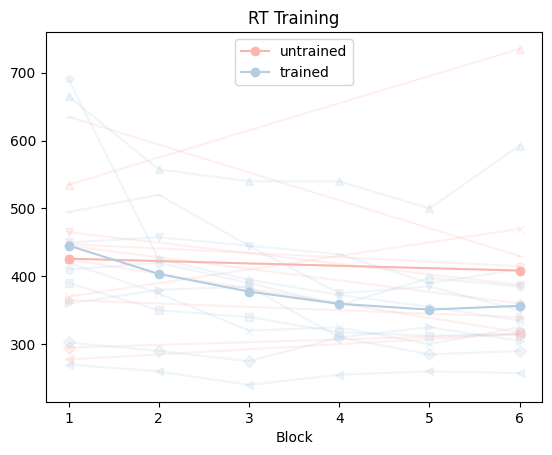

In [9]:
cmap = cm.Pastel1

markers = ['o', 's', '^', 'D', 'v', '>', '<', 'p', 'h', 'x', '_']

induction_blocks = subjs[subjs['BN'] <= num_pre_train_blocks+num_train_blocks+num_post_test_blocks]

induction_blocks = utils.remove_error_trials(induction_blocks)

induction_grouped = induction_blocks.groupby(['BN', 'SubNum', 'is_trained_seq']).agg({
    'RT': 'median'
}).reset_index()


for _, (subnum, subj_data) in enumerate(induction_grouped.groupby('SubNum')):
    for idx, (flag, data) in enumerate(subj_data.groupby('is_trained_seq')):
        plt.plot(data['BN'], data['RT'], marker = markers[subnum], color = cmap(idx), alpha = 0.2)



print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == False)]['RT'], 
                      induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == True)]['RT']))


print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == False)]['RT'], 
                      induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == True)]['RT']))



induction_grouped = induction_grouped.groupby(['BN', 'is_trained_seq']).agg({
    'RT': ['mean', 'std']
}).reset_index()

for idx, (flag, data) in enumerate(induction_grouped.groupby('is_trained_seq')):
    plt.plot(data['BN'], data['RT']['mean'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))
    # plt.errorbar(data['BN'], data['RT']['mean'], yerr= data['RT']['std'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag), capsize = 5)



plt.title('RT Training')
plt.xlabel('Block')

plt.legend()

plt.show()


TtestResult(statistic=-0.4108717563152595, pvalue=0.6907768994858039, df=9)
TtestResult(statistic=3.1486229912853387, pvalue=0.011763591236548366, df=9)


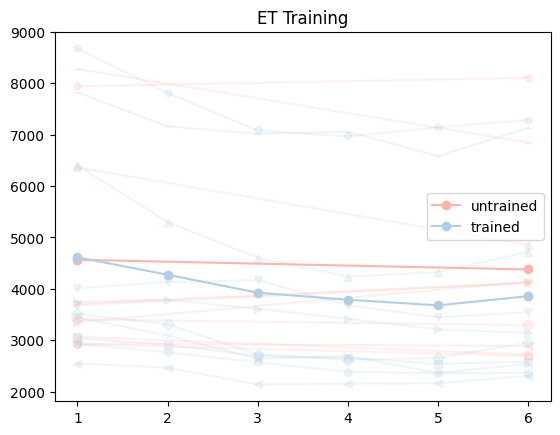

In [10]:
cmap = cm.Pastel1

markers = ['o', 's', '^', 'D', 'v', '>', '<', 'p', 'h', 'x', '_']

induction_blocks = subjs[subjs['BN'] <= num_pre_train_blocks+num_train_blocks+num_post_test_blocks]

induction_blocks = utils.remove_error_trials(induction_blocks)

induction_grouped = induction_blocks.groupby(['BN', 'SubNum', 'is_trained_seq']).agg({
    'norm_MT': 'median'
}).reset_index()


for subnum, subj_data in induction_grouped.groupby('SubNum'):
    for idx, (flag, data) in enumerate(subj_data.groupby('is_trained_seq')):
        plt.plot(data['BN'], data['norm_MT'], marker = markers[subnum], color = cmap(idx), alpha = 0.2)


print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == True)]['norm_MT']))


print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == True)]['norm_MT']))        

induction_grouped = induction_grouped.groupby(['BN', 'is_trained_seq']).agg({
    'norm_MT': ['mean', 'std']
}).reset_index()
for idx, (flag, data) in enumerate(induction_grouped.groupby('is_trained_seq')):
    plt.plot(data['BN'], data['norm_MT']['mean'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))


plt.title('ET Training')

plt.legend()

plt.show()

TtestResult(statistic=-0.4108717563152595, pvalue=0.6907768994858039, df=9)
TtestResult(statistic=3.1486229912853387, pvalue=0.011763591236548366, df=9)


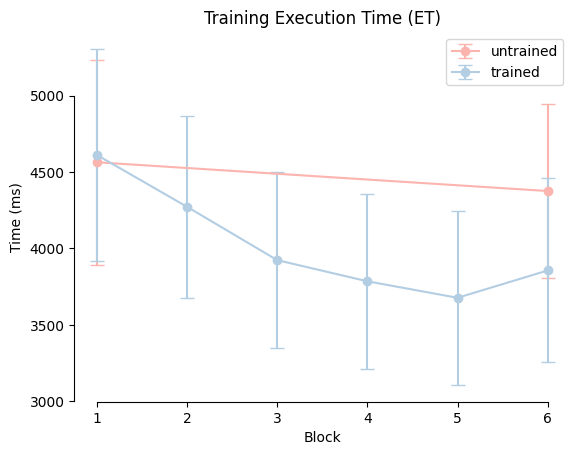

In [84]:
cmap = cm.Pastel1

markers = ['o', 's', '^', 'D', 'v', '>', '<', 'p', 'h', 'x', '_']

induction_blocks = subjs[subjs['BN'] <= num_pre_train_blocks+num_train_blocks+num_post_test_blocks]

induction_blocks = utils.remove_error_trials(induction_blocks)

induction_grouped = induction_blocks.groupby(['BN', 'SubNum', 'is_trained_seq']).agg({
    'norm_MT': 'median'
}).reset_index()


# for subnum, subj_data in induction_grouped.groupby('SubNum'):
#     for idx, (flag, data) in enumerate(subj_data.groupby('is_trained_seq')):
#         plt.plot(data['BN'], data['norm_MT'], marker = markers[subnum], color = cmap(idx), alpha = 0.2)


print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == True)]['norm_MT']))


print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == True)]['norm_MT']))        

induction_grouped = induction_grouped.groupby(['BN', 'is_trained_seq']).agg({
    'norm_MT': ['mean', 'sem']
}).reset_index()
for idx, (flag, data) in enumerate(induction_grouped.groupby('is_trained_seq')):
    # plt.plot(data['BN'], data['norm_MT']['mean'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))
    plt.errorbar(data['BN'], data['norm_MT']['mean'], yerr=data['norm_MT']['sem'],  capsize= 5, marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))


plt.title('Training Execution Time (ET)')
plt.ylabel('Time (ms)')
plt.xlabel('Block')

plt.legend()

sns.despine(trim=True)
plt.savefig(path_figs + "Training.pdf", format = 'pdf')
plt.show()

TtestResult(statistic=0.07224081883666333, pvalue=0.9439902063918193, df=9)
TtestResult(statistic=3.508016826384159, pvalue=0.006639287589247557, df=9)


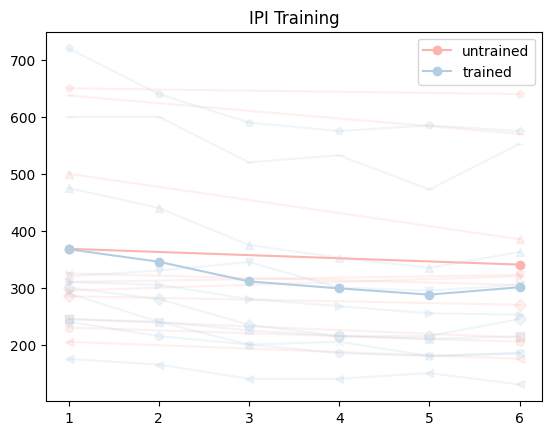

In [11]:

markers = ['o', 's', '^', 'D', 'v', '>', '<', 'p', 'h', 'x', '_']


induction_blocks = subjs_presses[subjs_presses['BN'] <= num_pre_train_blocks+num_train_blocks+num_post_test_blocks]

induction_blocks = utils.remove_error_trials_presses(induction_blocks)


induction_grouped = induction_blocks.groupby(['BN', 'SubNum', 'is_trained_seq']).agg({
    'IPI_Value': 'median'
}).reset_index()


for subnum, subj_data in induction_grouped.groupby('SubNum'):
    for idx, (flag, data) in enumerate(subj_data.groupby('is_trained_seq')):
        plt.plot(data['BN'], data['IPI_Value'], marker = markers[subnum], color = cmap(idx), alpha = 0.2)


        
print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == False)]['IPI_Value'], 
                      induction_grouped[(induction_grouped['BN'] == 1) & (induction_grouped['is_trained_seq'] == True)]['IPI_Value']))


print(stats.ttest_rel(induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == False)]['IPI_Value'], 
                      induction_grouped[(induction_grouped['BN'] == 6) & (induction_grouped['is_trained_seq'] == True)]['IPI_Value']))    


induction_grouped = induction_grouped.groupby(['BN', 'is_trained_seq']).agg({
    'IPI_Value': ['mean', 'std']
}).reset_index()
for idx, (flag, data) in enumerate(induction_grouped.groupby('is_trained_seq')):
    plt.plot(data['BN'], data['IPI_Value']['mean'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))


plt.title('IPI Training')

plt.legend()

plt.show()




## Session 2: Pre test and Post test analysis

TtestResult(statistic=1.9347525370328633, pvalue=0.08502206072850228, df=9)
TtestResult(statistic=4.573376016538085, pvalue=0.0013404223026311033, df=9)


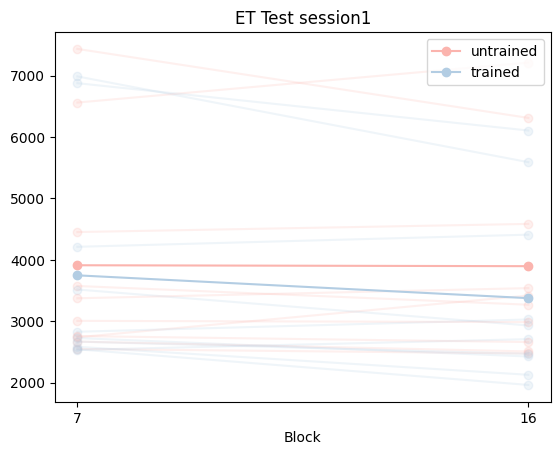

In [12]:
cmap = cm.Pastel1
session2_blocks = subjs[subjs['BN'].isin(test_session2_blocks_nums)]

sesssion2_blocks_pre_post = session2_blocks[session2_blocks['BN'].isin([7 , 16])]

sesssion2_blocks_pre_post = utils.remove_error_trials(sesssion2_blocks_pre_post)


session_grouped = sesssion2_blocks_pre_post.groupby(['BN', 'SubNum', 'is_trained_seq']).agg({
    'norm_MT': 'median'
}).reset_index()


for subnum, subj_data in session_grouped.groupby(['SubNum']):
    for idx, (flag, data) in enumerate(subj_data.groupby('is_trained_seq')):
        plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(idx), alpha = 0.2)


print(stats.ttest_rel(session_grouped[(session_grouped['BN'] == 7) & (session_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      session_grouped[(session_grouped['BN'] == 7) & (session_grouped['is_trained_seq'] == True)]['norm_MT']))


print(stats.ttest_rel(session_grouped[(session_grouped['BN'] == 16) & (session_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      session_grouped[(session_grouped['BN'] == 16) & (session_grouped['is_trained_seq'] == True)]['norm_MT'])) 

session_grouped = session_grouped.groupby(['BN', 'is_trained_seq']).agg({
    'norm_MT': 'mean'
}).reset_index()
for idx, (flag, data) in enumerate(session_grouped.groupby('is_trained_seq')):
    plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))
plt.xticks(data['BN'])


plt.title('ET Test session1')

plt.xlabel('Block')

plt.legend()

plt.show()

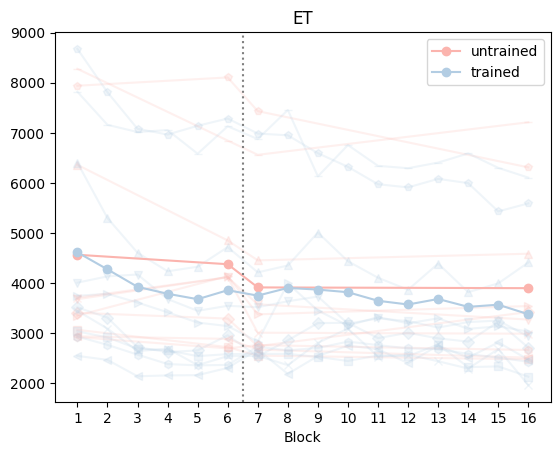

In [13]:
cmap = cm.Pastel1
session2_blocks = subjs[subjs['BN'].isin(range(1,17))]

markers = ['o', 's', '^', 'D', 'v', '>', '<', 'p', 'h', 'x', '_']


session2_blocks = utils.remove_error_trials(session2_blocks)

session_grouped = session2_blocks.groupby(['BN', 'SubNum', 'is_trained_seq', 'is_untrained_seq', 'is_rand_seq']).agg({
    'norm_MT': 'median'
}).reset_index()

for subnum, subj_data in session_grouped.groupby('SubNum'):
    for idx, ((flag_trained, flag_untrained), data) in enumerate(subj_data.groupby(['is_trained_seq', 'is_untrained_seq'])):
        if (flag_trained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = markers[subnum], color = cmap(1), alpha = 0.2)
        if (flag_untrained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = markers[subnum], color = cmap(0), alpha = 0.2)
            
        

session_grouped = session_grouped.groupby(['BN', 'is_trained_seq', 'is_untrained_seq', 'is_rand_seq']).agg({
    'norm_MT': 'mean'
}).reset_index()
for idx, ((flag_trained, flag_untrained), data) in enumerate(session_grouped.groupby(['is_trained_seq', 'is_untrained_seq'])):
        if (flag_trained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(1), label = (lambda x: 'trained' if x else 'untrained')(flag_trained))
        if (flag_untrained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(0), label = (lambda x: 'trained' if x else 'untrained')(flag_trained))


plt.axvline(x=6.5, color='gray', linestyle='dotted')

plt.xticks(range(1,17))


plt.title('ET')

plt.xlabel('Block')

plt.legend()

plt.show()

## Session 2: Main Analysis

### IPI Analysis:


In [18]:
a = {1:2, 2:3}

In [20]:
a.values()

dict_values([2, 3])

In [17]:
digit_change

[4, 6, 8]

Text(0.5, 1.0, 'changed vs unchanged')

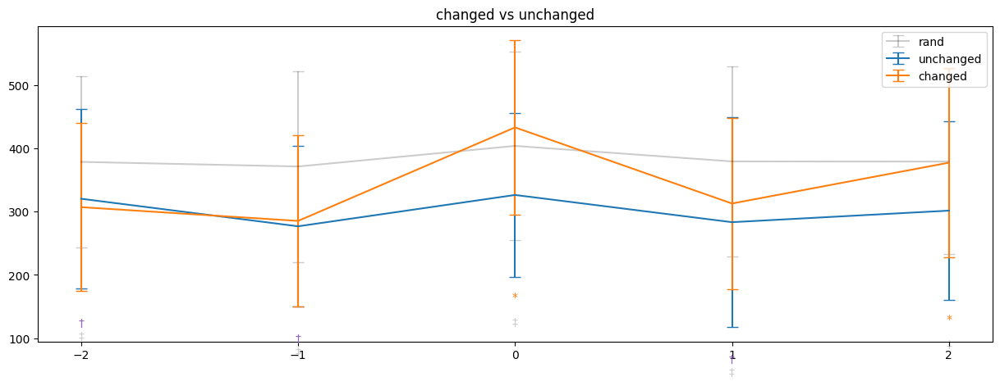

In [25]:
plt.figure(figsize=(15, 5))
cmap = cm.Pastel1
capsize = 5

lookback_window = 3

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)

finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
    if (flag_trained & flag_change):
        data['dist_to_change'] = (data['N'] - 1 - data['digitChangePos']) 
        data = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, lookback_window))]
        label = 'changed'

    if (flag_trained & ~flag_change):
        datas = {}
        for digitpos in digit_change:
            data['dist_to_change'] = (data['N'] - 1 - digitpos) 
            data_new = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, lookback_window))]
            datas[digitpos] = data_new
        data = pd.concat(list(datas.values()), ignore_index=True)
        label = 'unchanged'

    if (flag_rand):
        datas = {}
        for digitpos in digit_change:
            data['dist_to_change'] = (data['N'] - 1 - digitpos) 
            data_new = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, lookback_window))]
            datas[digitpos] = data_new
        data = pd.concat(list(datas.values()), ignore_index=True)
        label = 'rand'


    data = data.groupby(['SubNum', 'dist_to_change']).agg({
        'IPI_Value': 'median'
    }).reset_index()

    finger_aggs[label] = data

    finger_agg = data.groupby(['dist_to_change']).agg({
        'IPI_Value': ['mean', 'std']
    }).reset_index()

    finger_agg = finger_agg.iloc[index_natsorted(finger_agg['dist_to_change'])].reset_index(drop=True)
    plt.errorbar(finger_agg['dist_to_change'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])
    plt.xticks(finger_agg['dist_to_change'])



#Statistical Signficance Tests
merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'dist_to_change'], suffixes=('_changed', '_unchanged'))
merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'dist_to_change'])
merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

for IPI in merged_df['dist_to_change'].unique():
    IPI_data = merged_df[merged_df['dist_to_change'] == IPI]
    ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
    ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
    ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
    
    # Add significance symbols just above the error bars
    changed_mean = IPI_data['IPI_Value_changed'].mean()
    changed_std = IPI_data['IPI_Value_changed'].std()
    unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
    unchanged_std = IPI_data['IPI_Value_unchanged'].std()
    rand_mean = IPI_data['IPI_Value_rand'].mean()
    rand_std = IPI_data['IPI_Value_rand'].std()

    y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
    y_pos_unchanged = unchanged_mean - unchanged_std 
    y_pos_rand = rand_mean - rand_std

    y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

    if ttest_changed_vs_unchanged.pvalue < 0.05:
        plt.text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

    if ttest_changed_vs_rand.pvalue < 0.05:
        plt.text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

    if ttest_unchanged_vs_rand.pvalue < 0.05:
        plt.text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)




plt.legend(loc = 'upper right')

plt.title(f'changed vs unchanged')

IPI:  IPI0 TtestResult(statistic=-0.9382108083784176, pvalue=0.37262985714287844, df=9)
IPI:  IPI1 TtestResult(statistic=0.5460557005223248, pvalue=0.5983005555276759, df=9)
IPI:  IPI10 TtestResult(statistic=0.3071475584169756, pvalue=0.7657191878510456, df=9)
IPI:  IPI2 TtestResult(statistic=-1.1138250694977778, pvalue=0.29421500342195883, df=9)
IPI:  IPI3 TtestResult(statistic=-1.103923688023844, pvalue=0.29826557334216974, df=9)
IPI:  IPI4 TtestResult(statistic=0.6234446538249134, pvalue=0.5484645106688006, df=9)
IPI:  IPI5 TtestResult(statistic=-0.9780675089485068, pvalue=0.35359758396894503, df=9)
IPI:  IPI6 TtestResult(statistic=1.2925888601730253, pvalue=0.22835017347346792, df=9)
IPI:  IPI7 TtestResult(statistic=-0.27550386091551227, pvalue=0.7891500954182263, df=9)
IPI:  IPI8 TtestResult(statistic=2.89068174686032, pvalue=0.017864420831136145, df=9)
IPI:  IPI9 TtestResult(statistic=3.5672387877878773, pvalue=0.006050328817145206, df=9)


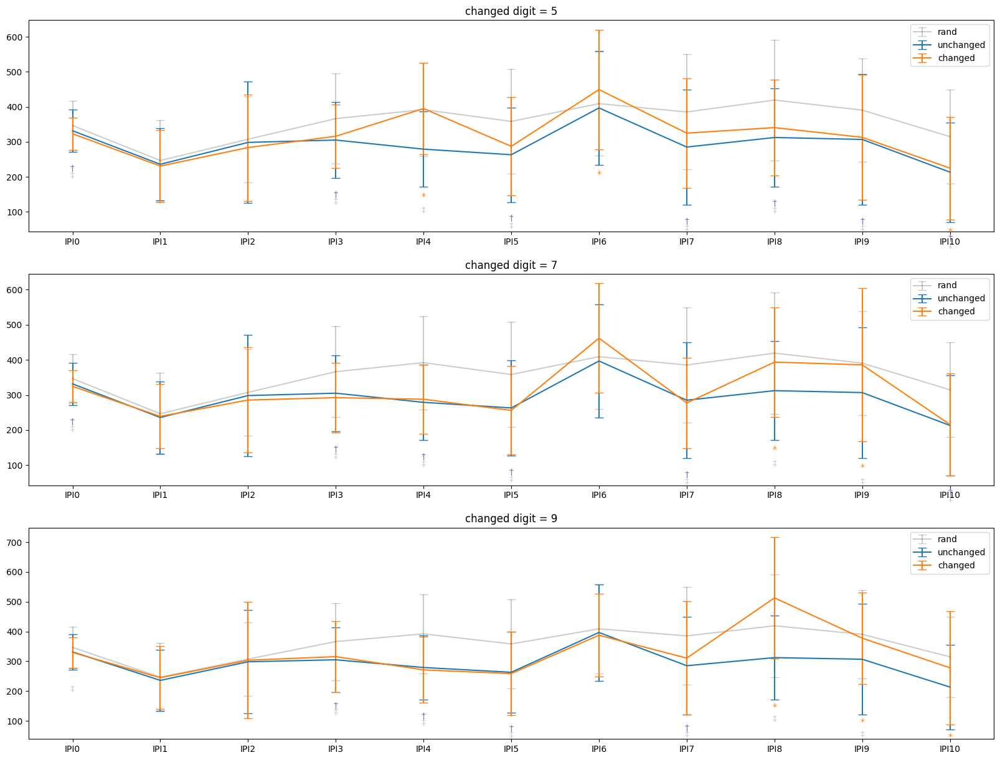

In [16]:
fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)

finger_aggs = {}

for idx, change in enumerate(digit_change):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            data = data[data['digitChangePos'] == change]

            label = 'changed'

        if (flag_trained & ~flag_change):

            label = 'unchanged'

        if (flag_rand):

            label = 'rand'


        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])



    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(change == 6):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)



    
    axs[idx].legend()

    axs[idx].set_title(f'changed digit = {change + 1}')

IPI:  IPI0 TtestResult(statistic=-0.466002335770648, pvalue=0.6522860613181687, df=9)
IPI:  IPI1 TtestResult(statistic=0.20507577810739896, pvalue=0.8420760433785544, df=9)
IPI:  IPI10 TtestResult(statistic=4.129483209670112, pvalue=0.0025614603121131654, df=9)
IPI:  IPI2 TtestResult(statistic=-1.315466713716892, pvalue=0.22087676660028663, df=9)
IPI:  IPI3 TtestResult(statistic=2.207350958677468, pvalue=0.05468103282636013, df=9)
IPI:  IPI4 TtestResult(statistic=3.127090659991963, pvalue=0.012178655323341737, df=9)
IPI:  IPI5 TtestResult(statistic=1.917336169102632, pvalue=0.08742871841293258, df=9)
IPI:  IPI6 TtestResult(statistic=3.0747635321157967, pvalue=0.013251596802366632, df=9)
IPI:  IPI7 TtestResult(statistic=3.3684888967224076, pvalue=0.00827681608007578, df=9)
IPI:  IPI8 TtestResult(statistic=2.589247891896881, pvalue=0.029249535104015737, df=9)
IPI:  IPI9 TtestResult(statistic=2.558199529721406, pvalue=0.03077790703186351, df=9)


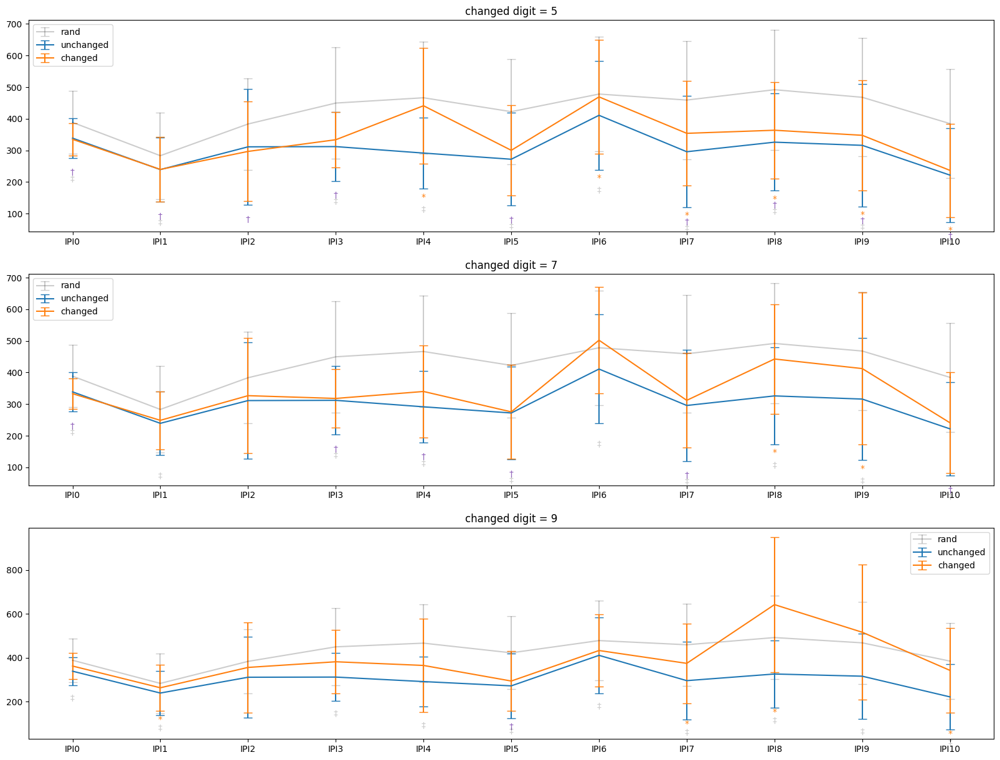

In [18]:
fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))].copy()

session2_blocks['IPI_Value'] = session2_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# session2_blocks = utils.remove_error_trials_presses(session2_blocks)

finger_aggs = {}


for idx, change in enumerate(digit_change):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            data = data[data['digitChangePos'] == change]

            label = 'changed'

        if (flag_trained & ~flag_change):

            label = 'unchanged'

        if (flag_rand):

            label = 'rand'


        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])



    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(change == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'changed digit = {change + 1}')

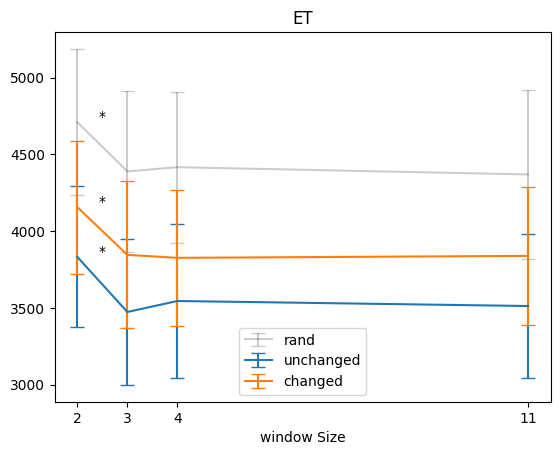

In [19]:
test_blocks = subjs[subjs['BN'].isin(list(range(8,16)))]

test_blocks = utils.remove_error_trials(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'norm_MT': lambda x: np.percentile(x, 50)
    }).reset_index()
        
    data_agged = data.groupby('windowSize').agg({
        'norm_MT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['norm_MT']['mean'], yerr = data_agged['norm_MT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['norm_MT']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['norm_MT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['norm_MT'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')





plt.xticks(data_agged['windowSize'])
plt.title('ET')
plt.legend()
plt.xlabel('window Size')
plt.show()


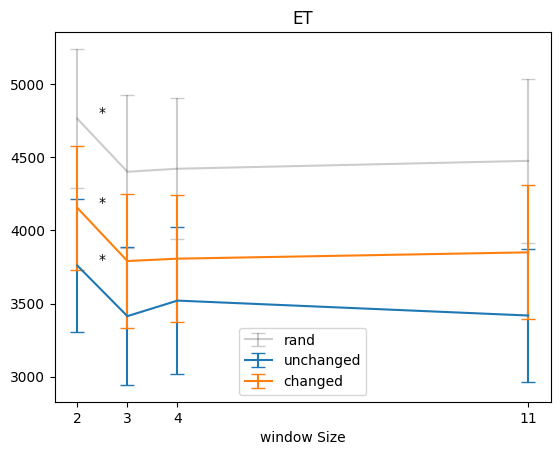

In [20]:
test_blocks = subjs[subjs['BN'].isin(list(range(8,16)))].copy()

test_blocks['norm_MT'] = test_blocks.apply(utils.correct_error_trial, axis = 1)

# test_blocks = utils.remove_error_trials(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'norm_MT': lambda x: np.percentile(x, 40)
    }).reset_index()
        
    data_agged = data.groupby('windowSize').agg({
        'norm_MT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['norm_MT']['mean'], yerr = data_agged['norm_MT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['norm_MT']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['norm_MT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['norm_MT'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')





plt.xticks(data_agged['windowSize'])
plt.title('ET')
plt.legend()
plt.xlabel('window Size')
plt.show()


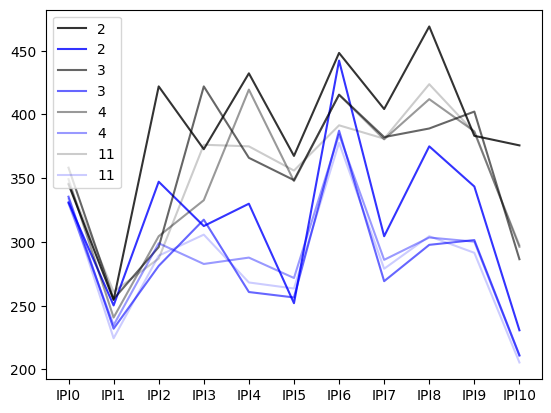

In [21]:
# fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)



for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & ~flag_change):

            finger_agg_unchnaged = data.groupby(['SubNum', 'IPI_Number']).agg({
                'IPI_Value': 'median'
            }).reset_index()


            finger_agg_unchnaged = finger_agg_unchnaged.groupby(['IPI_Number']).agg({
                'IPI_Value': ['mean', 'sem']
            }).reset_index()

            finger_agg_unchnaged = finger_agg_unchnaged.iloc[index_natsorted(finger_agg_unchnaged['IPI_Number'])].reset_index(drop=True)
            # plt.errorbar(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'], yerr = finger_agg_unchnaged['IPI_Value']['sem'], label = window, capsize = capsize,alpha = (len(windowSizes) - idx)/(len(windowSizes)+1), color = 'blue')
            plt.errorbar(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'], label = window, alpha = (len(windowSizes) - idx)/(len(windowSizes)+1), color = 'blue')



        if (flag_rand):

            finger_agg_rand = data.groupby(['SubNum', 'IPI_Number']).agg({
                'IPI_Value': 'median'
            }).reset_index()

            finger_agg_rand = finger_agg_rand.groupby(['IPI_Number']).agg({
                'IPI_Value': ['mean', 'std']
            }).reset_index()

            finger_agg_rand = finger_agg_rand.iloc[index_natsorted(finger_agg_rand['IPI_Number'])].reset_index(drop=True)
            # plt.errorbar(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'], yerr = finger_agg_rand['IPI_Value']['std'], color = 'black', label = window, capsize = capsize, alpha = 0.2)
            plt.errorbar(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'], label = window, capsize = capsize, alpha = (len(windowSizes) - idx)/(len(windowSizes)+1), color = 'black')

    
    plt.legend()

    # axs[idx].set_title(f'window = {window}')


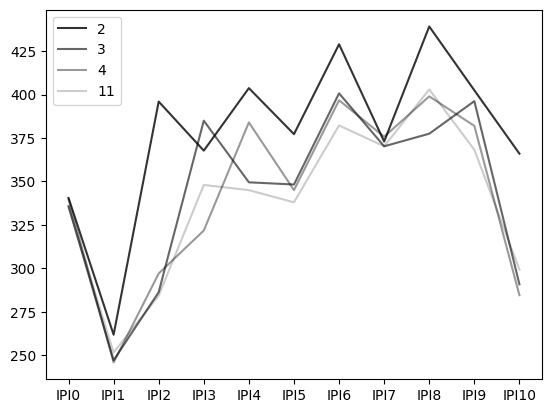

In [22]:
# fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5


session2_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)



for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        # if (flag_trained & ~flag_change):

        #     finger_agg_unchnaged = data.groupby(['SubNum', 'IPI_Number']).agg({
        #         'IPI_Value': 'median'
        #     }).reset_index()


        #     finger_agg_unchnaged = finger_agg_unchnaged.groupby(['IPI_Number']).agg({
        #         'IPI_Value': ['mean', 'std']
        #     }).reset_index()

        #     finger_agg_unchnaged = finger_agg_unchnaged.iloc[index_natsorted(finger_agg_unchnaged['IPI_Number'])].reset_index(drop=True)
        #     # plt.errorbar(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'], yerr = finger_agg_unchnaged['IPI_Value']['std'], label = window, capsize = capsize)
        #     plt.errorbar(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'], label = window)



        if (flag_rand):

            finger_agg_rand = data.groupby(['SubNum', 'IPI_Number']).agg({
                'IPI_Value': 'median'
            }).reset_index()


            finger_agg_rand = finger_agg_rand.groupby(['IPI_Number']).agg({
                'IPI_Value': ['mean', 'sem']
            }).reset_index()

            finger_agg_rand = finger_agg_rand.iloc[index_natsorted(finger_agg_rand['IPI_Number'])].reset_index(drop=True)
            # plt.errorbar(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'], yerr = finger_agg_rand['IPI_Value']['sem'], color = 'black', label = window, capsize = capsize, alpha = 0.2)
            plt.errorbar(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'], label = window, capsize = capsize, alpha = (len(windowSizes) - idx)/(len(windowSizes)+1), color='black')

    
    plt.legend()

    # axs[idx].set_title(f'window = {window}')


In [23]:
cmap = cm.Pastel1
capsize = 5


test_blocks = subjs[subjs['BN'].isin(list(range(8,16)))].copy()

# session2_blocks = session2_blocks[session2_blocks['SubNum'] != 8]

test_blocks['norm_MT'] = test_blocks.apply(utils.correct_error_trial, axis = 1)




for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            for (digit, changed_data) in data.groupby('digitChangePos'):
                for (subnum, sub_data) in changed_data.groupby('SubNum'):
                    if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                         print(f"subj{subnum}_window{window}_changed{digit+1}_acc {len(sub_data[sub_data['isError'] == 0]) / len(sub_data)}")
                        #  if (subnum == 9 and window == 11):
                        #      print(sub_data['norm_MT'])
                        #      print(np.percentile(sub_data['norm_MT'], 0))
    

        if (flag_trained & ~flag_change):

            for (subnum, sub_data) in data.groupby('SubNum'):
                 if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                    print(f"subj{subnum}_window{window}_unchanged_acc {len(sub_data[sub_data['isError'] == 0]) / len(sub_data)}")

        if (flag_rand):
            for (subnum, sub_data) in data.groupby('SubNum'):
                 if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                    print(f"subj{subnum}_window{window}_rand_acc {round(len(sub_data[sub_data['isError'] == 0]) / len(sub_data), 2)}")



subj4_window2_rand_acc 0.58
subj8_window2_changed7_acc 0.5
subj2_window2_changed9_acc 0.5
subj3_window2_changed9_acc 0.5
subj6_window2_changed9_acc 0.5
subj9_window2_changed9_acc 0.5
subj5_window3_changed5_acc 0.5
subj9_window3_changed7_acc 0.5
subj4_window3_changed9_acc 0.5
subj2_window4_rand_acc 0.58
subj4_window4_rand_acc 0.54
subj6_window4_rand_acc 0.58
subj2_window4_changed5_acc 0.5
subj10_window4_changed7_acc 0.5
subj3_window4_changed9_acc 0.25
subj4_window4_changed9_acc 0.5
subj2_window11_rand_acc 0.5
subj6_window11_rand_acc 0.46
subj3_window11_changed7_acc 0.5
subj3_window11_changed9_acc 0.5
subj4_window11_changed9_acc 0.5
subj7_window11_changed9_acc 0.5
subj9_window11_changed9_acc 0.25


IPI:  IPI0 TtestResult(statistic=0.5825142445888235, pvalue=0.5745219378434523, df=9)
IPI:  IPI1 TtestResult(statistic=0.4466063805620691, pvalue=0.6657119235315339, df=9)
IPI:  IPI10 TtestResult(statistic=1.1227496970154056, pvalue=0.2906011983853332, df=9)
IPI:  IPI2 TtestResult(statistic=-1.1076924441000822, pvalue=0.29671868231564413, df=9)
IPI:  IPI3 TtestResult(statistic=1.3466079929344437, pvalue=0.2110354686786714, df=9)
IPI:  IPI4 TtestResult(statistic=1.7842019405859857, pvalue=0.10805665597818373, df=9)
IPI:  IPI5 TtestResult(statistic=0.5170578091771423, pvalue=0.6175816758086823, df=9)
IPI:  IPI6 TtestResult(statistic=2.739248075540826, pvalue=0.022875702311658162, df=9)
IPI:  IPI7 TtestResult(statistic=3.2915021185782503, pvalue=0.009355892351768506, df=9)
IPI:  IPI8 TtestResult(statistic=1.1167685282552322, pvalue=0.2930192338974477, df=9)
IPI:  IPI9 TtestResult(statistic=0.2525571382052937, pvalue=0.8062840244379883, df=9)


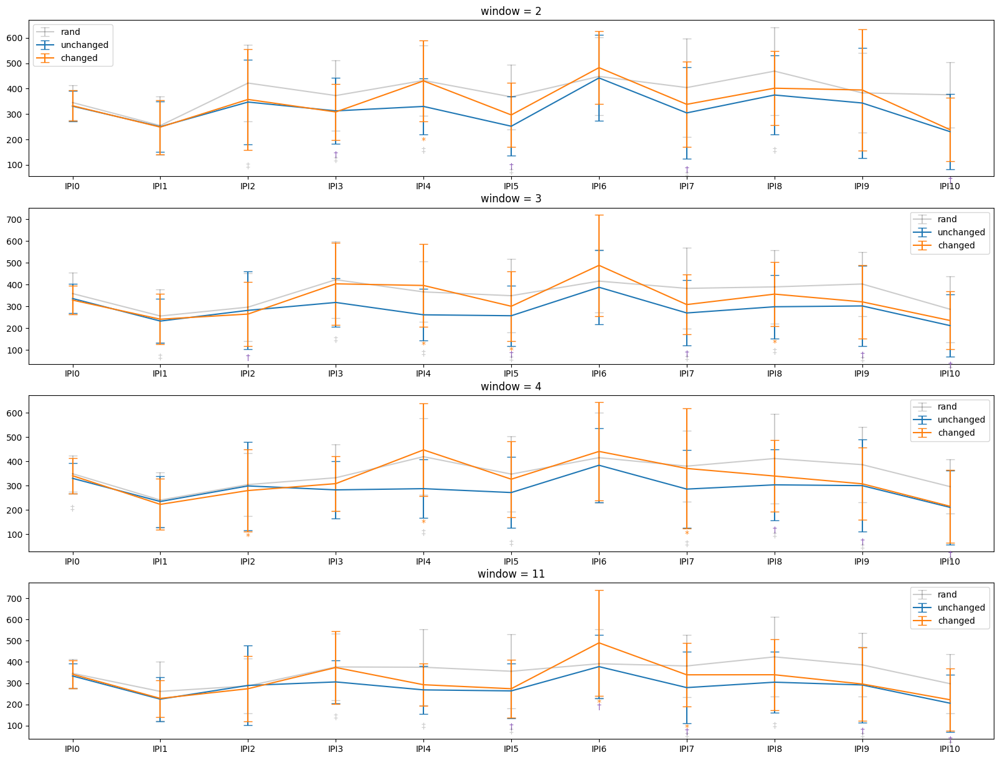

In [24]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 4]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=1.8675343983616577, pvalue=0.09466998859366277, df=9)
IPI:  IPI1 TtestResult(statistic=1.4938505238318491, pvalue=0.16942090698417317, df=9)
IPI:  IPI10 TtestResult(statistic=1.660519961499972, pvalue=0.13117919379223084, df=9)
IPI:  IPI2 TtestResult(statistic=0.8168395660523434, pvalue=0.4351082978993791, df=9)
IPI:  IPI3 TtestResult(statistic=1.2693995520892052, pvalue=0.23613963937308396, df=9)
IPI:  IPI4 TtestResult(statistic=2.7591289028742336, pvalue=0.02214368248327706, df=9)
IPI:  IPI5 TtestResult(statistic=0.9250101493202272, pvalue=0.3790951150632016, df=9)
IPI:  IPI6 TtestResult(statistic=2.8682113323127147, pvalue=0.018530647972142447, df=9)
IPI:  IPI7 TtestResult(statistic=3.493970435308754, pvalue=0.006787601753640592, df=9)
IPI:  IPI8 TtestResult(statistic=1.211058608292458, pvalue=0.25671299230311156, df=9)
IPI:  IPI9 TtestResult(statistic=0.8338141622312165, pvalue=0.4259613970678151, df=9)


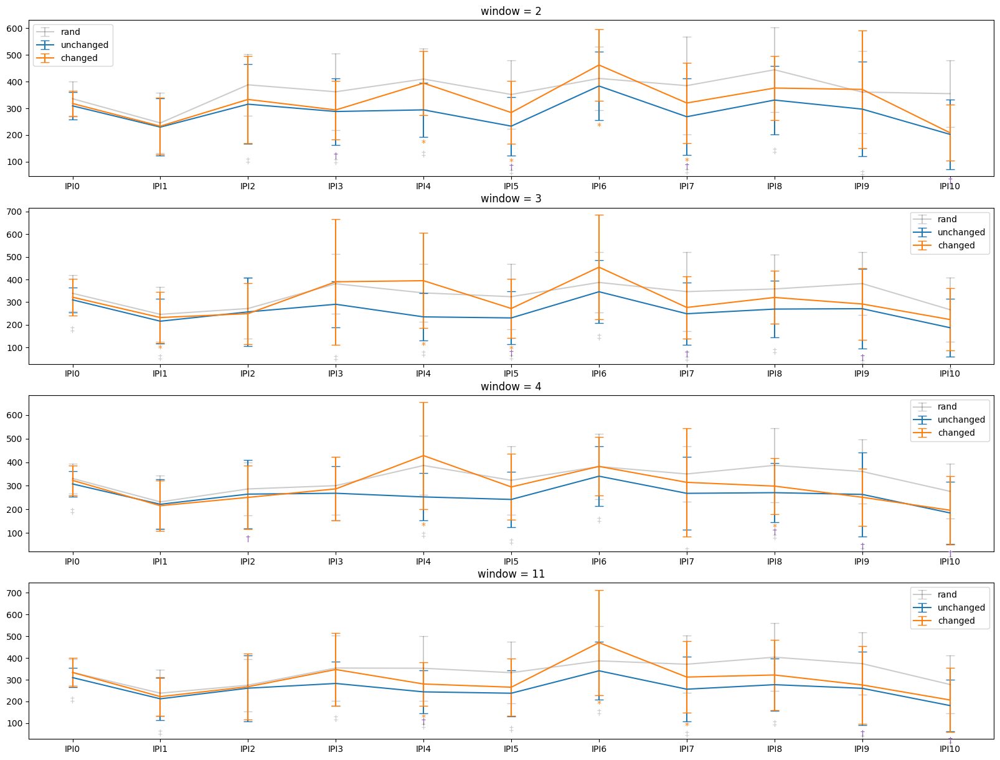

In [25]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))].copy()

# session2_blocks = session2_blocks[session2_blocks['SubNum'] != 2]

session2_blocks['IPI_Value'] = session2_blocks.apply(utils.correct_error_trial_IPI, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 4]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=-0.2664678000520716, pvalue=0.7958834697338083, df=9)
IPI:  IPI1 TtestResult(statistic=0.8393958730398579, pvalue=0.42298258895054797, df=9)
IPI:  IPI10 TtestResult(statistic=0.13889782036305579, pvalue=0.892589230736957, df=9)
IPI:  IPI2 TtestResult(statistic=-0.17305414365710536, pvalue=0.866438288669295, df=9)
IPI:  IPI3 TtestResult(statistic=0.45337524449451005, pvalue=0.6610118864732828, df=9)
IPI:  IPI4 TtestResult(statistic=1.1641728789346957, pvalue=0.2742855242220778, df=9)
IPI:  IPI5 TtestResult(statistic=1.5602094816335776, pvalue=0.15314228160693874, df=9)
IPI:  IPI6 TtestResult(statistic=-0.4235116382794013, pvalue=0.6818633912769312, df=9)
IPI:  IPI7 TtestResult(statistic=1.944242426569767, pvalue=0.08373723711960056, df=9)
IPI:  IPI8 TtestResult(statistic=1.8337052291971283, pvalue=0.09990595922350623, df=9)
IPI:  IPI9 TtestResult(statistic=2.3541222055522537, pvalue=0.04301361717908178, df=9)


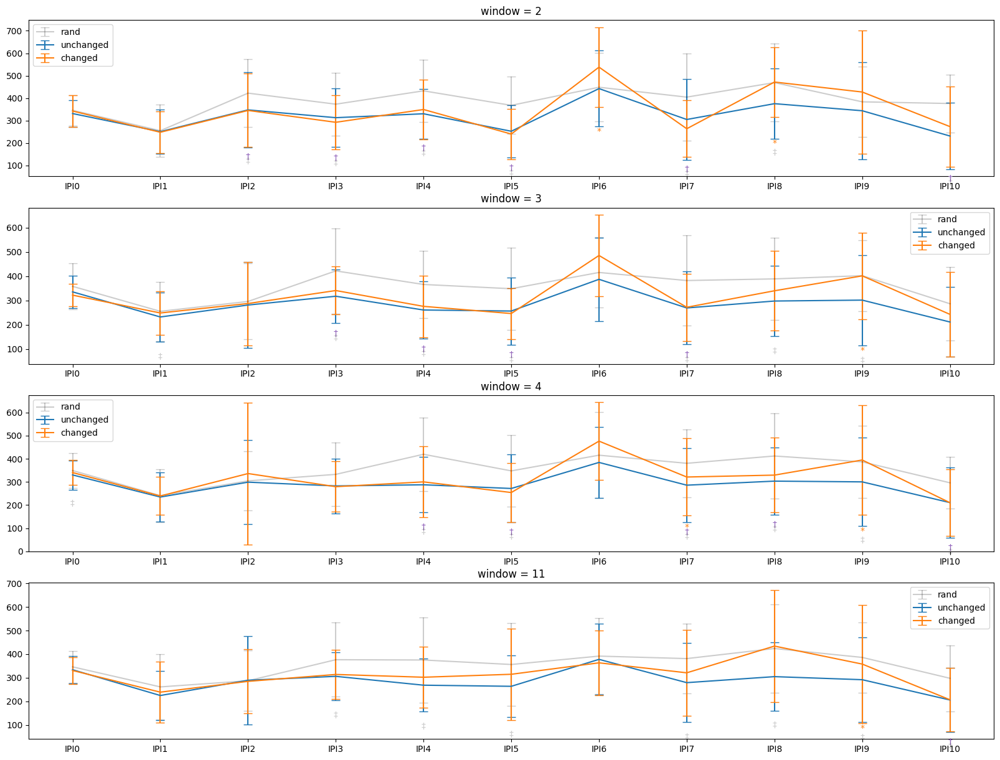

In [26]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 6]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=1.5084089518206647, pvalue=0.16572419462595467, df=9)
IPI:  IPI1 TtestResult(statistic=1.1272520932406718, pvalue=0.288791401569353, df=9)
IPI:  IPI10 TtestResult(statistic=2.6217441231166747, pvalue=0.027731515886816292, df=9)
IPI:  IPI2 TtestResult(statistic=0.9374095906261459, pvalue=0.3730199713089939, df=9)
IPI:  IPI3 TtestResult(statistic=1.0496710053659586, pvalue=0.3212373109913374, df=9)
IPI:  IPI4 TtestResult(statistic=2.1424315132017604, pvalue=0.0607804099369367, df=9)
IPI:  IPI5 TtestResult(statistic=1.5621784954939646, pvalue=0.1526812405713664, df=9)
IPI:  IPI6 TtestResult(statistic=0.7165338716523945, pvalue=0.4918355748615888, df=9)
IPI:  IPI7 TtestResult(statistic=2.8040093853583015, pvalue=0.02057741715465621, df=9)
IPI:  IPI8 TtestResult(statistic=1.8078994751169395, pvalue=0.10408063739905851, df=9)
IPI:  IPI9 TtestResult(statistic=2.3515677726393784, pvalue=0.04319400265028748, df=9)


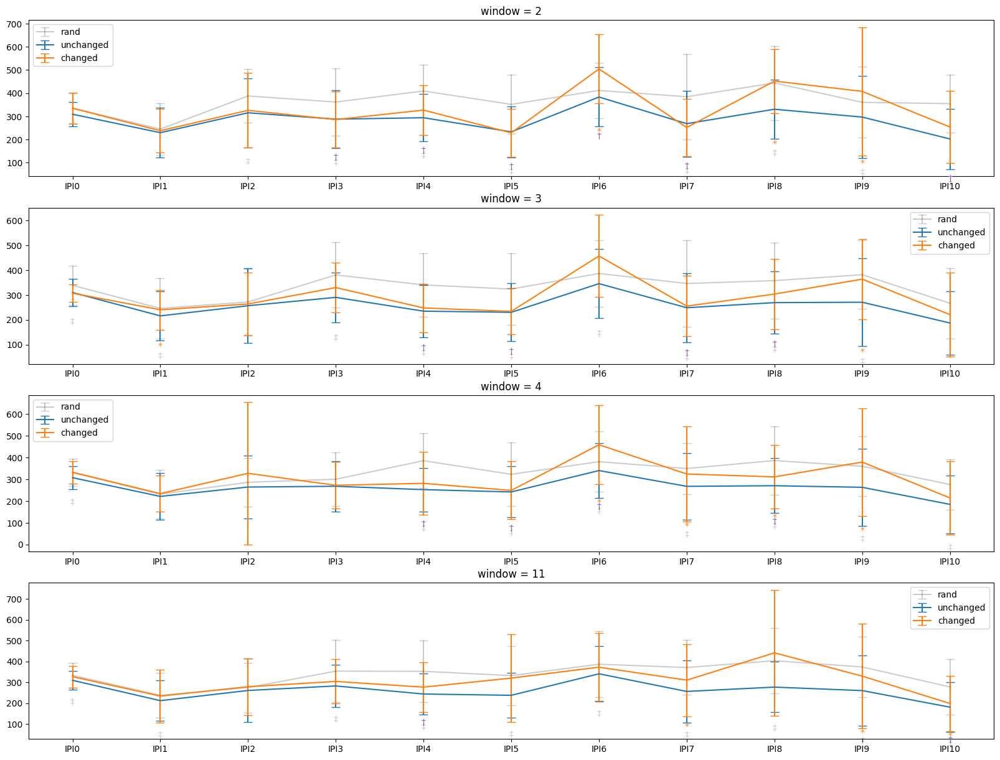

In [27]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))].copy()

# session2_blocks = session2_blocks[session2_blocks['SubNum'] != 2]

session2_blocks['IPI_Value'] = session2_blocks.apply(utils.correct_error_trial_IPI, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 6]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=0.819931725671605, pvalue=0.4334322059227196, df=9)
IPI:  IPI1 TtestResult(statistic=1.928949988086032, pvalue=0.0858168313405067, df=9)
IPI:  IPI10 TtestResult(statistic=1.8806862617653208, pvalue=0.0927047167636944, df=9)
IPI:  IPI2 TtestResult(statistic=1.1372826035282604, pvalue=0.2847915575892993, df=9)
IPI:  IPI3 TtestResult(statistic=0.8263209655930053, pvalue=0.42998284834822664, df=9)
IPI:  IPI4 TtestResult(statistic=0.8875864128700164, pvalue=0.3978622839246233, df=9)
IPI:  IPI5 TtestResult(statistic=0.7080741468749018, pvalue=0.49682632131979054, df=9)
IPI:  IPI6 TtestResult(statistic=0.7777335207671737, pvalue=0.4566828905148689, df=9)
IPI:  IPI7 TtestResult(statistic=1.3535404092920207, pvalue=0.20889592760297795, df=9)
IPI:  IPI8 TtestResult(statistic=2.904769506508425, pvalue=0.017459270134795302, df=9)
IPI:  IPI9 TtestResult(statistic=1.5532718622551784, pvalue=0.15477661319531885, df=9)


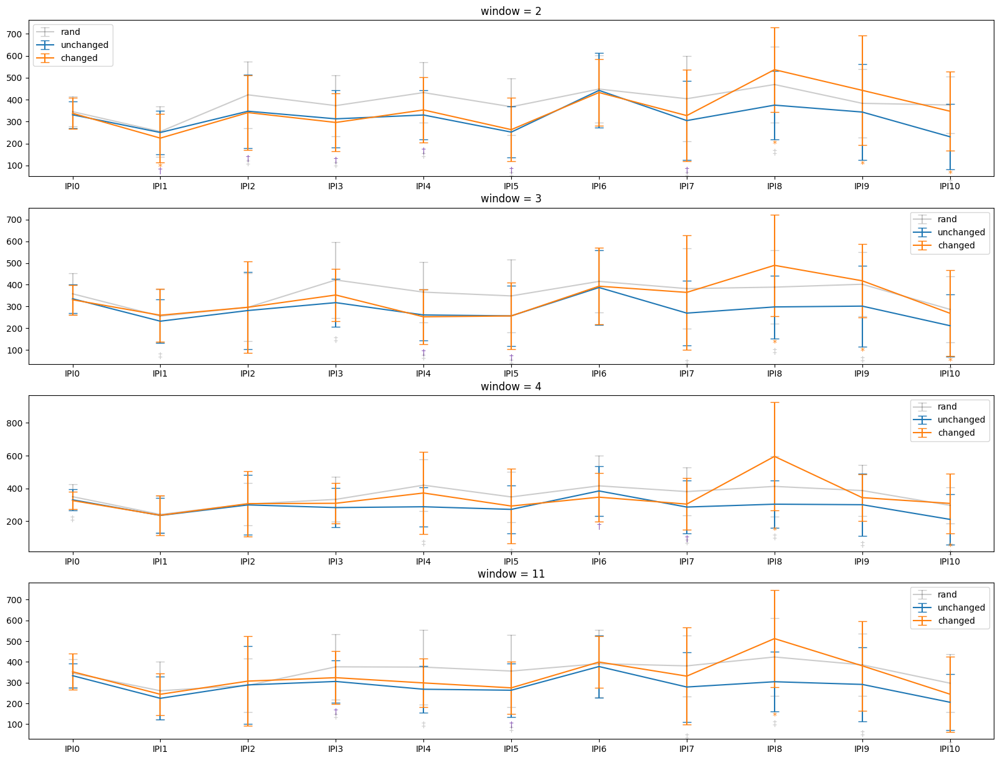

In [28]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))]

session2_blocks = utils.remove_error_trials_presses(session2_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 8]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


/Users/amin/Library/Python/3.9/lib/python/site-packages/numpy/lib/function_base.py:4658: RuntimeWarning: invalid value encountered in subtract
  subtract(b, diff_b_a * (1 - t), out=lerp_interpolation, where=t >= 0.5,
/Users/amin/Library/Python/3.9/lib/python/site-packages/numpy/lib/function_base.py:4658: RuntimeWarning: invalid value encountered in subtract
  subtract(b, diff_b_a * (1 - t), out=lerp_interpolation, where=t >= 0.5,


IPI:  IPI0 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI1 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI10 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI2 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI3 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI4 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI5 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI6 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI7 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI8 TtestResult(statistic=nan, pvalue=nan, df=nan)
IPI:  IPI9 TtestResult(statistic=nan, pvalue=nan, df=nan)


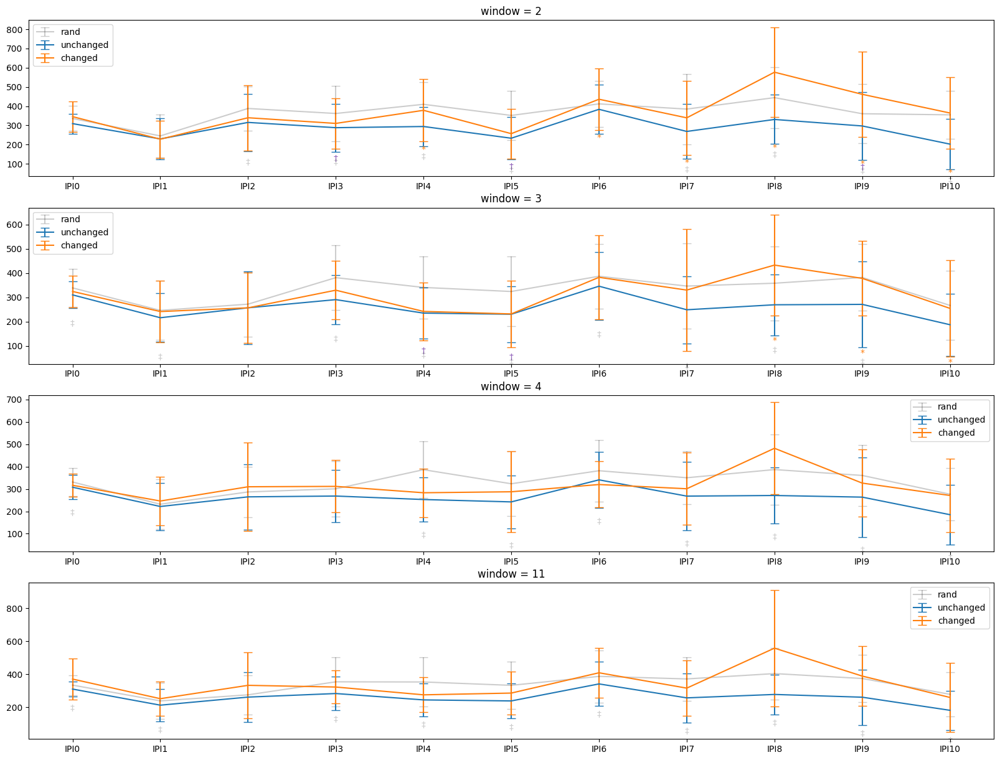

In [29]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session2_blocks = subjs_presses[subjs_presses['BN'].isin(range(8,16))].copy()

# session2_blocks = session2_blocks[session2_blocks['SubNum'] != 2]

session2_blocks['IPI_Value'] = session2_blocks.apply(utils.correct_error_trial_IPI, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session2_blocks[session2_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 8]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x : np.percentile(x, 30)
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()


        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


## Session 3: Pre test and Post test analysis

TtestResult(statistic=3.0182865157755865, pvalue=0.014519566054197696, df=9)
TtestResult(statistic=5.158729203905339, pvalue=0.0005961075900210592, df=9)


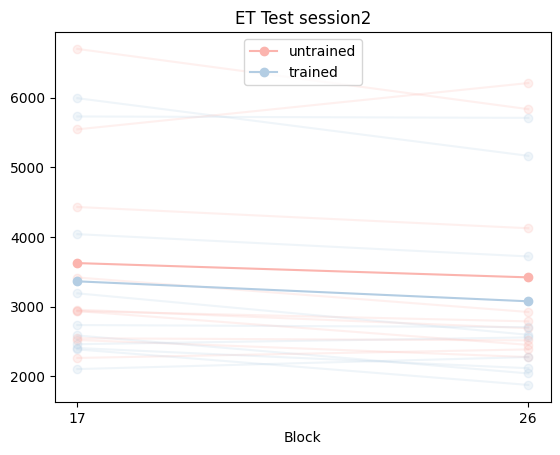

In [30]:
cmap = cm.Pastel1
session3_blocks = subjs[subjs['BN'].isin(test_session3_blocks_nums)]

sesssion3_blocks_pre_post = session3_blocks[session3_blocks['BN'].isin([17 , 26])]

sesssion3_blocks_pre_post = utils.remove_error_trials(sesssion3_blocks_pre_post)


session_grouped = sesssion3_blocks_pre_post.groupby(['BN', 'SubNum', 'is_trained_seq']).agg({
    'norm_MT': 'median'
}).reset_index()


for subnum, subj_data in session_grouped.groupby(['SubNum']):
    for idx, (flag, data) in enumerate(subj_data.groupby('is_trained_seq')):
        plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(idx), alpha = 0.2)


print(stats.ttest_rel(session_grouped[(session_grouped['BN'] == 17) & (session_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      session_grouped[(session_grouped['BN'] == 17) & (session_grouped['is_trained_seq'] == True)]['norm_MT']))


print(stats.ttest_rel(session_grouped[(session_grouped['BN'] == 26) & (session_grouped['is_trained_seq'] == False)]['norm_MT'], 
                      session_grouped[(session_grouped['BN'] == 26) & (session_grouped['is_trained_seq'] == True)]['norm_MT'])) 


session_grouped = session_grouped.groupby(['BN', 'is_trained_seq']).agg({
    'norm_MT': 'mean'
}).reset_index()
for idx, (flag, data) in enumerate(session_grouped.groupby('is_trained_seq')):
    plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(idx), label = (lambda x: 'trained' if x else 'untrained')(flag))
plt.xticks(data['BN'])


plt.title('ET Test session2')

plt.xlabel('Block')

plt.legend()

plt.show()

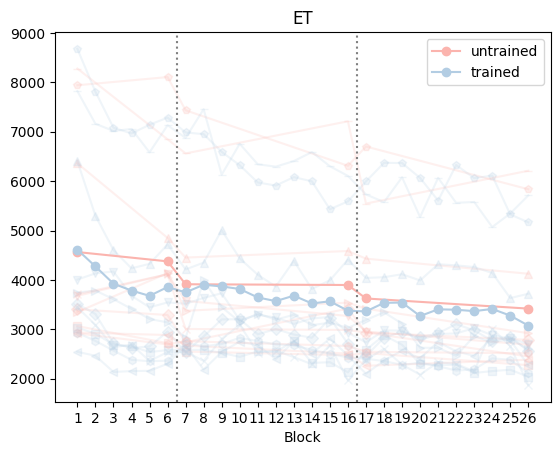

In [31]:
cmap = cm.Pastel1
test_blocks = subjs[subjs['BN'].isin(range(1,27))]

markers = ['o', 's', '^', 'D', 'v', '>', '<', 'p', 'h', 'x', '_']


test_blocks = utils.remove_error_trials(test_blocks)

session_grouped = test_blocks.groupby(['BN', 'SubNum', 'is_trained_seq', 'is_untrained_seq', 'is_rand_seq']).agg({
    'norm_MT': 'median'
}).reset_index()

for subnum, subj_data in session_grouped.groupby('SubNum'):
    for idx, ((flag_trained, flag_untrained), data) in enumerate(subj_data.groupby(['is_trained_seq', 'is_untrained_seq'])):
        if (flag_trained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = markers[subnum], color = cmap(1), alpha = 0.2)
        if (flag_untrained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = markers[subnum], color = cmap(0), alpha = 0.2)
            
        

session_grouped = session_grouped.groupby(['BN', 'is_trained_seq', 'is_untrained_seq', 'is_rand_seq']).agg({
    'norm_MT': 'mean'
}).reset_index()
for idx, ((flag_trained, flag_untrained), data) in enumerate(session_grouped.groupby(['is_trained_seq', 'is_untrained_seq'])):
        if (flag_trained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(1), label = (lambda x: 'trained' if x else 'untrained')(flag_trained))
        if (flag_untrained == True):
            plt.plot(data['BN'], data['norm_MT'], marker = 'o', color = cmap(0), label = (lambda x: 'trained' if x else 'untrained')(flag_trained))

plt.axvline(x=6.5, color='gray', linestyle='dotted')

plt.axvline(x=16.5, color='gray', linestyle='dotted')

plt.xticks(range(1,27))


plt.title('ET')

plt.xlabel('Block')

plt.legend()

plt.show()

## Session3 Analysis:


## IPI Analysis:

IPI:  IPI0 TtestResult(statistic=2.388089256503974, pvalue=0.04068462656260952, df=9)
IPI:  IPI1 TtestResult(statistic=0.5749611366245192, pvalue=0.5794048776860065, df=9)
IPI:  IPI10 TtestResult(statistic=4.163902886514303, pvalue=0.0024335577764284283, df=9)
IPI:  IPI2 TtestResult(statistic=1.2265689754359308, pvalue=0.2511052100694778, df=9)
IPI:  IPI3 TtestResult(statistic=3.612418998402464, pvalue=0.005637998266388569, df=9)
IPI:  IPI4 TtestResult(statistic=1.6632255571560222, pvalue=0.13062838153338746, df=9)
IPI:  IPI5 TtestResult(statistic=3.582226153336756, pvalue=0.005910147888548757, df=9)
IPI:  IPI6 TtestResult(statistic=0.9615239476408232, pvalue=0.3614084835035839, df=9)
IPI:  IPI7 TtestResult(statistic=1.6267601472748061, pvalue=0.1382314347032274, df=9)
IPI:  IPI8 TtestResult(statistic=3.9856385357027984, pvalue=0.0031786013937887022, df=9)
IPI:  IPI9 TtestResult(statistic=4.52756046665824, pvalue=0.0014311926250575014, df=9)


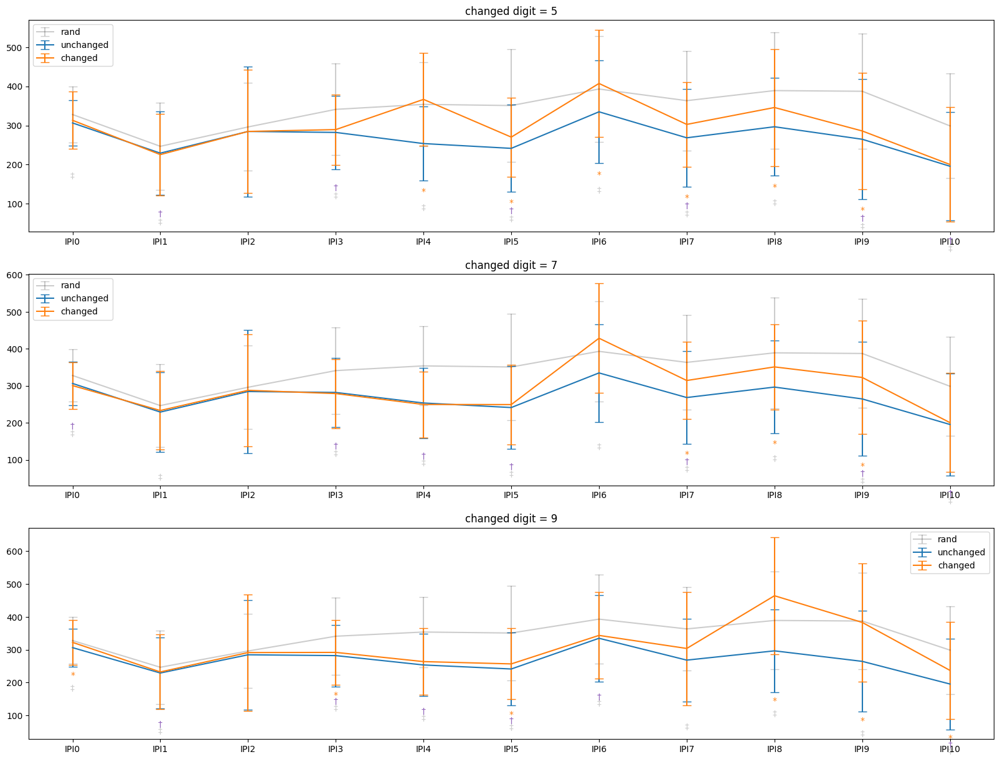

In [32]:
fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))]

session3_blocks = utils.remove_error_trials_presses(session3_blocks)

finger_aggs = {}

for idx, change in enumerate(digit_change):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            data = data[data['digitChangePos'] == change]

            label = 'changed'

        if (flag_trained & ~flag_change):

            label = 'unchanged'

        if (flag_rand):

            label = 'rand'


        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])



    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(change == 8):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)



    
    axs[idx].legend()

    axs[idx].set_title(f'changed digit = {change + 1}')

IPI:  IPI0 TtestResult(statistic=2.2286721454339324, pvalue=0.052811151890059, df=9)
IPI:  IPI1 TtestResult(statistic=0.8472419407307981, pvalue=0.4188196147766653, df=9)
IPI:  IPI10 TtestResult(statistic=1.6967100428182311, pvalue=0.12398360165915234, df=9)
IPI:  IPI2 TtestResult(statistic=1.7812119174507524, pvalue=0.10856822057272184, df=9)
IPI:  IPI3 TtestResult(statistic=2.846180575782308, pvalue=0.019208490596212945, df=9)
IPI:  IPI4 TtestResult(statistic=3.992467064518392, pvalue=0.003145991265751113, df=9)
IPI:  IPI5 TtestResult(statistic=4.223267899528625, pvalue=0.0022286622998559844, df=9)
IPI:  IPI6 TtestResult(statistic=3.4381862974563706, pvalue=0.007411722385750499, df=9)
IPI:  IPI7 TtestResult(statistic=2.089578099440977, pvalue=0.06622864074858151, df=9)
IPI:  IPI8 TtestResult(statistic=4.49246456351895, pvalue=0.0015051717277647005, df=9)
IPI:  IPI9 TtestResult(statistic=2.6569185183863757, pvalue=0.026177665314953934, df=9)


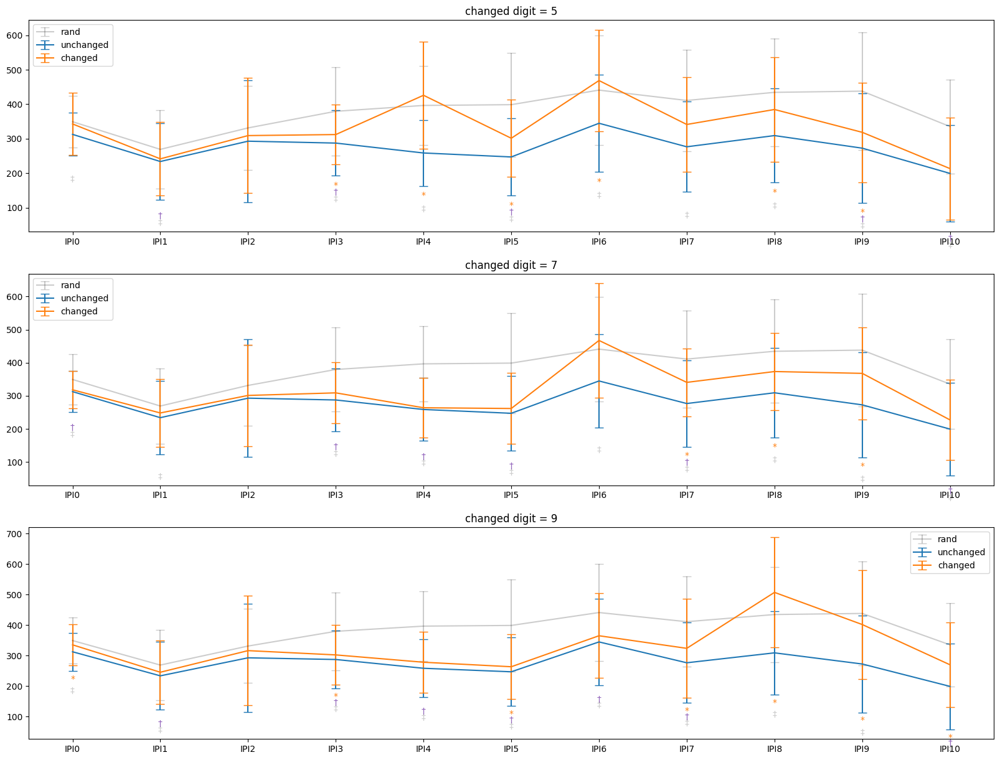

In [33]:
fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# session3_blocks = utils.remove_error_trials_presses(session3_blocks)

finger_aggs = {}


for idx, change in enumerate(digit_change):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            data = data[data['digitChangePos'] == change]

            label = 'changed'

        if (flag_trained & ~flag_change):

            label = 'unchanged'

        if (flag_rand):

            label = 'rand'


        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])



    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(change == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'changed digit = {change + 1}')

In [34]:
cmap = cm.Pastel1
capsize = 5


session3_blocks = subjs[subjs['BN'].isin(list(range(18,26)))].copy()

# session2_blocks = session2_blocks[session2_blocks['SubNum'] != 8]

session3_blocks['norm_MT'] = session3_blocks.apply(utils.correct_error_trial, axis = 1)




for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            for (digit, changed_data) in data.groupby('digitChangePos'):
                for (subnum, sub_data) in changed_data.groupby('SubNum'):
                    if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                         print(f"subj{subnum}_window{window}_changed{digit+1}_acc {len(sub_data[sub_data['isError'] == 0]) / len(sub_data)}")
                        #  if (subnum == 9 and window == 11):
                        #      print(sub_data['norm_MT'])
                        #      print(np.percentile(sub_data['norm_MT'], 0))
    

        if (flag_trained & ~flag_change):

            for (subnum, sub_data) in data.groupby('SubNum'):
                 if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                    print(f"subj{subnum}_window{window}_unchanged_acc {len(sub_data[sub_data['isError'] == 0]) / len(sub_data)}")

        if (flag_rand):
            for (subnum, sub_data) in data.groupby('SubNum'):
                 if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                    print(f"subj{subnum}_window{window}_rand_acc {round(len(sub_data[sub_data['isError'] == 0]) / len(sub_data), 2)}")



subj4_window2_rand_acc 0.54
subj6_window2_rand_acc 0.58
subj4_window2_changed5_acc 0.5
subj5_window2_changed5_acc 0.5
subj9_window2_changed5_acc 0.5
subj5_window2_changed7_acc 0.5
subj6_window2_changed9_acc 0.5
subj9_window2_changed9_acc 0.5
subj4_window3_rand_acc 0.58
subj4_window3_changed5_acc 0.5
subj3_window3_changed7_acc 0.5
subj5_window3_changed7_acc 0.5
subj8_window3_changed7_acc 0.5
subj3_window3_changed9_acc 0.5
subj4_window4_changed5_acc 0.5
subj6_window11_rand_acc 0.5
subj6_window11_changed7_acc 0.5
subj9_window11_changed7_acc 0.5
subj3_window11_changed9_acc 0.5
subj4_window11_changed9_acc 0.5
subj6_window11_changed9_acc 0.5


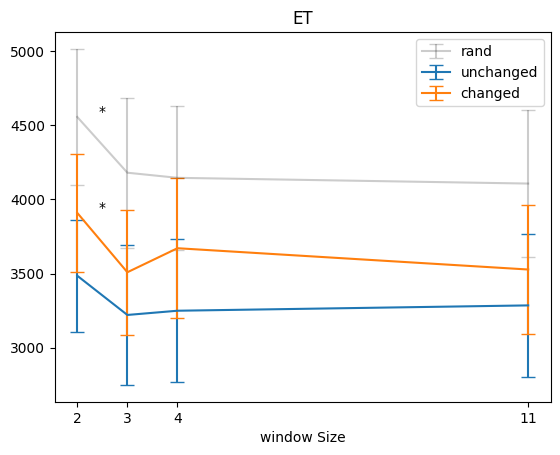

In [35]:
session3_blocks = subjs[subjs['BN'].isin(list(range(18,26)))]

session3_blocks = utils.remove_error_trials(session3_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}



for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'norm_MT': lambda x: np.percentile(x, 50)
    }).reset_index()
        
    data_agged = data.groupby('windowSize').agg({
        'norm_MT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['norm_MT']['mean'], yerr = data_agged['norm_MT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['norm_MT']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['norm_MT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['norm_MT'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')





plt.xticks(data_agged['windowSize'])
plt.title('ET')
plt.legend()
plt.xlabel('window Size')
plt.show()


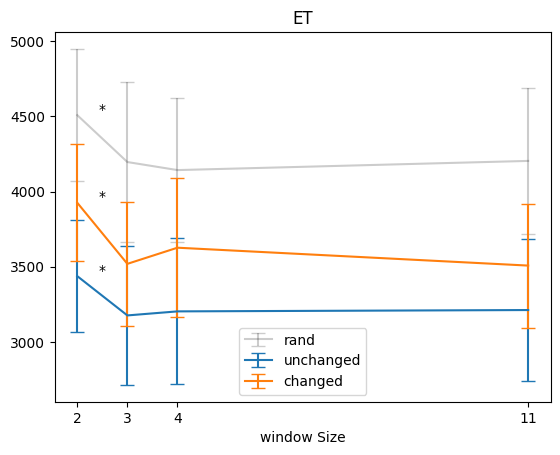

In [36]:
session3_blocks = subjs[subjs['BN'].isin(list(range(18,26)))].copy()

session3_blocks['norm_MT'] = session3_blocks.apply(utils.correct_error_trial, axis = 1)

# session3_blocks = utils.remove_error_trials(session3_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'norm_MT': lambda x: np.percentile(x, 40)
    }).reset_index()
        
    data_agged = data.groupby('windowSize').agg({
        'norm_MT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['norm_MT']['mean'], yerr = data_agged['norm_MT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['norm_MT']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['norm_MT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['norm_MT'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')





plt.xticks(data_agged['windowSize'])
plt.title('ET')
plt.legend()
plt.xlabel('window Size')
plt.show()


IPI:  IPI0 TtestResult(statistic=0.6359981220303654, pvalue=0.540611545889575, df=9)
IPI:  IPI1 TtestResult(statistic=-0.13355703175466463, pvalue=0.8966915804436408, df=9)
IPI:  IPI10 TtestResult(statistic=-1.5859031747563774, pvalue=0.1472227631820089, df=9)
IPI:  IPI2 TtestResult(statistic=1.9124410397391574, pvalue=0.0881166481354438, df=9)
IPI:  IPI3 TtestResult(statistic=1.374846347471803, pvalue=0.20243539668082855, df=9)
IPI:  IPI4 TtestResult(statistic=3.5139416884024985, pvalue=0.006577749073821855, df=9)
IPI:  IPI5 TtestResult(statistic=0.6287235896091423, pvalue=0.5451541649700236, df=9)
IPI:  IPI6 TtestResult(statistic=3.0721596557159145, pvalue=0.01330746999210026, df=9)
IPI:  IPI7 TtestResult(statistic=0.8678352812105576, pvalue=0.4080282457783866, df=9)
IPI:  IPI8 TtestResult(statistic=0.9209507007779462, pvalue=0.3810995039705771, df=9)
IPI:  IPI9 TtestResult(statistic=-0.5965725304559735, pvalue=0.5654947608402737, df=9)


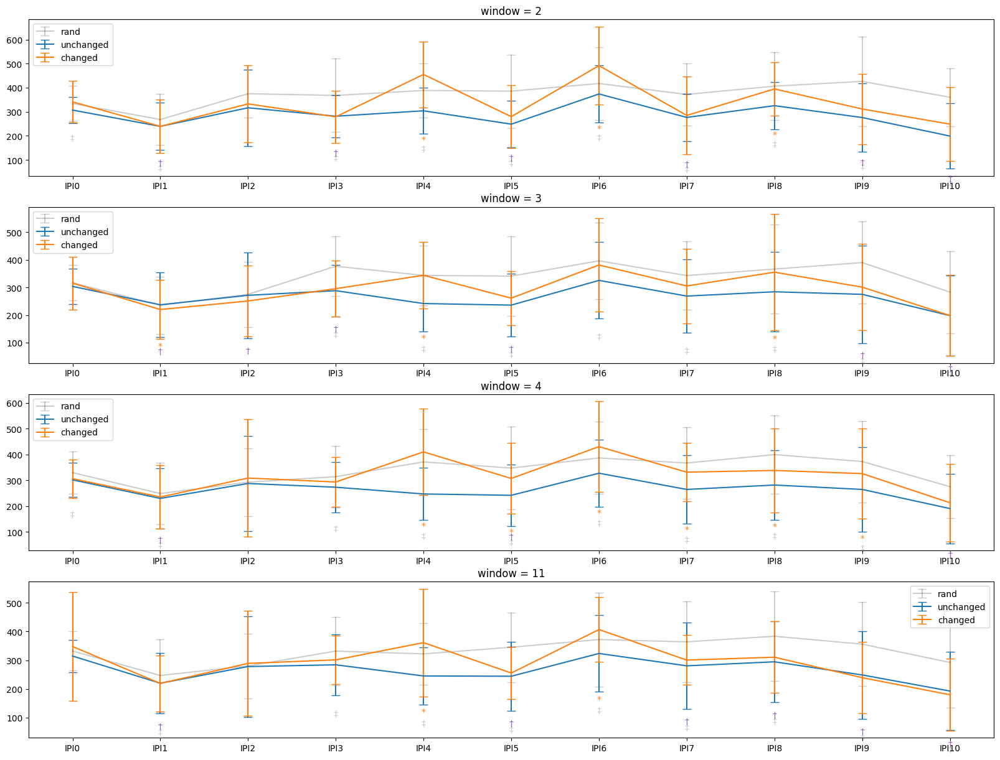

In [37]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

session3_blocks = utils.remove_error_trials_presses(session3_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 4]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=0.8287038211954194, pvalue=0.42870121742412237, df=9)
IPI:  IPI1 TtestResult(statistic=0.40193905852913786, pvalue=0.6971067466378016, df=9)
IPI:  IPI10 TtestResult(statistic=-0.5353574934181974, pvalue=0.605376623144398, df=9)
IPI:  IPI2 TtestResult(statistic=2.4766285036674143, pvalue=0.035185535639364746, df=9)
IPI:  IPI3 TtestResult(statistic=2.1367802562034055, pvalue=0.0613415800487615, df=9)
IPI:  IPI4 TtestResult(statistic=4.367089838377114, pvalue=0.0018047230077959558, df=9)
IPI:  IPI5 TtestResult(statistic=0.5410873680112335, pvalue=0.6015812586080735, df=9)
IPI:  IPI6 TtestResult(statistic=2.876802744684224, pvalue=0.018272972634227218, df=9)
IPI:  IPI7 TtestResult(statistic=1.7919728868232312, pvalue=0.10673755401866931, df=9)
IPI:  IPI8 TtestResult(statistic=1.3747200039688752, pvalue=0.20247319923262982, df=9)
IPI:  IPI9 TtestResult(statistic=1.3146344032368433, pvalue=0.22114501061393538, df=9)


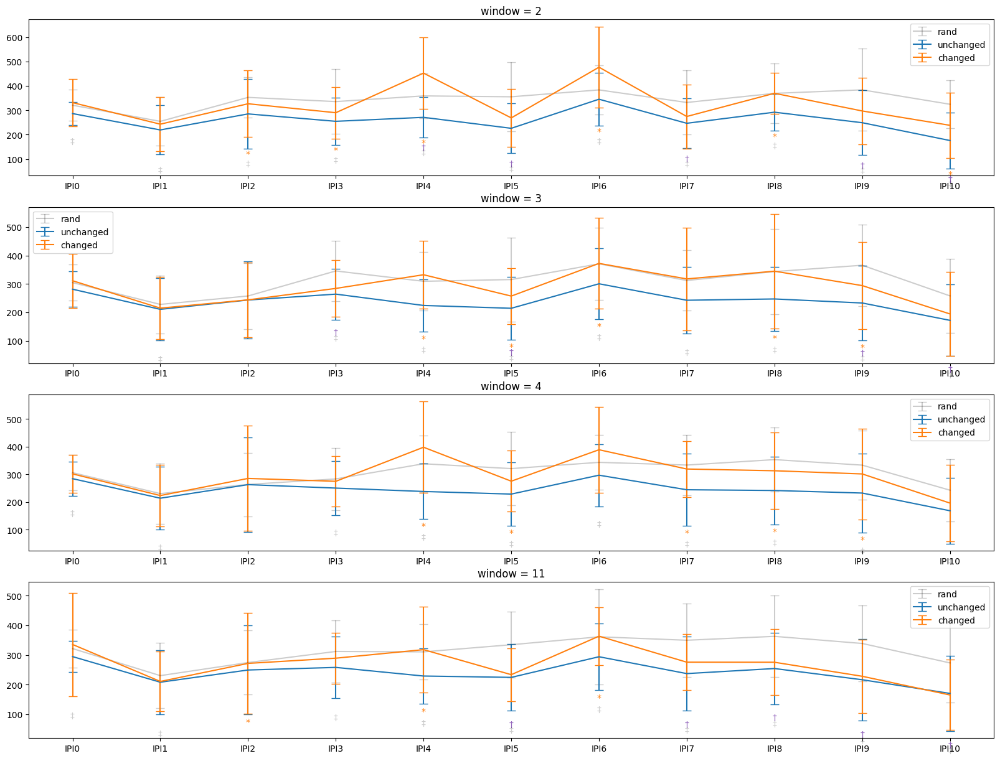

In [38]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

# session3_blocks = session3_blocks[session3_blocks['SubNum'] != 2]

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_trial_IPI, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 4]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=-1.577771118422333, pvalue=0.14907377489601562, df=9)
IPI:  IPI1 TtestResult(statistic=0.17947669098126195, pvalue=0.861539102537433, df=9)
IPI:  IPI10 TtestResult(statistic=1.0794458426303304, pvalue=0.3084665451434651, df=9)
IPI:  IPI2 TtestResult(statistic=-1.403549667991488, pvalue=0.19400232989931934, df=9)
IPI:  IPI3 TtestResult(statistic=-0.47485163204385833, pvalue=0.6462038730228606, df=9)
IPI:  IPI4 TtestResult(statistic=0.951219512195122, pvalue=0.366337400388275, df=9)
IPI:  IPI5 TtestResult(statistic=1.307234010991785, pvalue=0.22354212660065795, df=9)
IPI:  IPI6 TtestResult(statistic=1.3079909371276417, pvalue=0.22329594826447194, df=9)
IPI:  IPI7 TtestResult(statistic=4.039407814879095, pvalue=0.0029312075293238837, df=9)
IPI:  IPI8 TtestResult(statistic=1.2891488684031565, pvalue=0.22949198207568097, df=9)
IPI:  IPI9 TtestResult(statistic=3.1020910069348426, pvalue=0.01267960301880468, df=9)


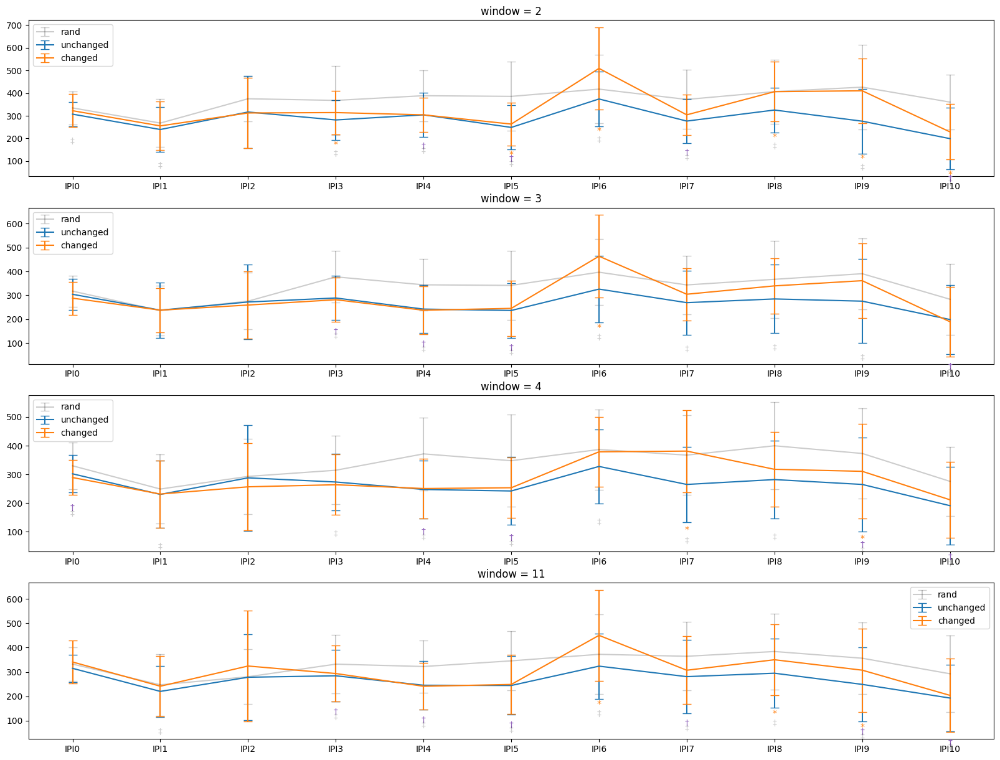

In [39]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

session3_blocks = utils.remove_error_trials_presses(session3_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 6]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=-1.0543086640715864, pvalue=0.319221874538308, df=9)
IPI:  IPI1 TtestResult(statistic=0.9298500500494175, pvalue=0.3767153320437704, df=9)
IPI:  IPI10 TtestResult(statistic=2.0036322760092355, pvalue=0.07610576742832693, df=9)
IPI:  IPI2 TtestResult(statistic=-0.6710899756484084, pvalue=0.5190135364214467, df=9)
IPI:  IPI3 TtestResult(statistic=-0.029171014991032536, pvalue=0.9773648225863558, df=9)
IPI:  IPI4 TtestResult(statistic=0.715732640292404, pvalue=0.4923068979913593, df=9)
IPI:  IPI5 TtestResult(statistic=1.4817089651751476, pvalue=0.17255915538333788, df=9)
IPI:  IPI6 TtestResult(statistic=1.4229471549155224, pvalue=0.188475940797256, df=9)
IPI:  IPI7 TtestResult(statistic=3.887475649434787, pvalue=0.003689119524152313, df=9)
IPI:  IPI8 TtestResult(statistic=2.354729133822309, pvalue=0.042970867497075974, df=9)
IPI:  IPI9 TtestResult(statistic=5.47647531733873, pvalue=0.00039195180868856054, df=9)


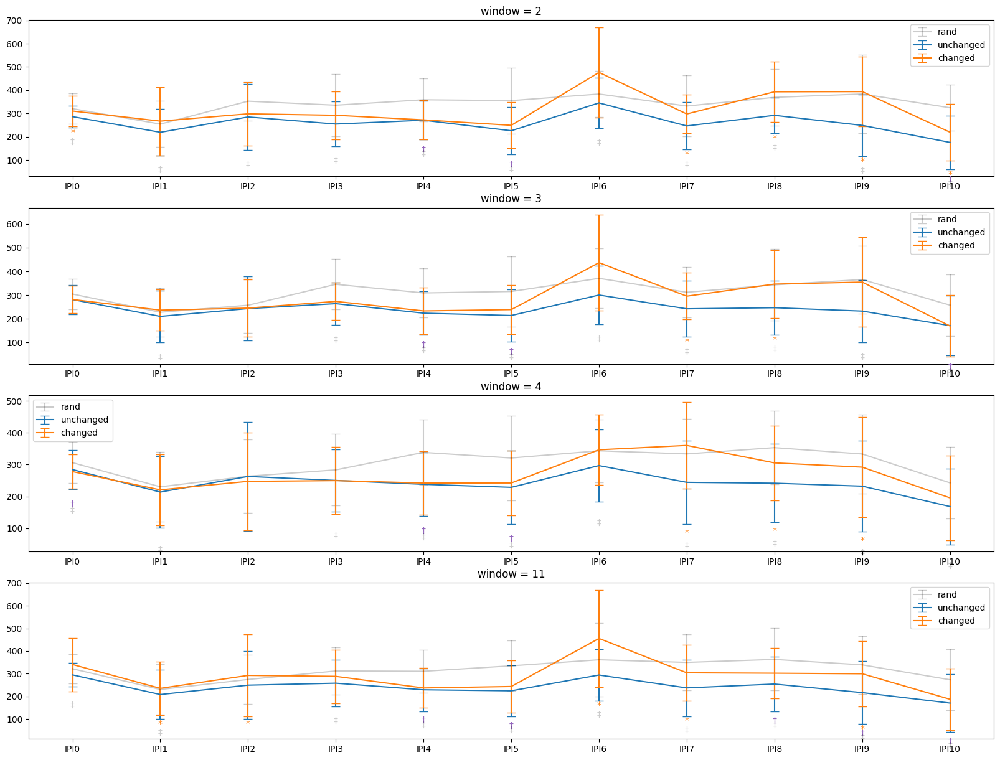

In [40]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

# session3_blocks = session3_blocks[session3_blocks['SubNum'] != 2]

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_trial_IPI, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 6]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=0.8760729258505187, pvalue=0.40376638167147316, df=9)
IPI:  IPI1 TtestResult(statistic=-0.21035158095583562, pvalue=0.838078401299372, df=9)
IPI:  IPI10 TtestResult(statistic=2.5142122394451025, pvalue=0.03308132302854171, df=9)
IPI:  IPI2 TtestResult(statistic=1.9155635193164215, pvalue=0.08767724732334135, df=9)
IPI:  IPI3 TtestResult(statistic=0.42174116783664994, pvalue=0.6831088136440141, df=9)
IPI:  IPI4 TtestResult(statistic=1.198547232206853, pvalue=0.2613104389461362, df=9)
IPI:  IPI5 TtestResult(statistic=2.246024591403338, pvalue=0.05133558656747384, df=9)
IPI:  IPI6 TtestResult(statistic=0.15018785229652765, pvalue=0.8839284218322621, df=9)
IPI:  IPI7 TtestResult(statistic=1.9280668454462093, pvalue=0.08593840925223589, df=9)
IPI:  IPI8 TtestResult(statistic=3.5577722824467592, pvalue=0.006140665686828538, df=9)
IPI:  IPI9 TtestResult(statistic=3.993001308198376, pvalue=0.003143454953080971, df=9)


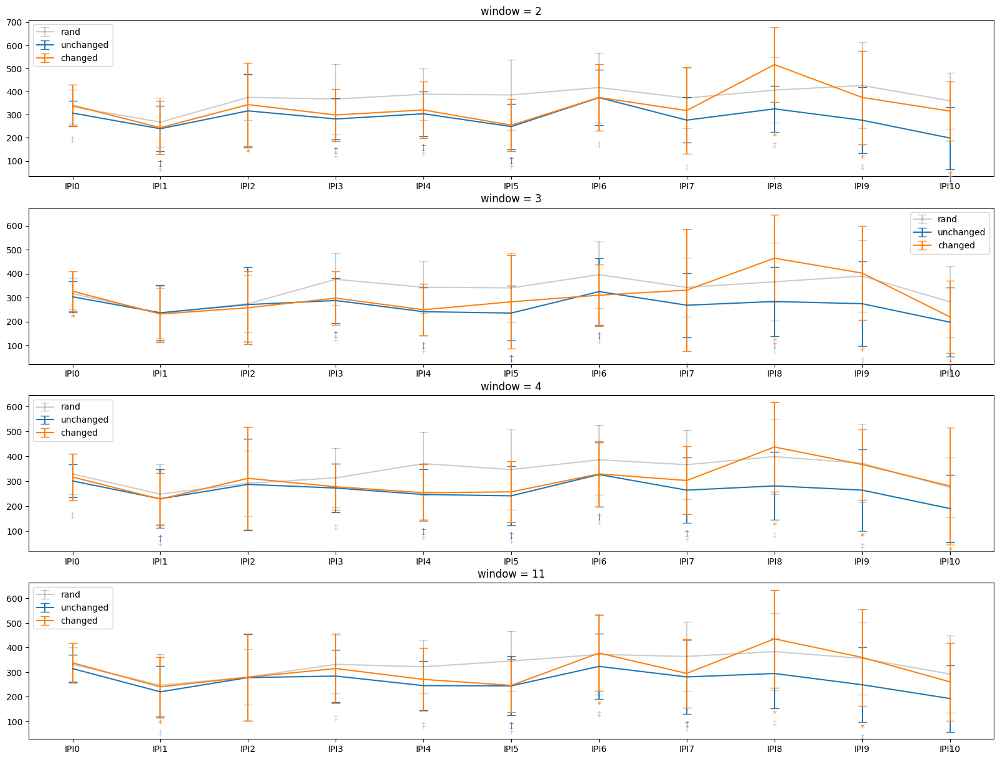

In [41]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

session3_blocks = utils.remove_error_trials_presses(session3_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 8]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=1.0531279335610328, pvalue=0.3197340740292626, df=9)
IPI:  IPI1 TtestResult(statistic=0.9910143724490339, pvalue=0.34757267420077087, df=9)
IPI:  IPI10 TtestResult(statistic=3.524213189250928, pvalue=0.00647247598316174, df=9)
IPI:  IPI2 TtestResult(statistic=2.112512415374066, pvalue=0.06380892014657615, df=9)
IPI:  IPI3 TtestResult(statistic=1.1508583810091286, pvalue=0.2794481453370304, df=9)
IPI:  IPI4 TtestResult(statistic=0.263417467348853, pvalue=0.7981605448584572, df=9)
IPI:  IPI5 TtestResult(statistic=2.9055602938493217, pvalue=0.01743680842654763, df=9)
IPI:  IPI6 TtestResult(statistic=1.0408354582475399, pvalue=0.32510402212712036, df=9)
IPI:  IPI7 TtestResult(statistic=2.251856666518608, pvalue=0.05084877453658894, df=9)
IPI:  IPI8 TtestResult(statistic=4.016716598468295, pvalue=0.0030330234080217736, df=9)
IPI:  IPI9 TtestResult(statistic=5.204725114280005, pvalue=0.0005605072534989429, df=9)


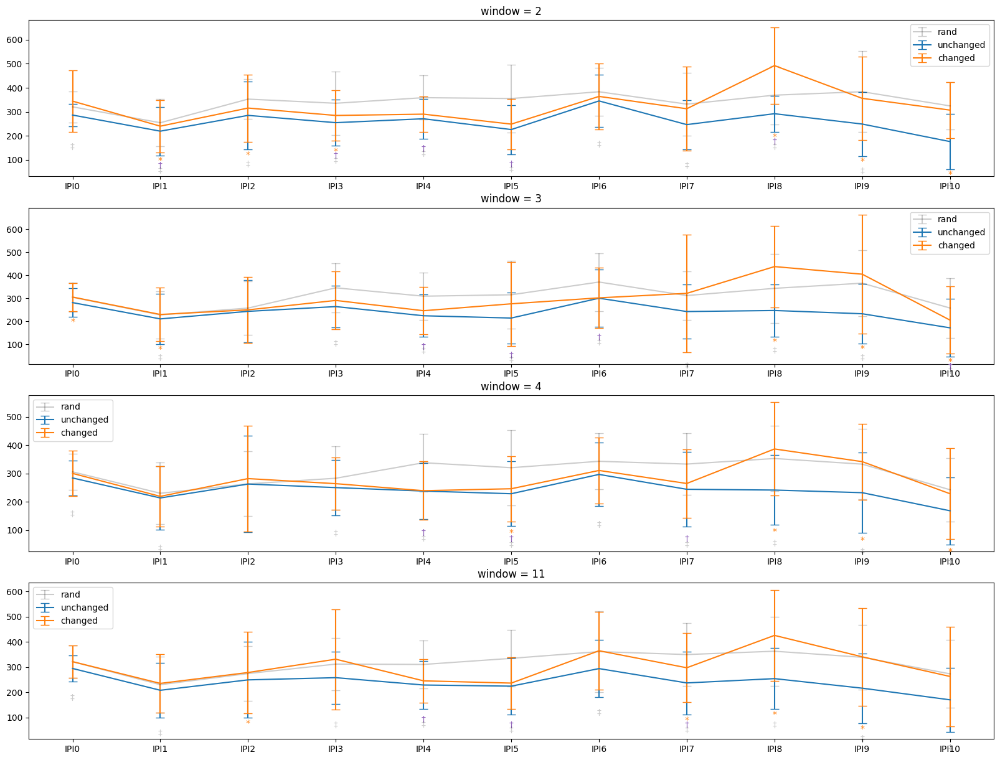

In [42]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(range(18,26))].copy()

# session3_blocks = session3_blocks[session3_blocks['SubNum'] != 2]

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_trial_IPI, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 8]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


## All Test sessions Analysis:

### Error Analysis:

In [43]:
print("whole experiment number of trials: ", len(subjs))

print("whole experiment error trials: ", len(subjs[subjs['isError'] == 1]))


test_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]

print("\n \ntest blocks number of trials: ", len(test_blocks))
print("test blocks error trials: ", len(test_blocks[test_blocks['isError'] == 1]))

non_test_blocks = subjs[~subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]
print("non test blocks error trials: ", len(non_test_blocks[non_test_blocks['isError'] == 1]))




session1_blocks = subjs[subjs['BN'].isin(range(1,7))]
print("\n \nfirst sessions number of trials: ", len(session1_blocks))
print("first sessions error trials: ", len(session1_blocks[session1_blocks['isError'] == 1]))

session2_blocks = subjs[subjs['BN'].isin(range(7, 17))]
print("\n\nsecond session number of trials: ", len(session2_blocks))
print("second session error trials: ", len(session2_blocks[session2_blocks['isError'] == 1]))


session2_pre_post = subjs[subjs['BN'].isin([7,16])]
session3_pre_post = subjs[subjs['BN'].isin([17,26])]
print("\n \nsecond sessions error trials in pre and post: ", len(session2_pre_post[session2_pre_post['isError'] == 1]))
print("\n \nthird sessions error trials in pre and post: ", len(session3_pre_post[session3_pre_post['isError'] == 1]))


whole experiment number of trials:  8000
whole experiment error trials:  1284

 
test blocks number of trials:  4800
test blocks error trials:  710
non test blocks error trials:  574

 
first sessions number of trials:  1920
first sessions error trials:  380


second session number of trials:  3040
second session error trials:  483

 
second sessions error trials in pre and post:  103

 
third sessions error trials in pre and post:  91


In [44]:
test_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]

print("test blocks number of trials: ", len(test_blocks))

subjs_test_error = test_blocks[test_blocks['isError'] == 1]

print("test blocks number of errors: ", len(subjs_test_error))


for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):
                for idx, (digit, digit_presses) in enumerate(data.groupby('digitChangePos')):
                        print(f"digit {digit+1} : {len(digit_presses)}")


        if (flag_trained & ~flag_change):
                print(f"unchanged: {len(data)}")


        if (flag_rand):
                print(f"rand: {len(data)}")



test blocks number of trials:  4800
test blocks number of errors:  710
rand: 410
unchanged: 150
digit 5 : 48
digit 7 : 46
digit 9 : 56


error median:  285.0
non error median:  285.0


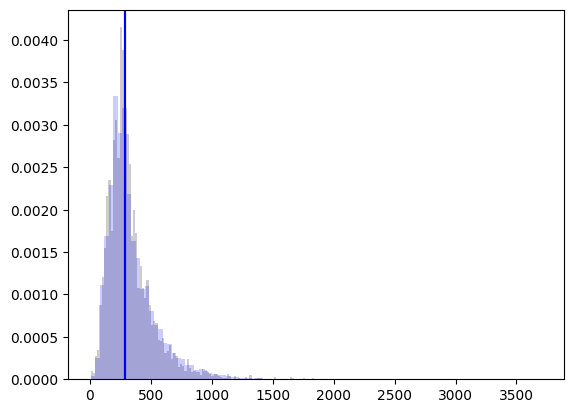

In [45]:
test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_error = test_blocks[test_blocks['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks)


plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
print("error median: ", test_blocks_error['IPI_Value'].median())

plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
print("non error median: ", test_blocks_non_error['IPI_Value'].median())


plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  260.0
non error median:  280.0


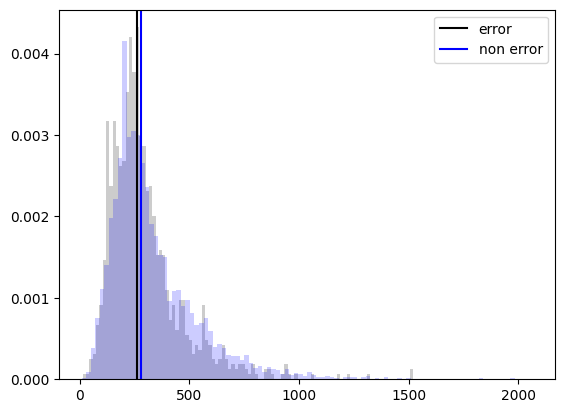

In [46]:
test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)


plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
print("error median: ", test_blocks_error['IPI_Value'].median())

plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
print("non error median: ", test_blocks_non_error['IPI_Value'].median())


plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  260.0
non error median:  280.0


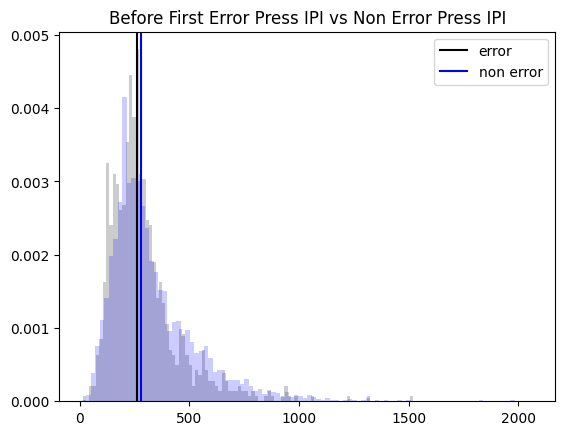

In [47]:
test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)
test_blocks_error = utils.remove_error_presses(test_blocks_error)

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)


plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
print("error median: ", test_blocks_error['IPI_Value'].median())

plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
print("non error median: ", test_blocks_non_error['IPI_Value'].median())


plt.title('Before First Error Press IPI vs Non Error Press IPI')
plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median IPI 0 :  300.0
error median IPI 1 :  195.0
error median IPI 2 :  220.0
error median IPI 3 :  257.5
error median IPI 4 :  250.0
error median IPI 5 :  205.0
error median IPI 6 :  347.5
error median IPI 7 :  250.0
error median IPI 8 :  315.0
error median IPI 9 :  300.0
non error median IPI 0 :  310.0
non error median IPI 1 :  220.0
non error median IPI 2 :  240.0
non error median IPI 3 :  275.0
non error median IPI 4 :  280.0
non error median IPI 5 :  235.0


non error median IPI 6 :  382.5
non error median IPI 7 :  290.0
non error median IPI 8 :  360.0
non error median IPI 9 :  315.0
non error median IPI 10 :  190.0


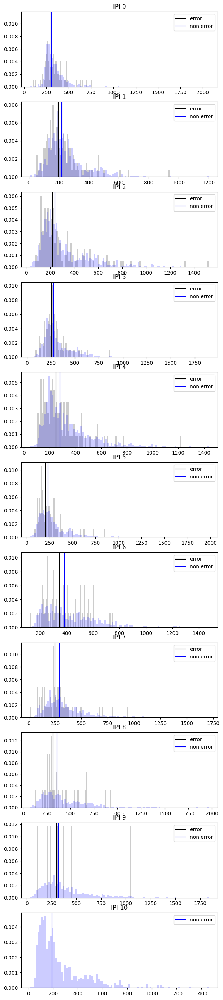

In [48]:
fig, axs = plt.subplots(seq_length, 1, figsize = (7,35))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]



test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)
test_blocks_error = utils.remove_error_presses(test_blocks_error)

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)


for idx, (num, ipis) in enumerate(test_blocks_error.groupby('N')):
    axs[idx].hist(ipis['IPI_Value'], density = True, bins = 100, alpha = 0.2, color = 'black')
    axs[idx].axvline(ipis['IPI_Value'].median(), color = 'black', label = 'error')
    print("error median IPI", num-1,  ": " , ipis['IPI_Value'].median())

    

for idx, (num, ipis) in enumerate(test_blocks_non_error.groupby('N')):
    axs[idx].hist(ipis['IPI_Value'], density = True, bins = 100, alpha = 0.2, color = 'blue')
    axs[idx].axvline(ipis['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median IPI", num-1,  ": " , ipis['IPI_Value'].median())

    axs[idx].legend()
    axs[idx].set_title(f'IPI {num-1}')

# plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
# plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
# print("error median: ", test_blocks_error['IPI_Value'].median())

# plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
# plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
# print("non error median: ", test_blocks_non_error['IPI_Value'].median())


# plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  290.0
non error median:  280.0


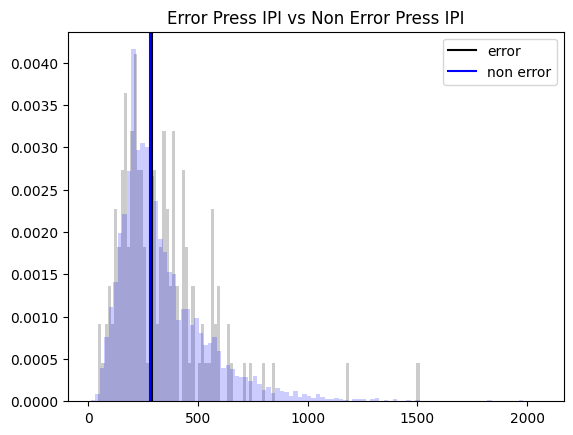

In [49]:


test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]



test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)
test_blocks_error = test_blocks_error[test_blocks_error['isPressError'] == 1]

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)



plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
print("error median: ", test_blocks_error['IPI_Value'].median())

plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
print("non error median: ", test_blocks_non_error['IPI_Value'].median())

plt.title('Error Press IPI vs Non Error Press IPI')
plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median IPI 0 :  365.0
error median IPI 1 :  232.5
error median IPI 2 :  280.0
error median IPI 3 :  330.0
error median IPI 4 :  270.0
error median IPI 5 :  410.0
error median IPI 6 :  305.0
error median IPI 7 :  280.0
error median IPI 8 :  325.0
error median IPI 9 :  282.5
error median IPI 10 :  205.0
non error median IPI 0 :  310.0
non error median IPI 1 :  220.0
non error median IPI 2 :  240.0
non error median IPI 3 :  275.0
non error median IPI 4 :  280.0
non error median IPI 5 :  235.0
non error median IPI 6 :  382.5
non error median IPI 7 :  290.0
non error median IPI 8 :  360.0
non error median IPI 9 :  315.0
non error median IPI 10 :  190.0


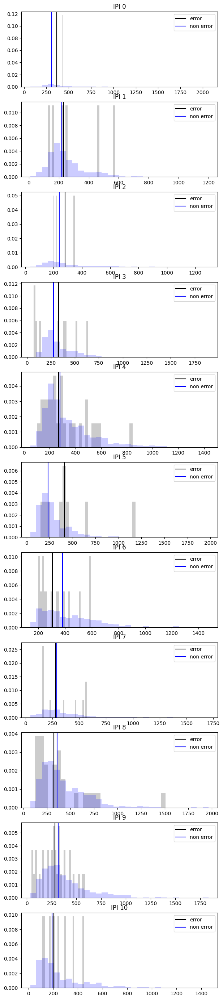

In [50]:
fig, axs = plt.subplots(seq_length, 1, figsize = (7,35))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]



test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)
test_blocks_error = test_blocks_error[test_blocks_error['isPressError'] == 1]

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)


for idx, (num, ipis) in enumerate(test_blocks_error.groupby('N')):
    axs[idx].hist(ipis['IPI_Value'], density = True, bins = 30, alpha = 0.2, color = 'black')
    axs[idx].axvline(ipis['IPI_Value'].median(), color = 'black', label = 'error')
    print("error median IPI", num-1,  ": " , ipis['IPI_Value'].median())

    

for idx, (num, ipis) in enumerate(test_blocks_non_error.groupby('N')):
    axs[idx].hist(ipis['IPI_Value'], density = True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(ipis['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median IPI", num-1,  ": " , ipis['IPI_Value'].median())

    axs[idx].legend()
    axs[idx].set_title(f'IPI {num-1}')

# plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
# plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
# print("error median: ", test_blocks_error['IPI_Value'].median())

# plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
# plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
# print("non error median: ", test_blocks_non_error['IPI_Value'].median())


# plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  312.5
non error median:  355.0
error median:  380.0
non error median:  450.0
error median:  317.5
non error median:  452.5


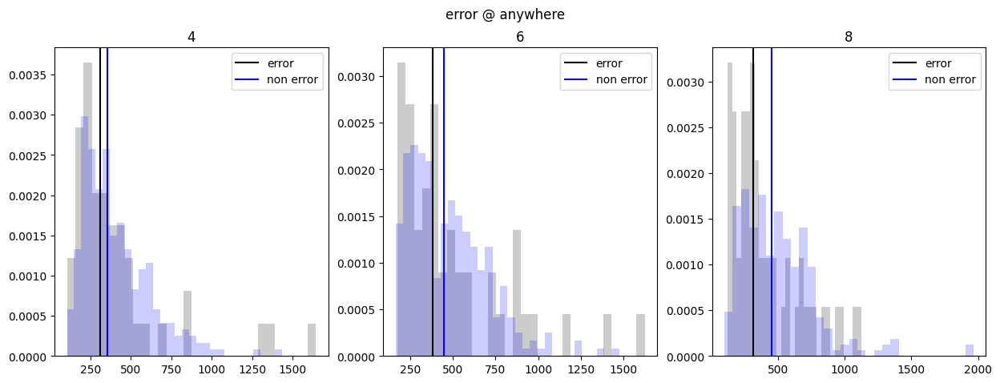

In [51]:
fig, axs = plt.subplots(1, len(digit_change), figsize = (15,5))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

for idx, (digit, data) in enumerate(test_blocks_changed.groupby('digitChangePos')):

    data = data[data['IPI_Number'] == ('IPI'+ str(digit))]

    test_blocks_error = data[data['isTrialError'] == 1]

    # test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)

    test_blocks_non_error = utils.remove_error_trials_presses(data)

    axs[idx].hist(test_blocks_error['IPI_Value'], density=True, bins= 30, alpha = 0.2, color = 'black')
    axs[idx].axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
    print("error median: ", test_blocks_error['IPI_Value'].median())

    axs[idx].hist(test_blocks_non_error['IPI_Value'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median: ", test_blocks_non_error['IPI_Value'].median())
    
    axs[idx].legend()
    axs[idx].set_title(digit)

fig.suptitle('error @ anywhere')

plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  252.5
non error median:  355.0
error median:  255.0
non error median:  450.0
error median:  207.5
non error median:  452.5


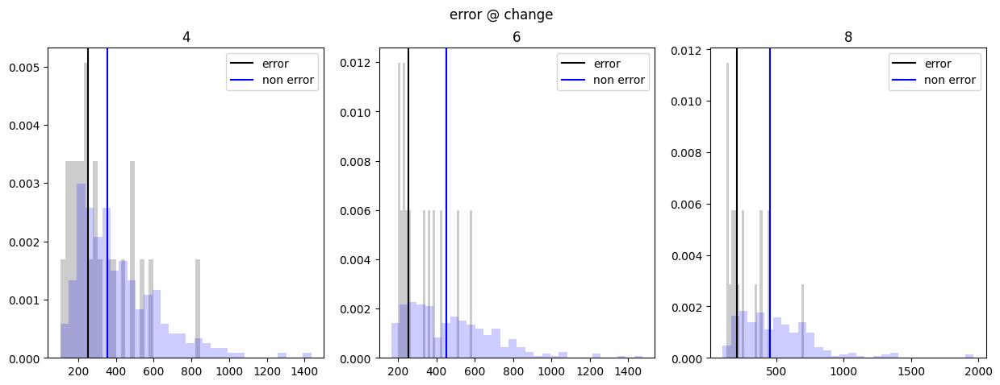

In [52]:
fig, axs = plt.subplots(1, len(digit_change), figsize = (15,5))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_changed = utils.remove_remaining_next_error_presses(test_blocks_changed)

for idx, (digit, data) in enumerate(test_blocks_changed.groupby('digitChangePos')):

    data = data[data['IPI_Number'] == ('IPI'+ str(digit))]

    test_blocks_error = data[data['isPressError'] == 1]

    # test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)

    test_blocks_non_error = utils.remove_error_trials_presses(data)

    axs[idx].hist(test_blocks_error['IPI_Value'], density=True, bins= 30, alpha = 0.2, color = 'black')
    axs[idx].axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
    print("error median: ", test_blocks_error['IPI_Value'].median())

    axs[idx].hist(test_blocks_non_error['IPI_Value'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median: ", test_blocks_non_error['IPI_Value'].median())
    
    axs[idx].legend()
    axs[idx].set_title(digit)

fig.suptitle('error @ change')
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  1447.5
non error median:  1447.5
error median:  2202.5
non error median:  1997.5
error median:  2730.0
non error median:  2662.5


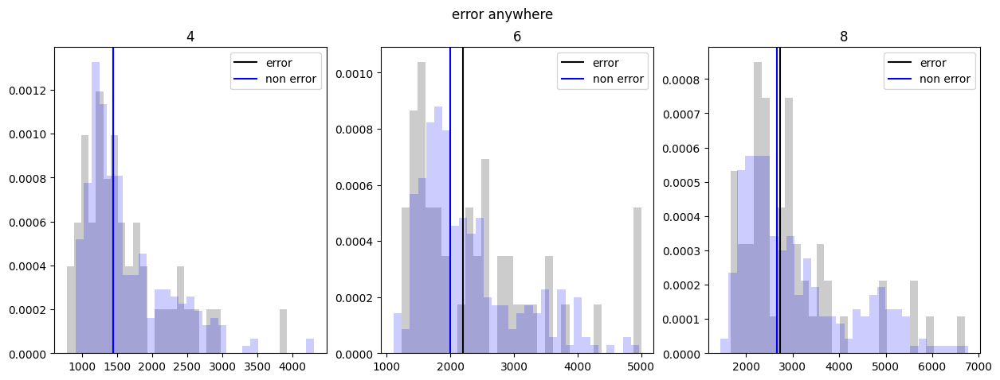

In [53]:
fig, axs = plt.subplots(1, len(digit_change), figsize = (15,5))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

for idx, (digit, data) in enumerate(test_blocks_changed.groupby('digitChangePos')):

    data = data[data['IPI_Number'].isin(['IPI'+ str(x) for x in range(digit + 1)])]

    # test_blocks_error = data[data['SubNum', 'BN', 'TN'] == data[']]

    test_blocks_error = data[data['isTrialError'] == 1]
    test_blocks_error = test_blocks_error.groupby(['SubNum', 'BN' , 'TN']).agg({
        'IPI_Value': 'sum'
    }).reset_index()


    test_blocks_non_error = utils.remove_error_trials_presses(data)
    test_blocks_non_error = test_blocks_non_error.groupby(['SubNum', 'BN' , 'TN']).agg({
        'IPI_Value': 'sum'
    }).reset_index()


    axs[idx].hist(test_blocks_error['IPI_Value'], density=True, bins=30, alpha = 0.2, color = 'black')
    axs[idx].axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
    print("error median: ", test_blocks_error['IPI_Value'].median())

    axs[idx].hist(test_blocks_non_error['IPI_Value'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median: ", test_blocks_non_error['IPI_Value'].median())
    
    axs[idx].legend()
    axs[idx].set_title(digit)


fig.suptitle('error anywhere')
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  1297.5
non error median:  1447.5
error median:  1530.0
non error median:  1997.5
error median:  2335.0
non error median:  2662.5


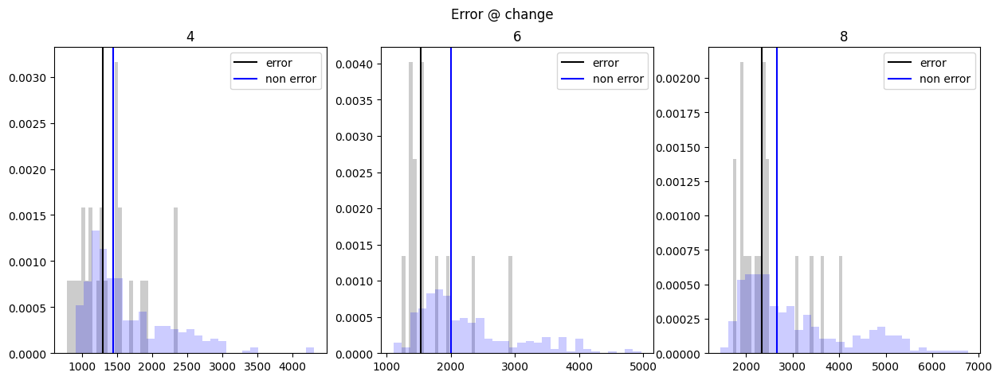

In [54]:
fig, axs = plt.subplots(1, len(digit_change), figsize = (15,5))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_changed = utils.remove_remaining_next_error_presses(test_blocks_changed)


for idx, (digit, data) in enumerate(test_blocks_changed.groupby('digitChangePos')):

    data = data[data['IPI_Number'].isin(['IPI'+ str(x) for x in range(digit + 1)])]

    error_in_changed = data[data['IPI_Number'] == ('IPI'+ str(digit))]

    condition_rows = error_in_changed[error_in_changed['isPressError'] == 1][['SubNum','BN','TN']].drop_duplicates()

    test_blocks_error = data.merge(condition_rows, on = ['SubNum', 'BN', 'TN'], how = 'inner')


    # test_blocks_error = data[data['isTrialError'] == 1]
    test_blocks_error = test_blocks_error.groupby(['SubNum', 'BN' , 'TN']).agg({
        'IPI_Value': 'sum'
    }).reset_index()


    test_blocks_non_error = utils.remove_error_trials_presses(data)
    test_blocks_non_error = test_blocks_non_error.groupby(['SubNum', 'BN' , 'TN']).agg({
        'IPI_Value': 'sum'
    }).reset_index()


    axs[idx].hist(test_blocks_error['IPI_Value'], density=True, bins=30, alpha = 0.2, color = 'black')
    axs[idx].axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
    print("error median: ", test_blocks_error['IPI_Value'].median())

    axs[idx].hist(test_blocks_non_error['IPI_Value'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median: ", test_blocks_non_error['IPI_Value'].median())
    
    axs[idx].legend()
    axs[idx].set_title(digit)


fig.suptitle('Error @ change')
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  1067.5
non error median:  1062.5
error median:  1542.5
non error median:  1537.5
error median:  2242.5
non error median:  2150.0


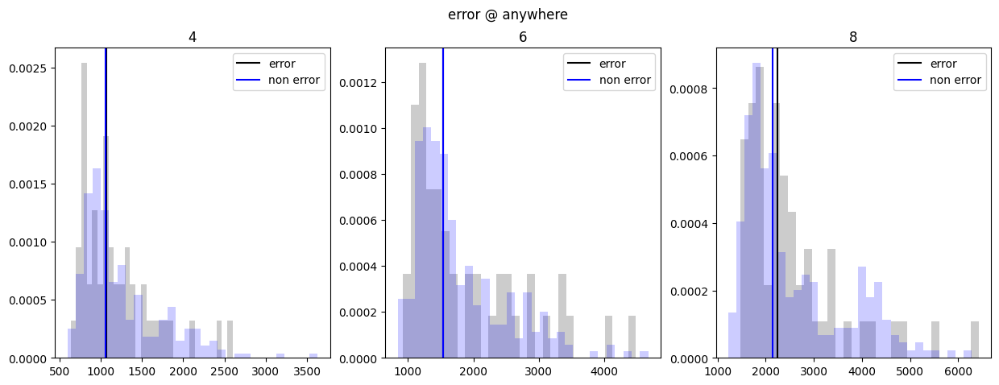

In [55]:
fig, axs = plt.subplots(1, len(digit_change), figsize = (15,5))

test_blocks_changed = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

for idx, (digit, data) in enumerate(test_blocks_changed.groupby('digitChangePos')):
    

    test_blocks_error = data[data['isError'] == 1]
    test_blocks_error = test_blocks_error[['IPI'+ str(x) for x in range(digit)]]
    test_blocks_error['sum'] = test_blocks_error.sum(axis = 1)

    test_blocks_non_error = utils.remove_error_trials(data)
    test_blocks_non_error = test_blocks_non_error[['IPI'+ str(x) for x in range(digit)]]
    test_blocks_non_error['sum'] = test_blocks_non_error.sum(axis = 1)


    axs[idx].hist(test_blocks_error['sum'], density=True, bins=30, alpha = 0.2, color = 'black')
    axs[idx].axvline(test_blocks_error['sum'].median(), color ='black', label = 'error')
    print("error median: ", test_blocks_error['sum'].median())

    axs[idx].hist(test_blocks_non_error['sum'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(test_blocks_non_error['sum'].median(), color = 'blue', label = 'non error')
    print("non error median: ", test_blocks_non_error['sum'].median())
    
    axs[idx].legend()
    axs[idx].set_title(digit)

fig.suptitle('error @ anywhere')
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  1017.5
non error median:  1062.5
error median:  1180.0
non error median:  1537.5
error median:  2000.0
non error median:  2150.0


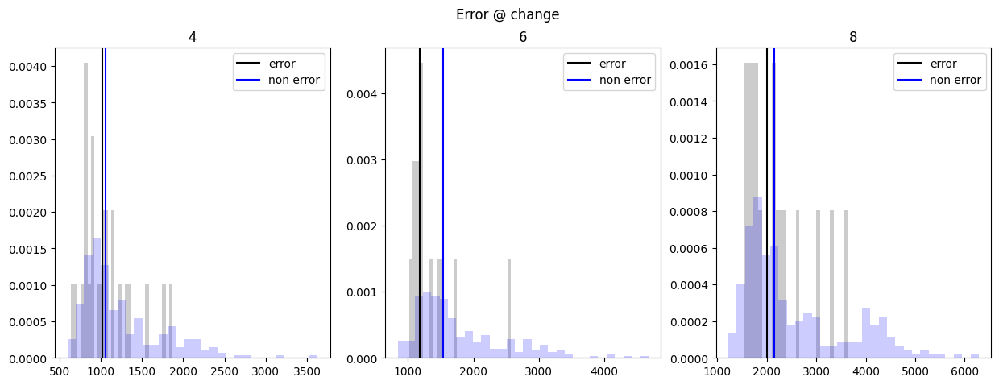

In [56]:
fig, axs = plt.subplots(1, len(digit_change), figsize = (15,5))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_changed = utils.remove_remaining_next_error_presses(test_blocks_changed)

for idx, (digit, data) in enumerate(test_blocks_changed.groupby('digitChangePos')):

    filtered_data = data[data['IPI_Number'].isin(['IPI'+ str(x) for x in range(digit)])]

    error_in_changed = data[data['IPI_Number'] == ('IPI'+ str(digit))]

    condition_rows = error_in_changed[error_in_changed['isPressError'] == 1][['SubNum','BN','TN']].drop_duplicates()

    test_blocks_error = filtered_data.merge(condition_rows, on = ['SubNum', 'BN', 'TN'], how = 'inner')


    # test_blocks_error = data[data['isTrialError'] == 1]
    test_blocks_error = test_blocks_error.groupby(['SubNum', 'BN' , 'TN']).agg({
        'IPI_Value': 'sum'
    }).reset_index()


    test_blocks_non_error = utils.remove_error_trials_presses(filtered_data)
    test_blocks_non_error = test_blocks_non_error.groupby(['SubNum', 'BN' , 'TN']).agg({
        'IPI_Value': 'sum'
    }).reset_index()


    axs[idx].hist(test_blocks_error['IPI_Value'], density=True, bins=30, alpha = 0.2, color = 'black')
    axs[idx].axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
    print("error median: ", test_blocks_error['IPI_Value'].median())

    axs[idx].hist(test_blocks_non_error['IPI_Value'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[idx].axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median: ", test_blocks_non_error['IPI_Value'].median())
    
    axs[idx].legend()
    axs[idx].set_title(digit)


fig.suptitle('Error @ change')
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  245.0
non error median:  405.0
error median:  210.0
non error median:  260.0
error median:  260.0
non error median:  275.0
error median:  215.0
non error median:  235.0


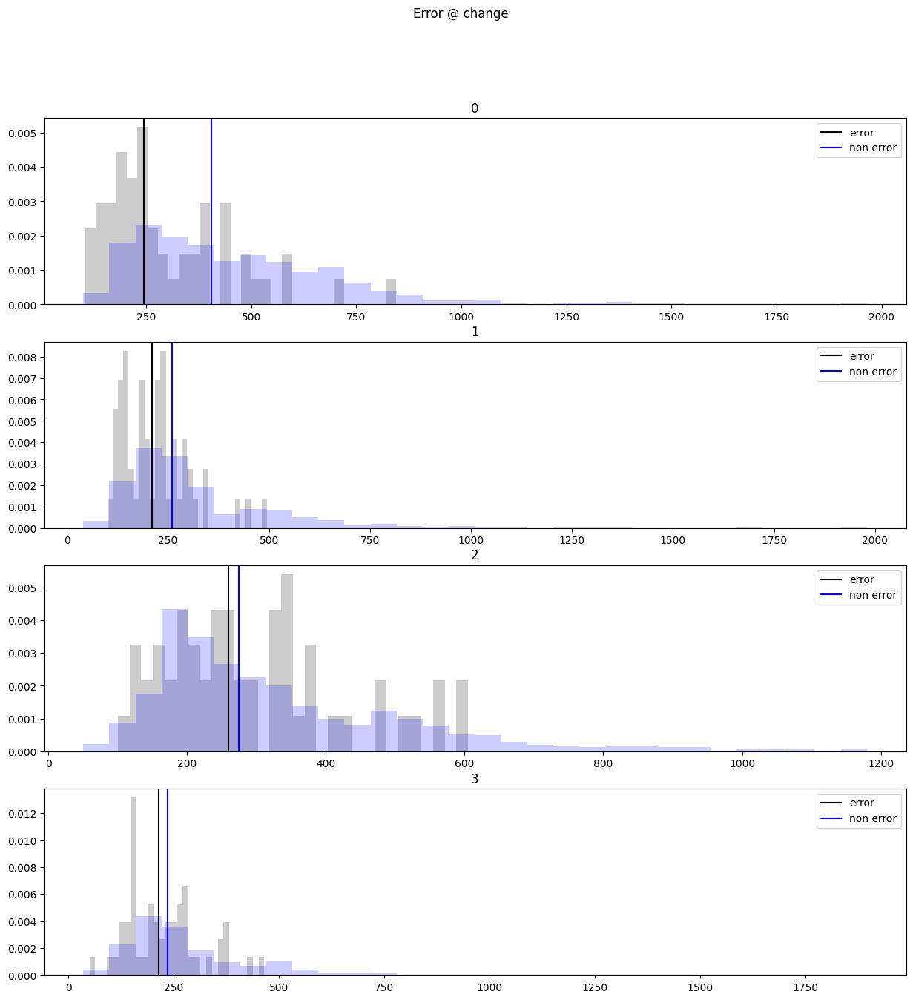

In [57]:
lookback_window = 4
fig, axs = plt.subplots(nrows=lookback_window , figsize= (15,15))

test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & (test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1] 

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)
# # test_blocks_error = test_blocks_error[test_blocks_error['isPressError'] == 1]

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)

error_in_changed = test_blocks_error[test_blocks_error['N'] == (test_blocks_error['digitChangePos'] + 1)]
condition_rows = error_in_changed[error_in_changed['isPressError'] == 1][['SubNum','BN','TN']].drop_duplicates()
test_blocks_error = test_blocks_error.merge(condition_rows, on = ['SubNum', 'BN', 'TN'], how = 'inner')

for lookback in range(lookback_window):
    data_error = test_blocks_error[test_blocks_error['N'] == (test_blocks_error['digitChangePos'] + 1 - lookback)]
    data_non_error = test_blocks_non_error[test_blocks_non_error['N'] == (test_blocks_non_error['digitChangePos'] + 1 - lookback)]
    axs[lookback].hist(data_error['IPI_Value'],density=True, bins=30, alpha = 0.2, color = 'black' )
    axs[lookback].axvline(data_error['IPI_Value'].median(), color ='black', label = 'error')
    print("error median: ", data_error['IPI_Value'].median())

    axs[lookback].hist(data_non_error['IPI_Value'], density=True, bins = 30, alpha = 0.2, color = 'blue')
    axs[lookback].axvline(data_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
    print("non error median: ", data_non_error['IPI_Value'].median())
    axs[lookback].legend()
    axs[lookback].set_title(lookback)


fig.suptitle('Error @ change')
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  270.0
non error median:  255.0


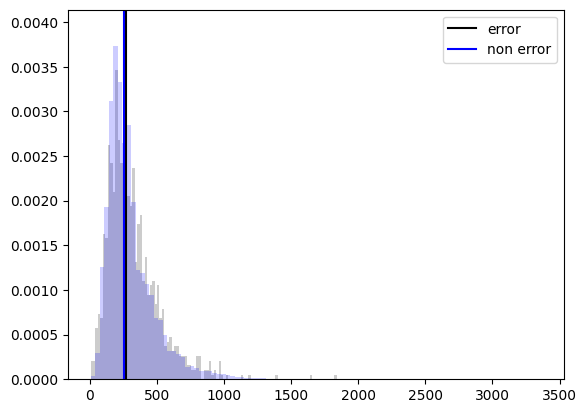

In [58]:
test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_trained_seq']) & ~(test_blocks_changed['is_digit_changed'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)


plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
print("error median: ", test_blocks_error['IPI_Value'].median())

plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
print("non error median: ", test_blocks_non_error['IPI_Value'].median())


plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


error median:  300.0
non error median:  320.0


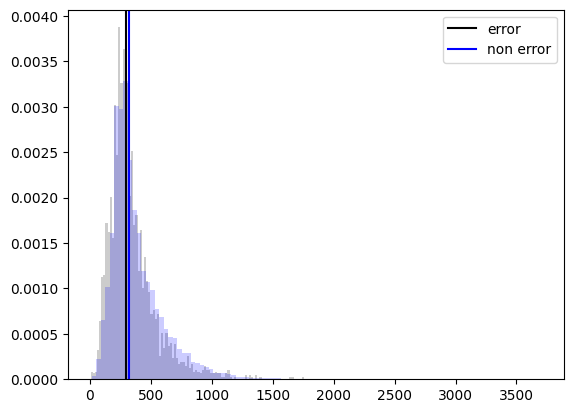

In [59]:
test_blocks_changed = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks_changed = test_blocks_changed[(test_blocks_changed['is_rand_seq'])]

test_blocks_error = test_blocks_changed[test_blocks_changed['isTrialError'] == 1]

test_blocks_error = utils.remove_remaining_next_error_presses(test_blocks_error)

test_blocks_non_error = utils.remove_error_trials_presses(test_blocks_changed)


plt.hist(test_blocks_error['IPI_Value'], density=True, bins=100, alpha = 0.2, color = 'black')
plt.axvline(test_blocks_error['IPI_Value'].median(), color ='black', label = 'error')
print("error median: ", test_blocks_error['IPI_Value'].median())

plt.hist(test_blocks_non_error['IPI_Value'], density=True, bins = 100, alpha = 0.2, color = 'blue')
plt.axvline(test_blocks_non_error['IPI_Value'].median(), color = 'blue', label = 'non error')
print("non error median: ", test_blocks_non_error['IPI_Value'].median())


plt.legend()
plt.show()

# sns.histplot(test_blocks_error['IPI_Value'], color='blue', kde = True)

# sns.histplot(test_blocks_non_error['IPI_Value'], color= 'yellow', kde = True)


rand: 543
unchanged: 203
digit 5 : 61
digit 7 : 55
digit 9 : 66


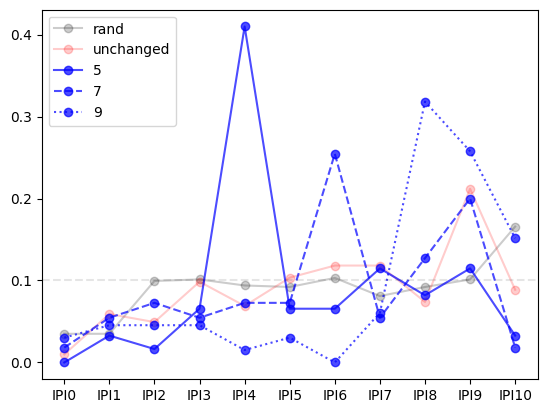

In [60]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]


subjs_presses_test_error = test_blocks[test_blocks['isPressError'] == 1]

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_presses_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):
                for idx, (digit, digit_presses) in enumerate(data.groupby('digitChangePos')):
                        print(f"digit {digit+1} : {len(digit_presses)}")
                        proportions = digit_presses['IPI_Number'].value_counts(sort=False)
                        proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                        proportions /= sum(proportions)
                        plt.plot(proportions.index.values, proportions, color = 'blue', label = digit+1, marker = 'o', alpha = 0.7, linestyle = line_styles[idx])

        if (flag_trained & ~flag_change):
                print(f"unchanged: {len(data)}")
                proportions = data['IPI_Number'].value_counts(sort=False)
                proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                proportions /= sum(proportions)
                plt.plot(proportions.index.values, proportions, color = 'red', label = 'unchanged', marker = 'o', alpha = 0.2)

        if (flag_rand):
                print(f"rand: {len(data)}")
                proportions = data['IPI_Number'].value_counts(sort=False)
                proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                proportions /= sum(proportions)
                plt.plot(proportions.index.values, proportions, color = 'black', label = 'rand', marker = 'o', alpha = 0.2)

plt.axhline(y = 0.1, color = 'black', linestyle = '--', alpha = 0.1)

plt.legend()
plt.show()

rand: 410
unchanged: 150
digit 5 : 48
digit 7 : 46
digit 9 : 56


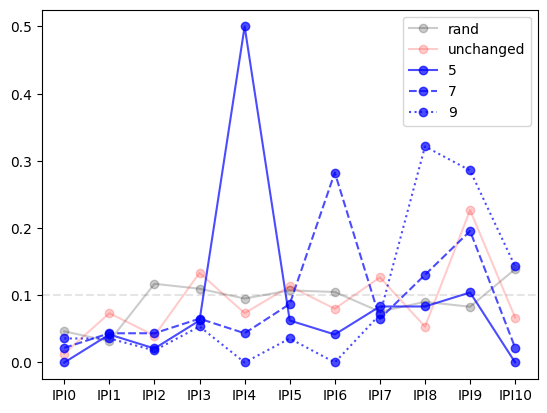

In [61]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks = utils.remove_remaining_next_error_presses(test_blocks)

subjs_presses_test_error = test_blocks[test_blocks['isPressError'] == 1]

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_presses_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):
                for idx, (digit, digit_presses) in enumerate(data.groupby('digitChangePos')):
                        print(f"digit {digit+1} : {len(digit_presses)}")
                        proportions = digit_presses['IPI_Number'].value_counts(sort=False)
                        proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                        proportions /= sum(proportions)
                        plt.plot(proportions.index.values, proportions, color = 'blue', label = digit+1, marker = 'o', alpha = 0.7, linestyle = line_styles[idx])

        if (flag_trained & ~flag_change):
                print(f"unchanged: {len(data)}")
                proportions = data['IPI_Number'].value_counts(sort=False)
                proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                proportions /= sum(proportions)
                plt.plot(proportions.index.values, proportions, color = 'red', label = 'unchanged', marker = 'o', alpha = 0.2)

        if (flag_rand):
                print(f"rand: {len(data)}")
                proportions = data['IPI_Number'].value_counts(sort=False)
                proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                proportions /= sum(proportions)
                plt.plot(proportions.index.values, proportions, color = 'black', label = 'rand', marker = 'o', alpha = 0.2)

plt.axhline(y = 0.1, color = 'black', linestyle = '--', alpha = 0.1)

plt.legend()
plt.show()

**************** 
 window 2 
 **************
rand: 104
unchanged: 36
digit 5 : 14
digit 7 : 11
digit 9 : 17
**************** 
 window 3 
 **************
rand: 93
unchanged: 35
digit 5 : 13
digit 7 : 11
digit 9 : 11
**************** 
 window 4 
 **************
rand: 96
unchanged: 46
digit 5 : 10
digit 7 : 11
digit 9 : 11
**************** 
 window 11 
 **************
rand: 117
unchanged: 33
digit 5 : 11
digit 7 : 13
digit 9 : 17


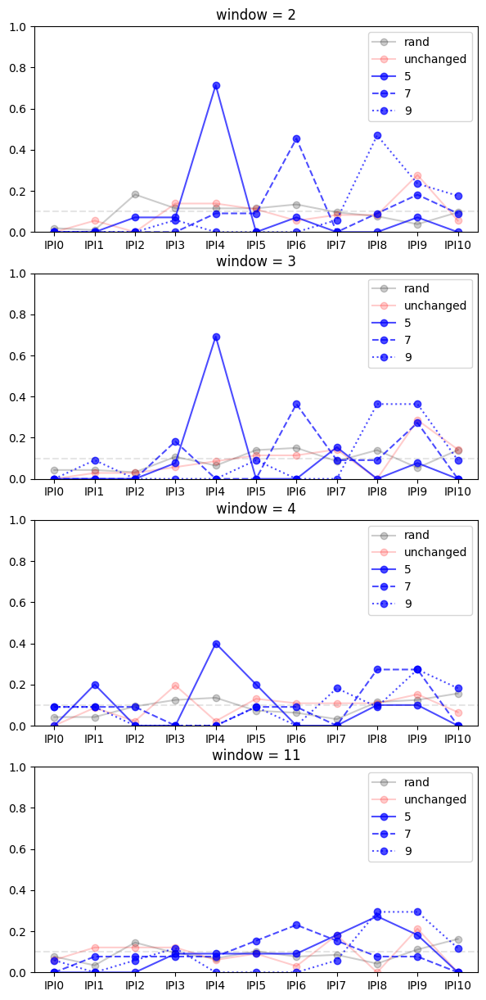

In [62]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']


fig, axs = plt.subplots(len(windowSizes), 1, figsize = (7,15))

for i, window in enumerate(windowSizes):
        print(f"**************** \n window {window} \n **************")

        test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

        test_blocks = test_blocks[test_blocks['windowSize'] == window]

        test_blocks = utils.remove_remaining_next_error_presses(test_blocks)


        subjs_presses_test_error = test_blocks[test_blocks['isPressError'] == 1]

        for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_presses_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
                if (flag_trained & flag_change):
                        for idx, (digit, digit_presses) in enumerate(data.groupby('digitChangePos')):
                                print(f"digit {digit+1} : {len(digit_presses)}")
                                proportions = digit_presses['IPI_Number'].value_counts(sort=False)
                                proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                                proportions /= sum(proportions)
                                axs[i].plot(proportions.index.values, proportions, color = 'blue', label = digit+1, marker = 'o', alpha = 0.7, linestyle = line_styles[idx])

                if (flag_trained & ~flag_change):
                        print(f"unchanged: {len(data)}")
                        proportions = data['IPI_Number'].value_counts(sort=False)
                        proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                        proportions /= sum(proportions)
                        axs[i].plot(proportions.index.values, proportions, color = 'red', label = 'unchanged', marker = 'o', alpha = 0.2)

                if (flag_rand):
                        print(f"rand: {len(data)}")
                        proportions = data['IPI_Number'].value_counts(sort=False)
                        proportions = proportions.reindex(['IPI'+ str(_) for _ in range(0, seq_length)], fill_value = 0)
                        proportions /= sum(proportions)
                        axs[i].plot(proportions.index.values, proportions, color = 'black', label = 'rand', marker = 'o', alpha = 0.2)

        axs[i].axhline(y = 0.1, color = 'black', linestyle = '--', alpha = 0.1)
        axs[i].legend()
        axs[i].set_ylim([0,1])
        axs[i].set_title(f'window = {window}')
plt.show()

In [63]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']
markers = ['.', '>', 'o', '^']

lookback_window = 4


# fig, axs = plt.subplots(len(windowSizes), 1, figsize = (7,15))

for i, window in enumerate(windowSizes):
        print(f"**************** \n window {window} \n **************")
        test_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]
        test_blocks = test_blocks[test_blocks['windowSize'] == window]
        print(len(test_blocks[test_blocks['isError'] == 1]))



**************** 
 window 2 
 **************
182
**************** 
 window 3 
 **************
163
**************** 
 window 4 
 **************
174
**************** 
 window 11 
 **************
191


**************** 
 window 2 
 **************
changed: 28
dist_to_change
-3     0
-2     2
-1     3
0     23
Name: count, dtype: int64
**************** 
 window 3 
 **************
changed: 21
dist_to_change
-3     3
-2     0
-1     1
0     17
Name: count, dtype: int64
**************** 
 window 4 
 **************
changed: 12
dist_to_change
-3    3
-2    0
-1    3
0     6
Name: count, dtype: int64
**************** 
 window 11 
 **************
changed: 15
dist_to_change
-3    1
-2    1
-1    4
0     9
Name: count, dtype: int64


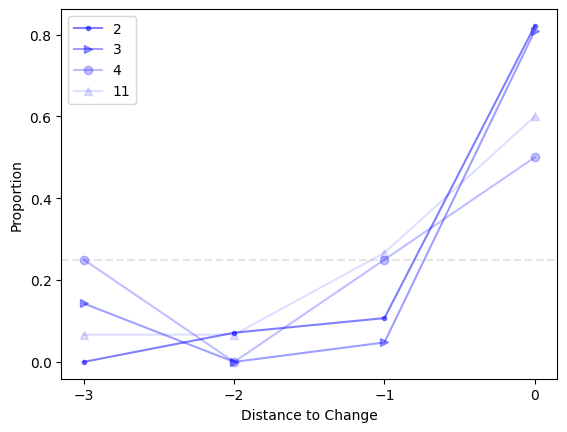

In [67]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']
markers = ['.', '>', 'o', '^']

lookback_window = 4


# fig, axs = plt.subplots(len(windowSizes), 1, figsize = (7,15))

for i, window in enumerate(windowSizes):
        print(f"**************** \n window {window} \n **************")

        test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

        test_blocks = test_blocks[test_blocks['windowSize'] == window]

        test_blocks = utils.remove_remaining_next_error_presses(test_blocks)

        subjs_presses_test_error = test_blocks[test_blocks['isPressError'] == 1]

        for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_presses_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
                if (flag_trained & flag_change):
                        data['dist_to_change'] = (data['N'] - 1 - data['digitChangePos'])
                        data = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, 1))]
                        print(f"changed: {len(data)}")
                        proportions = data['dist_to_change'].value_counts(sort = False)
                        proportions = proportions.reindex(range(-1 * lookback_window + 1, 1), fill_value = 0)
                        print(proportions)
                        proportions /= sum(proportions)
                        plt.plot(proportions.index.values, proportions, color = 'blue', label = f'{window}', marker = markers[i], alpha = (len(windowSizes) - i) / (2 * len(windowSizes)))
                        epsilon = 0.15
                        # plt.plot(proportions.index.values - epsilon * i + 0.3, proportions, color = 'blue', label = f'{window}', marker = markers[i], alpha = 0.1, linestyle='')


plt.axhline(y = 0.25, color = 'black', linestyle = '--', alpha = 0.1)
plt.xticks(proportions.index.values)
plt.xlabel('Distance to Change')
plt.ylabel('Proportion')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
# plt.legend()
plt.show()

**************** 
 window 2 
 **************
changed: 28
dist_to_change
-3     0
-2     2
-1     3
0     23
Name: count, dtype: int64
**************** 
 window 3 
 **************
changed: 21
dist_to_change
-3     3
-2     0
-1     1
0     17
Name: count, dtype: int64
**************** 
 window 4 
 **************
changed: 12
dist_to_change
-3    3
-2    0
-1    3
0     6
Name: count, dtype: int64
**************** 
 window 11 
 **************
changed: 15
dist_to_change
-3    1
-2    1
-1    4
0     9
Name: count, dtype: int64


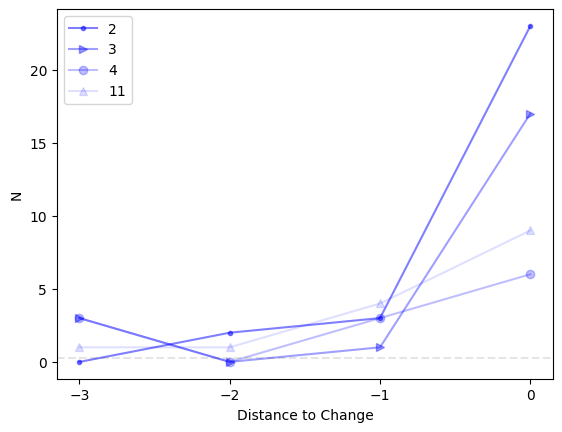

In [62]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']
markers = ['.', '>', 'o', '^']

lookback_window = 4


# fig, axs = plt.subplots(len(windowSizes), 1, figsize = (7,15))

for i, window in enumerate(windowSizes):
        print(f"**************** \n window {window} \n **************")

        test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

        test_blocks = test_blocks[test_blocks['windowSize'] == window]

        test_blocks = utils.remove_remaining_next_error_presses(test_blocks)

        subjs_presses_test_error = test_blocks[test_blocks['isPressError'] == 1]

        for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_presses_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
                if (flag_trained & flag_change):
                        data['dist_to_change'] = (data['N'] - 1 - data['digitChangePos'])
                        data = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, 1))]
                        print(f"changed: {len(data)}")
                        proportions = data['dist_to_change'].value_counts(sort = False)
                        proportions = proportions.reindex(range(-1 * lookback_window + 1, 1), fill_value = 0)
                        print(proportions)
                        # proportions /= sum(proportions)
                        plt.plot(proportions.index.values, proportions, color = 'blue', label = f'{window}', marker = markers[i], alpha = (len(windowSizes) - i) / (2 * len(windowSizes)))
                        epsilon = 0.15
                        # plt.plot(proportions.index.values - epsilon * i + 0.3, proportions, color = 'blue', label = f'{window}', marker = markers[i], alpha = 0.1, linestyle='')


plt.axhline(y = 0.25, color = 'black', linestyle = '--', alpha = 0.1)
plt.xticks(proportions.index.values)
plt.xlabel('Distance to Change')
plt.ylabel('N')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
# plt.legend()
plt.show()

**************** 
 window 2 
 **************
changed: 28
dist_to_change
-3    0
-2    0
-1    0
0     0
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    0
0     2
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    0
0     3
Name: count, dtype: int64
dist_to_change
-3    0
-2    1
-1    0
0     2
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    1
0     5
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    0
0     5
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    0
0     1
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    2
0     0
Name: count, dtype: int64
dist_to_change
-3    0
-2    1
-1    0
0     5
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    0
0     0
Name: count, dtype: int64
**************** 
 window 3 
 **************
changed: 21
dist_to_change
-3    0
-2    0
-1    0
0     0
Name: count, dtype: int64
dist_to_change
-3    0
-2    0
-1    0
0     2
Name: count, dtype: int64
dist_to_ch

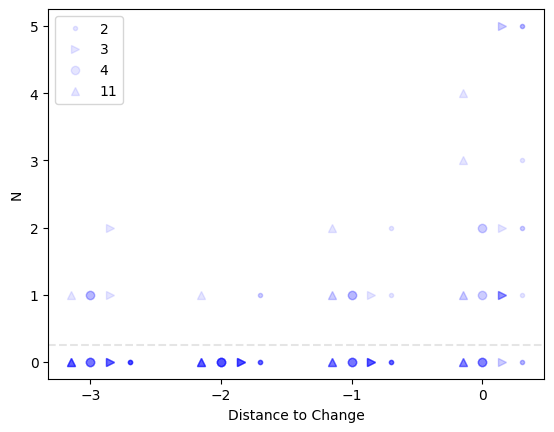

In [64]:
cmap = cm.Pastel1
line_styles = ['-', '--', ':']
markers = ['.', '>', 'o', '^']

lookback_window = 4


# fig, axs = plt.subplots(len(windowSizes), 1, figsize = (7,15))

for i, window in enumerate(windowSizes):
        print(f"**************** \n window {window} \n **************")

        test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

        test_blocks = test_blocks[test_blocks['windowSize'] == window]

        test_blocks = utils.remove_remaining_next_error_presses(test_blocks)

        subjs_presses_test_error = test_blocks[test_blocks['isPressError'] == 1]

        for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(subjs_presses_test_error.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
                if (flag_trained & flag_change):
                        data['dist_to_change'] = (data['N'] - 1 - data['digitChangePos'])
                        data = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, 1))]
                        print(f"changed: {len(data)}")
                        for subnum in range(1, total_sub_num + 1):
                                data_sub = data[data['SubNum'] == subnum]
                                proportions = data_sub['dist_to_change'].value_counts(sort = False)
                                proportions = proportions.reindex(range(-1 * lookback_window + 1, 1), fill_value = 0)
                                print(proportions)
                                # proportions /= sum(proportions)
                                # plt.plot(proportions.index.values, proportions, color = 'blue', label = f'{window}', marker = markers[i], alpha = (len(windowSizes) - i) / (2 * len(windowSizes)))
                                epsilon = 0.15
                                plt.plot(proportions.index.values - epsilon * i + 0.3, proportions, color = 'blue', label = f'{window}', marker = markers[i], alpha = 0.1, linestyle='')


plt.axhline(y = 0.25, color = 'black', linestyle = '--', alpha = 0.1)
plt.xticks(proportions.index.values)
plt.xlabel('Distance to Change')
plt.ylabel('N')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
# plt.legend()
plt.show()

## IPI Analysis:

Text(0.5, 1.0, 'changed vs unchanged')

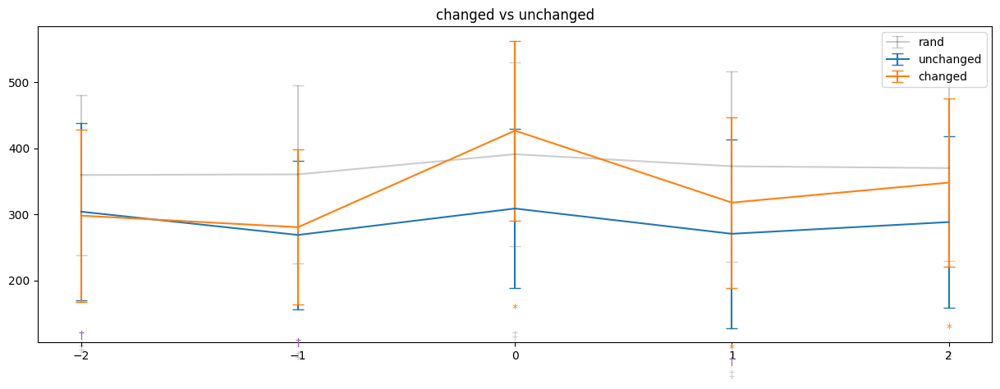

In [26]:
plt.figure(figsize=(15, 5))
cmap = cm.Pastel1
capsize = 5

lookback_window = 3

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

session3_blocks = utils.remove_error_trials_presses(session3_blocks)

finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
    if (flag_trained & flag_change):
        data['dist_to_change'] = (data['N'] - 1 - data['digitChangePos']) 
        data = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, lookback_window))]
        label = 'changed'

    if (flag_trained & ~flag_change):
        datas = {}
        for digitpos in digit_change:
            data['dist_to_change'] = (data['N'] - 1 - digitpos) 
            data_new = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, lookback_window))]
            datas[digitpos] = data_new
        data = pd.concat(list(datas.values()), ignore_index=True)
        label = 'unchanged'

    if (flag_rand):
        datas = {}
        for digitpos in digit_change:
            data['dist_to_change'] = (data['N'] - 1 - digitpos) 
            data_new = data[data['dist_to_change'].isin(range(-1 * lookback_window + 1, lookback_window))]
            datas[digitpos] = data_new
        data = pd.concat(list(datas.values()), ignore_index=True)
        label = 'rand'


    data = data.groupby(['SubNum', 'dist_to_change']).agg({
        'IPI_Value': 'median'
    }).reset_index()

    finger_aggs[label] = data

    finger_agg = data.groupby(['dist_to_change']).agg({
        'IPI_Value': ['mean', 'std']
    }).reset_index()

    finger_agg = finger_agg.iloc[index_natsorted(finger_agg['dist_to_change'])].reset_index(drop=True)
    plt.errorbar(finger_agg['dist_to_change'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])
    plt.xticks(finger_agg['dist_to_change'])



#Statistical Signficance Tests
merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'dist_to_change'], suffixes=('_changed', '_unchanged'))
merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'dist_to_change'])
merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

for IPI in merged_df['dist_to_change'].unique():
    IPI_data = merged_df[merged_df['dist_to_change'] == IPI]
    ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
    ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
    ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
    
    # Add significance symbols just above the error bars
    changed_mean = IPI_data['IPI_Value_changed'].mean()
    changed_std = IPI_data['IPI_Value_changed'].std()
    unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
    unchanged_std = IPI_data['IPI_Value_unchanged'].std()
    rand_mean = IPI_data['IPI_Value_rand'].mean()
    rand_std = IPI_data['IPI_Value_rand'].std()

    y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
    y_pos_unchanged = unchanged_mean - unchanged_std 
    y_pos_rand = rand_mean - rand_std

    y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

    if ttest_changed_vs_unchanged.pvalue < 0.05:
        plt.text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

    if ttest_changed_vs_rand.pvalue < 0.05:
        plt.text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

    if ttest_unchanged_vs_rand.pvalue < 0.05:
        plt.text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)




plt.legend(loc = 'upper right')

plt.title(f'changed vs unchanged')

IPI:  IPI0 TtestResult(statistic=-1.0286180789752701, pvalue=0.3305091077542854, df=9)
IPI:  IPI1 TtestResult(statistic=1.3372274824806278, pvalue=0.21396011317404626, df=9)
IPI:  IPI10 TtestResult(statistic=1.8434443137511636, pvalue=0.09837145262999081, df=9)
IPI:  IPI2 TtestResult(statistic=0.0, pvalue=1.0, df=9)
IPI:  IPI3 TtestResult(statistic=-0.34874291623145787, pvalue=0.7353018404227667, df=9)
IPI:  IPI4 TtestResult(statistic=-0.6882472016116853, pvalue=0.5086464915963445, df=9)
IPI:  IPI5 TtestResult(statistic=0.0, pvalue=1.0, df=9)
IPI:  IPI6 TtestResult(statistic=1.7424005422740685, pvalue=0.11541492429792324, df=9)
IPI:  IPI7 TtestResult(statistic=2.0332797036311723, pvalue=0.07254893057739045, df=9)
IPI:  IPI8 TtestResult(statistic=2.6221758187052995, pvalue=0.02771189282052564, df=9)
IPI:  IPI9 TtestResult(statistic=3.8048319697343223, pvalue=0.004186194308236719, df=9)


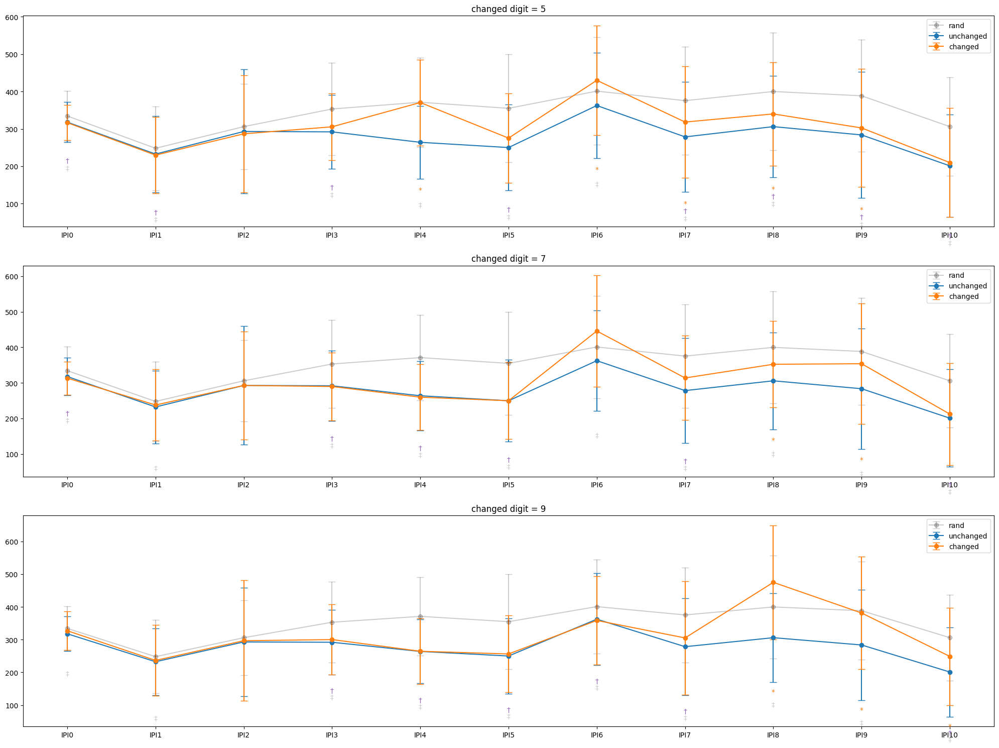

In [65]:
fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

session3_blocks = utils.remove_error_trials_presses(session3_blocks)

finger_aggs = {}

for idx, change in enumerate(digit_change):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            data = data[data['digitChangePos'] == change]

            label = 'changed'

        if (flag_trained & ~flag_change):

            label = 'unchanged'

        if (flag_rand):

            label = 'rand'


        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], 
                          label = label, capsize = capsize, **kwargs[label], fmt = '-o')



    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(change == 6):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)



    
    axs[idx].legend()

    axs[idx].set_title(f'changed digit = {change + 1}')
    plt.tight_layout()

    plt.savefig(path_figs + "IPI_Pattern_Main.pdf", format = 'pdf')
    

In [66]:
# fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
# cmap = cm.Pastel1
# capsize = 5
# kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


# session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# # session3_blocks = utils.remove_error_trials_presses(session3_blocks)

# finger_aggs = {}


# for idx, change in enumerate(digit_change):
#     for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
#         if (flag_trained & flag_change):

#             data = data[data['digitChangePos'] == change]

#             label = 'changed'

#         if (flag_trained & ~flag_change):

#             label = 'unchanged'

#         if (flag_rand):

#             label = 'rand'


#         data = data.groupby(['SubNum', 'IPI_Number']).agg({
#             'IPI_Value': 'median'
#         }).reset_index()

#         finger_aggs[label] = data

#         finger_agg = data.groupby(['IPI_Number']).agg({
#             'IPI_Value': ['mean', 'std']
#         }).reset_index()

#         finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
#         axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])



#     #Statistical Signficance Tests
#     merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
#     merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
#     merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

#     for IPI in merged_df['IPI_Number'].unique():
#         IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
#         ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
#         ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
#         ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
#         # Add significance symbols just above the error bars
#         changed_mean = IPI_data['IPI_Value_changed'].mean()
#         changed_std = IPI_data['IPI_Value_changed'].std()
#         unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
#         unchanged_std = IPI_data['IPI_Value_unchanged'].std()
#         rand_mean = IPI_data['IPI_Value_rand'].mean()
#         rand_std = IPI_data['IPI_Value_rand'].std()

#         y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
#         y_pos_unchanged = unchanged_mean - unchanged_std 
#         y_pos_rand = rand_mean - rand_std

#         y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

#         if ttest_changed_vs_unchanged.pvalue < 0.05:
#             axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

#         if ttest_changed_vs_rand.pvalue < 0.05:
#             axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

#         if ttest_unchanged_vs_rand.pvalue < 0.05:
#             axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


#         if(change == 4):
#             print('IPI: ', IPI, ttest_changed_vs_unchanged)
#             # if(IPI == 'IPI10'):
#             #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
#             #     print(np.mean(IPI_diff))
#             #     print(np.std(IPI_diff))

    
#     axs[idx].legend()

#     axs[idx].set_title(f'changed digit = {change + 1}')

IPI:  IPI0 TtestResult(statistic=1.8358463852423679, pvalue=0.09956668960918495, df=9)
IPI:  IPI1 TtestResult(statistic=2.0604084592303353, pvalue=0.06943421565546841, df=9)
IPI:  IPI10 TtestResult(statistic=4.628482447759667, pvalue=0.001239339190207469, df=9)
IPI:  IPI2 TtestResult(statistic=1.0049055972602434, pvalue=0.34119386212263647, df=9)
IPI:  IPI3 TtestResult(statistic=2.345944543698733, pvalue=0.04359373349212511, df=9)
IPI:  IPI4 TtestResult(statistic=1.4524358993115243, pvalue=0.18033553282847664, df=9)
IPI:  IPI5 TtestResult(statistic=1.193825758370531, pvalue=0.2630626650742125, df=9)
IPI:  IPI6 TtestResult(statistic=0.15842222629643338, pvalue=0.877621856643061, df=9)
IPI:  IPI7 TtestResult(statistic=1.653440619392881, pvalue=0.13263041834492367, df=9)
IPI:  IPI8 TtestResult(statistic=3.6039258329629047, pvalue=0.0057131964993628265, df=9)
IPI:  IPI9 TtestResult(statistic=4.035391918835847, pvalue=0.0029489593407261284, df=9)


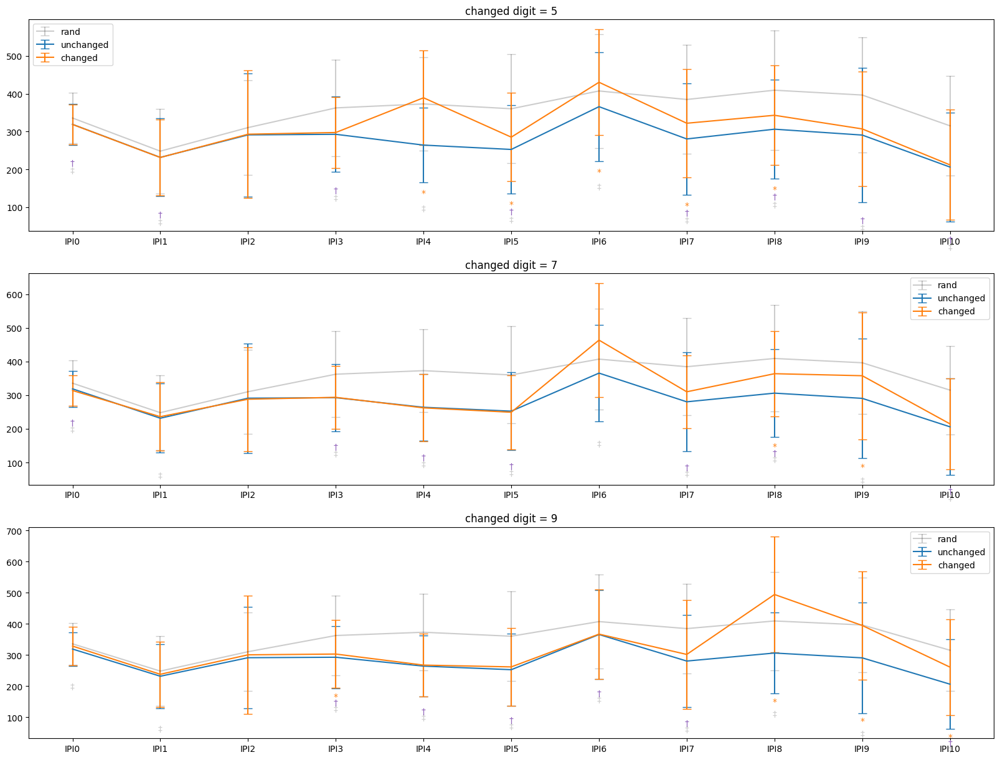

In [67]:
fig, axs = plt.subplots(len(digit_change), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_presses, axis = 1)

# session3_blocks = utils.remove_error_trials_presses(session3_blocks)

finger_aggs = {}


for idx, change in enumerate(digit_change):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            data = data[data['digitChangePos'] == change]

            label = 'changed'

        if (flag_trained & ~flag_change):

            label = 'unchanged'

        if (flag_rand):

            label = 'rand'


        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])



    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(change == 8):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))

    
    axs[idx].legend()

    axs[idx].set_title(f'changed digit = {change + 1}')

In [68]:
cmap = cm.Pastel1
capsize = 5


session3_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# session2_blocks = session2_blocks[session2_blocks['SubNum'] != 8]

session3_blocks['norm_MT'] = session3_blocks.apply(utils.correct_error_trial, axis = 1)




for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
        if (flag_trained & flag_change):

            for (digit, changed_data) in data.groupby('digitChangePos'):
                for (subnum, sub_data) in changed_data.groupby('SubNum'):
                    if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                         print(f"subj{subnum}_window{window}_changed{digit+1}_acc {len(sub_data[sub_data['isError'] == 0]) / len(sub_data)}")
                        #  if (subnum == 9 and window == 11):
                        #      print(sub_data['norm_MT'])
                        #      print(np.percentile(sub_data['norm_MT'], 0))
    

        if (flag_trained & ~flag_change):

            for (subnum, sub_data) in data.groupby('SubNum'):
                 if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                    print(f"subj{subnum}_window{window}_unchanged_acc {len(sub_data[sub_data['isError'] == 0]) / len(sub_data)}")

        if (flag_rand):
            for (subnum, sub_data) in data.groupby('SubNum'):
                 if(len(sub_data[sub_data['isError'] == 0]) / len(sub_data) < 0.6):
                    print(f"subj{subnum}_window{window}_rand_acc {round(len(sub_data[sub_data['isError'] == 0]) / len(sub_data), 2)}")



subj4_window2_rand_acc 0.56
subj6_window2_changed9_acc 0.5
subj9_window2_changed9_acc 0.5
subj6_window11_rand_acc 0.48
subj3_window11_changed9_acc 0.5
subj4_window11_changed9_acc 0.5
subj9_window11_changed9_acc 0.5


rand  3 vs 11: p_value =  0.9646482740908542
unchanged  3 vs 11: p_value =  0.805952082797765
changed  3 vs 11: p_value =  0.177726559964933
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             9.8801 2.0000 18.0000 0.0013
windowSize            0.7746 3.0000 27.0000 0.5184
condition:windowSize  0.6607 6.0000 54.0000 0.6814

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            14.1729 1.0000  9.0000 0.0045
windowSize            0.1494 3.0000 27.0000 0.9291
condition:windowSize  0.6227 3.0000 27.0000 0.6065

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             0.1558 1.0000  9.0000 0.7022
windowSize            1.8737 3.0000 27.0000 0.1579
conditi

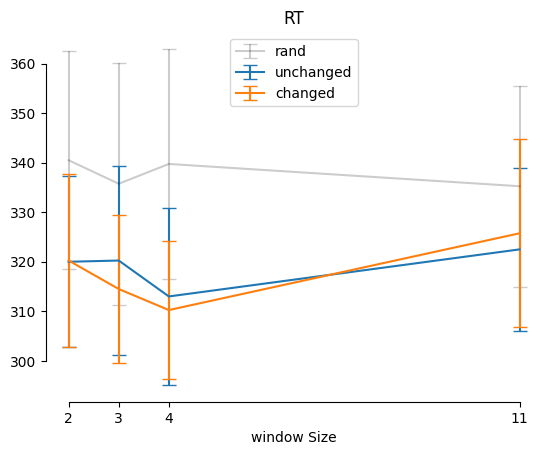

In [70]:
session3_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]

session3_blocks = utils.remove_error_trials(session3_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'RT': lambda x: np.percentile(x, 50)
    }).reset_index()

    finger_aggs[label] = data

        
    data_agged = data.groupby('windowSize').agg({
        'RT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['RT']['mean'], yerr = data_agged['RT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['RT']['mean']
    sems = data_agged['RT']['sem']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['RT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['RT'], 
        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


    t_stat, p_value = stats.ttest_rel(
        data[data['windowSize'] == 3]['RT'], 
        data[data['windowSize'] == 11]['RT']
    )
    print(label, " 3 vs 11: p_value = ",  p_value)
    if p_value < 0.05:
            plt.text((3 + 11) / 2, max(means[1] + sems[1], means[3] + sems[3]) + 10, '*', color='black', ha='center')


    
# Combine all data into a single DataFrame
combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                           finger_aggs['unchanged'].assign(condition='unchanged'),
                           finger_aggs['rand'].assign(condition='rand')])

print("All Three: \n", AnovaRM(data=combined_data, depvar='RT', subject='SubNum', within=['condition', 'windowSize']).fit())
print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='RT', subject='SubNum', within=['condition', 'windowSize']).fit())
print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='RT', subject='SubNum', within=['condition', 'windowSize']).fit())





plt.xticks(data_agged['windowSize'])
plt.title('RT')
plt.legend()
plt.xlabel('window Size')
sns.despine(trim = True)
plt.savefig(path_figs + "RT.pdf", format = 'pdf')
plt.show()




rand  3 vs 11: p_value =  0.48262451129707085
unchanged  3 vs 11: p_value =  0.8458343141489728
changed  3 vs 11: p_value =  0.5741981642793615
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            60.5265 2.0000 18.0000 0.0000
windowSize           18.7722 3.0000 27.0000 0.0000
condition:windowSize  1.0696 6.0000 54.0000 0.3921

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            81.0880 1.0000  9.0000 0.0000
windowSize           16.9061 3.0000 27.0000 0.0000
condition:windowSize  2.4230 3.0000 27.0000 0.0876

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            22.0543 1.0000  9.0000 0.0011
windowSize            9.2993 3.0000 27.0000 0.0002
cond

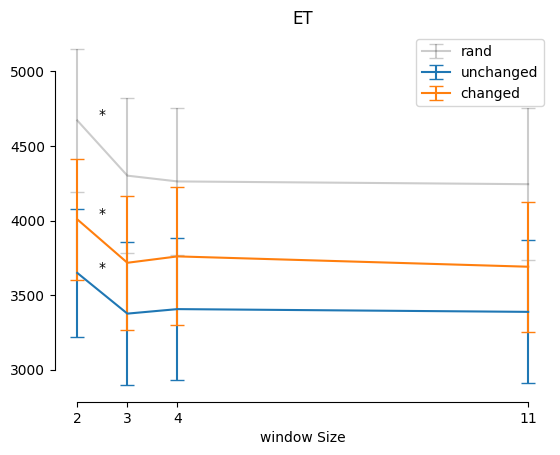

In [172]:
session3_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))]

session3_blocks = utils.remove_error_trials(session3_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'norm_MT': lambda x: np.percentile(x, 50)
    }).reset_index()

    finger_aggs[label] = data

        
    data_agged = data.groupby('windowSize').agg({
        'norm_MT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['norm_MT']['mean'], yerr = data_agged['norm_MT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['norm_MT']['mean']
    sems = data_agged['norm_MT']['sem']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['norm_MT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['norm_MT'], 
        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


    t_stat, p_value = stats.ttest_rel(
        data[data['windowSize'] == 3]['norm_MT'], 
        data[data['windowSize'] == 11]['norm_MT']
    )
    print(label, " 3 vs 11: p_value = ",  p_value)
    if p_value < 0.05:
            plt.text((3 + 11) / 2, max(means[1] + sems[1], means[3] + sems[3]) + 10, '*', color='black', ha='center')


    
# Combine all data into a single DataFrame
combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                           finger_aggs['unchanged'].assign(condition='unchanged'),
                           finger_aggs['rand'].assign(condition='rand')])

print("All Three: \n", AnovaRM(data=combined_data, depvar='norm_MT', subject='SubNum', within=['condition', 'windowSize']).fit())
print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='norm_MT', subject='SubNum', within=['condition', 'windowSize']).fit())
print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='norm_MT', subject='SubNum', within=['condition', 'windowSize']).fit())





plt.xticks(data_agged['windowSize'])
plt.title('ET')
plt.legend()
plt.xlabel('window Size')
sns.despine(trim = True)
plt.savefig(path_figs + "ET.pdf", format = 'pdf')
plt.show()




rand  3 vs 11: p_value =  0.7447882170918512
unchanged  3 vs 11: p_value =  0.8891664580374383
changed  3 vs 11: p_value =  0.9858034579628941
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            73.0900 2.0000 18.0000 0.0000
windowSize           15.2227 3.0000 27.0000 0.0000
condition:windowSize  0.9678 6.0000 54.0000 0.4558

unchanged_rand: 
                        Anova
                     F Value  Num DF  Den DF Pr > F
---------------------------------------------------
condition            101.9600 1.0000  9.0000 0.0000
windowSize            14.4902 3.0000 27.0000 0.0000
condition:windowSize   1.7157 3.0000 27.0000 0.1874

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            29.3464 1.0000  9.0000 0.0004
windowSize            8.6510 3.0000 27.0000 0.0003

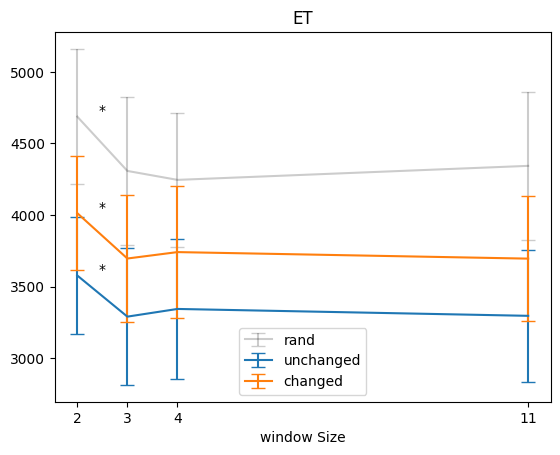

In [68]:
session3_blocks = subjs[subjs['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

session3_blocks['norm_MT'] = session3_blocks.apply(utils.correct_error_trial, axis = 1)

# session3_blocks = utils.remove_error_trials(session3_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'norm_MT': lambda x: np.percentile(x, 40)
    }).reset_index()

    finger_aggs[label] = data

        
    data_agged = data.groupby('windowSize').agg({
        'norm_MT': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['norm_MT']['mean'], yerr = data_agged['norm_MT']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['norm_MT']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['norm_MT'], 
            data[data['windowSize'] == windowSizes[i + 1]]['norm_MT'], 

        )
        
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')

    t_stat, p_value = stats.ttest_rel(
        data[data['windowSize'] == 3]['norm_MT'], 
        data[data['windowSize'] == 11]['norm_MT']
    )
    print(label, " 3 vs 11: p_value = ",  p_value)
    if p_value < 0.05:
            plt.text((3 + 11) / 2, max(means[1] + sems[1], means[3] + sems[3]) + 10, '*', color='black', ha='center')

# Combine all data into a single DataFrame
combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                           finger_aggs['unchanged'].assign(condition='unchanged'),
                           finger_aggs['rand'].assign(condition='rand')])

print("All Three: \n", AnovaRM(data=combined_data, depvar='norm_MT', subject='SubNum', within=['condition', 'windowSize']).fit())
print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='norm_MT', subject='SubNum', within=['condition', 'windowSize']).fit())
print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='norm_MT', subject='SubNum', within=['condition', 'windowSize']).fit())


plt.xticks(data_agged['windowSize'])
plt.title('ET')
plt.legend()
plt.xlabel('window Size')
plt.show()


All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            36.4311 2.0000 18.0000 0.0000
windowSize            5.8240 3.0000 27.0000 0.0033
condition:windowSize  1.5933 6.0000 54.0000 0.1670

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            50.7012 1.0000  9.0000 0.0001
windowSize            4.1961 3.0000 27.0000 0.0147
condition:windowSize  1.2592 3.0000 27.0000 0.3081

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            23.9798 1.0000  9.0000 0.0009
windowSize            6.7752 3.0000 27.0000 0.0015
condition:windowSize  2.0820 3.0000 27.0000 0.1261



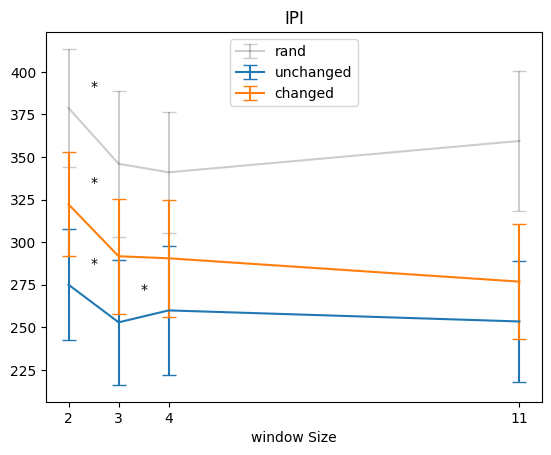

In [69]:
test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        data = data[data['digitChangePos'] == 4]
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'IPI_Value': lambda x: np.percentile(x, 40)
    }).reset_index()

    finger_aggs[label] = data
        
    data_agged = data.groupby('windowSize').agg({
        'IPI_Value': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['IPI_Value']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
            data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['IPI_Value']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')

    # Combine all data into a single DataFrame
combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                           finger_aggs['unchanged'].assign(condition='unchanged'),
                           finger_aggs['rand'].assign(condition='rand')])

print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())





plt.xticks(data_agged['windowSize'])
plt.title('IPI')
plt.legend()
plt.xlabel('window Size')
plt.show()


All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            32.3728 2.0000 18.0000 0.0000
windowSize            4.5046 3.0000 27.0000 0.0109
condition:windowSize  0.5650 6.0000 54.0000 0.7562

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            50.7012 1.0000  9.0000 0.0001
windowSize            4.1961 3.0000 27.0000 0.0147
condition:windowSize  1.2592 3.0000 27.0000 0.3081

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             7.8895 1.0000  9.0000 0.0204
windowSize            2.7381 3.0000 27.0000 0.0629
condition:windowSize  0.5386 3.0000 27.0000 0.6599



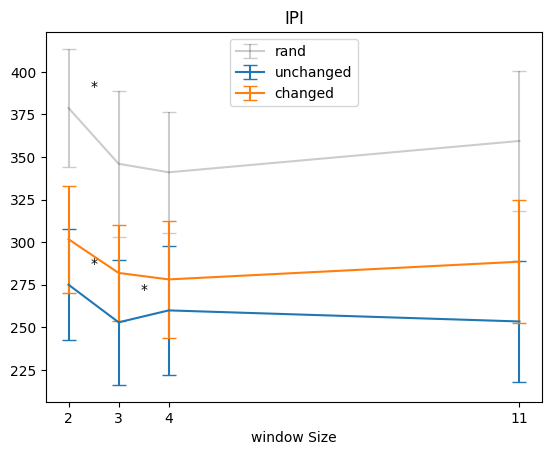

In [70]:
test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        data = data[data['digitChangePos'] == 6]
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'IPI_Value': lambda x: np.percentile(x, 40)
    }).reset_index()

    finger_aggs[label] = data
        
    data_agged = data.groupby('windowSize').agg({
        'IPI_Value': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['IPI_Value']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
            data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['IPI_Value']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')

    # Combine all data into a single DataFrame
combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                           finger_aggs['unchanged'].assign(condition='unchanged'),
                           finger_aggs['rand'].assign(condition='rand')])

print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())





plt.xticks(data_agged['windowSize'])
plt.title('IPI')
plt.legend()
plt.xlabel('window Size')
plt.show()


In [71]:
# test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_presses, axis = 1)

# # test_blocks = utils.remove_error_trials_presses(test_blocks)

# kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

# finger_aggs = {}

# for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

#     if (flag_trained & flag_change):
#         data = data[data['digitChangePos'] == 6]
#         label = 'changed'

#     if(flag_trained & ~flag_change):
#         label = 'unchanged'

#     if (flag_rand):
#         label = 'rand'

#     data = data.groupby(['SubNum', 'windowSize']).agg({
#     'IPI_Value': lambda x: np.percentile(x, 40)
#     }).reset_index()

#     finger_aggs[label] = data
        
#     data_agged = data.groupby('windowSize').agg({
#         'IPI_Value': ['mean', 'sem']
#     }).reset_index()

#     plt.errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

#     means = data_agged['IPI_Value']['mean']

#     for i in range(len(windowSizes) - 1):
#         t_stat, p_value = stats.ttest_rel(
#             data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
#             data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

#         )
#         if p_value < 0.05:
#             # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
#             plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
#             # plt.annotate(f'*', (windowSizes[i], data_agged['IPI_Value']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')

#     # Combine all data into a single DataFrame
# combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
#                            finger_aggs['unchanged'].assign(condition='unchanged'),
#                            finger_aggs['rand'].assign(condition='rand')])

# print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
# print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
# print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())





# plt.xticks(data_agged['windowSize'])
# plt.title('IPI')
# plt.legend()
# plt.xlabel('window Size')
# plt.show()


All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            23.5634 2.0000 18.0000 0.0000
windowSize            6.7060 3.0000 27.0000 0.0016
condition:windowSize  1.3294 6.0000 54.0000 0.2602

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            50.7012 1.0000  9.0000 0.0001
windowSize            4.1961 3.0000 27.0000 0.0147
condition:windowSize  1.2592 3.0000 27.0000 0.3081

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             9.9192 1.0000  9.0000 0.0117
windowSize            4.1346 3.0000 27.0000 0.0155
condition:windowSize  2.5801 3.0000 27.0000 0.0743



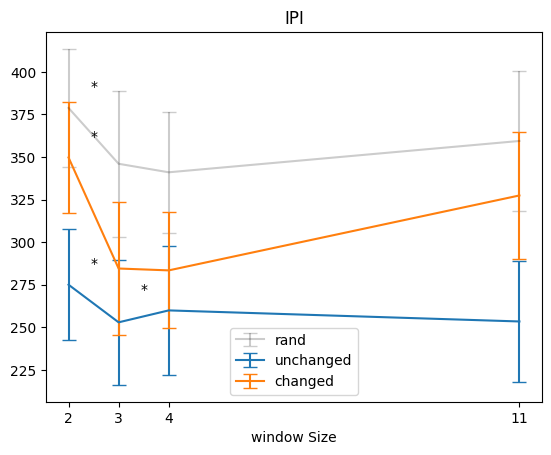

In [72]:
test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

finger_aggs = {}

for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks.groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

    if (flag_trained & flag_change):
        data = data[data['digitChangePos'] == 8]
        label = 'changed'

    if(flag_trained & ~flag_change):
        label = 'unchanged'

    if (flag_rand):
        label = 'rand'

    data = data.groupby(['SubNum', 'windowSize']).agg({
    'IPI_Value': lambda x: np.percentile(x, 40)
    }).reset_index()

    finger_aggs[label] = data
        
    data_agged = data.groupby('windowSize').agg({
        'IPI_Value': ['mean', 'sem']
    }).reset_index()

    plt.errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

    means = data_agged['IPI_Value']['mean']

    for i in range(len(windowSizes) - 1):
        t_stat, p_value = stats.ttest_rel(
            data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
            data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        )
        if p_value < 0.05:
            # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
            plt.text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
            # plt.annotate(f'*', (windowSizes[i], data_agged['IPI_Value']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')

    # Combine all data into a single DataFrame
combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                           finger_aggs['unchanged'].assign(condition='unchanged'),
                           finger_aggs['rand'].assign(condition='rand')])

print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())





plt.xticks(data_agged['windowSize'])
plt.title('IPI')
plt.legend()
plt.xlabel('window Size')
plt.show()


In [73]:
test_blocks[(test_blocks['digitChangePos'] + 1) == test_blocks['N']]

,BN,TN,SubNum,group,hand,isTrain,seq,windowSize,digitChangePos,digitChangeValue,...,N,Press_Number,Press_Value,Response_Number,Response_Value,isPressError,is_trained_seq,is_untrained_seq,is_rand_seq,is_digit_changed
24224,8,1,1,0,2,0,35421252143,2,4,1,...,5,press5,1,response5,2,True,True,False,False,False
24228,8,5,1,0,2,0,35421252143,2,4,5,...,5,press5,5,response5,5,False,True,False,False,True
24230,8,7,1,0,2,0,13152153542,11,4,1,...,5,press5,1,response5,1,False,False,False,True,False
24236,8,13,1,0,2,0,42513142452,2,4,1,...,5,press5,1,response5,1,False,False,False,True,False
24237,8,14,1,0,2,0,13524232514,11,4,5,...,5,press5,5,response5,5,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63950,25,13,10,1,2,0,51423252413,3,8,4,...,9,press9,4,response9,4,False,True,False,False,False
63958,25,21,10,1,2,0,14325242135,4,8,1,...,9,press9,1,response9,1,False,True,False,False,False
63960,25,23,10,1,2,0,51423252413,2,8,4,...,9,press9,4,response9,4,False,True,False,False,False
63961,25,24,10,1,2,0,51423252413,4,8,3,...,9,press9,3,response9,3,False,True,False,False,True


In [ ]:
lookahead_window = 3

fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()


# test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['N'].isin([pos + 1 + lookahead for pos in digit_change])].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):
    # for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['N'].isin([pos + 1 + lookahead for pos in [4,6]])].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[(data['digitChangePos'] + 1) == (data['N'] + lookahead)]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI @ Change Pos + {lookahead}')
        axs[lookahead, 0].set_xlabel('window size')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()
        axs[lookahead, 0].set_ylim([0, 550])

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI Change + {lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI @ Change Pos + {lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



sns.despine(fig, trim = True)
fig.tight_layout()
plt.savefig(path_figs + "change_after_window_IPI.pdf", format = 'pdf')
plt.show()


************************** IPI Change - 0 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            12.4758 2.0000 18.0000 0.0004
windowSize            8.2251 3.0000 27.0000 0.0005
condition:windowSize  3.1626 6.0000 54.0000 0.0099

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            41.0994 1.0000  9.0000 0.0001
windowSize            6.0037 3.0000 27.0000 0.0029
condition:windowSize  3.2173 3.0000 27.0000 0.0385

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            16.0063 1.0000  9.0000 0.0031
windowSize            8.6664 3.0000 27.0000 0.0003
condition:windowSize  3.3053 3.0000 27.0000 0.0352

***************

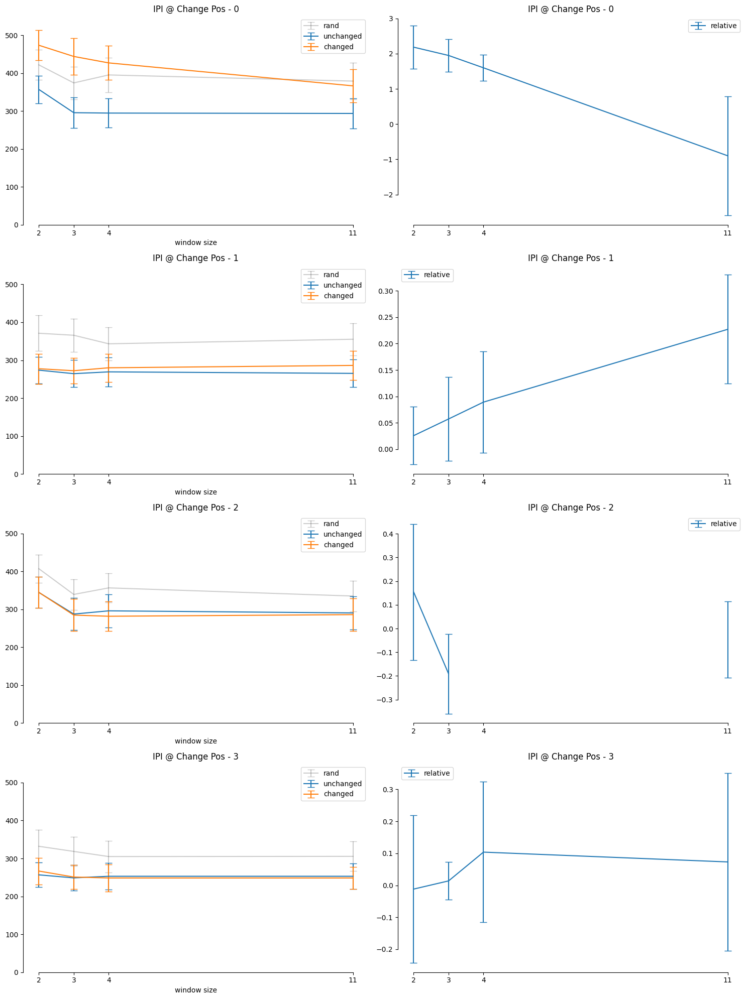

In [168]:
lookback_window = 4

fig, axs = plt.subplots(nrows=lookback_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookback in range(lookback_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['N'].isin([pos + 1 - lookback for pos in digit_change])].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[(data['digitChangePos'] + 1) == (data['N'] + lookback)]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookback, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookback, 0].set_title(f'IPI @ Change Pos - {lookback}')
        axs[lookback, 0].set_xlabel('window size')
        axs[lookback, 0].set_xticks(data_agged['windowSize'])
        axs[lookback, 0].legend()
        axs[lookback, 0].set_ylim([0, 550])

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI Change - {lookback} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookback, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookback, 1].set_title(f'IPI @ Change Pos - {lookback}')
    axs[lookback, 1].set_xticks(data_agged['windowSize'])
    axs[lookback, 1].legend()



sns.despine(fig, trim = True)
fig.tight_layout()
plt.savefig(path_figs + "Change_window_IPI.pdf", format = 'pdf')
plt.show()


************************** IPI Change - 0 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            12.4099 2.0000 18.0000 0.0004
windowSize           11.0675 3.0000 27.0000 0.0001
condition:windowSize  2.2445 6.0000 54.0000 0.0526

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            38.9274 1.0000  9.0000 0.0002
windowSize            6.7846 3.0000 27.0000 0.0015
condition:windowSize  2.2439 3.0000 27.0000 0.1060

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            16.3194 1.0000  9.0000 0.0029
windowSize           10.7372 3.0000 27.0000 0.0001
condition:windowSize  1.9441 3.0000 27.0000 0.1463

***************

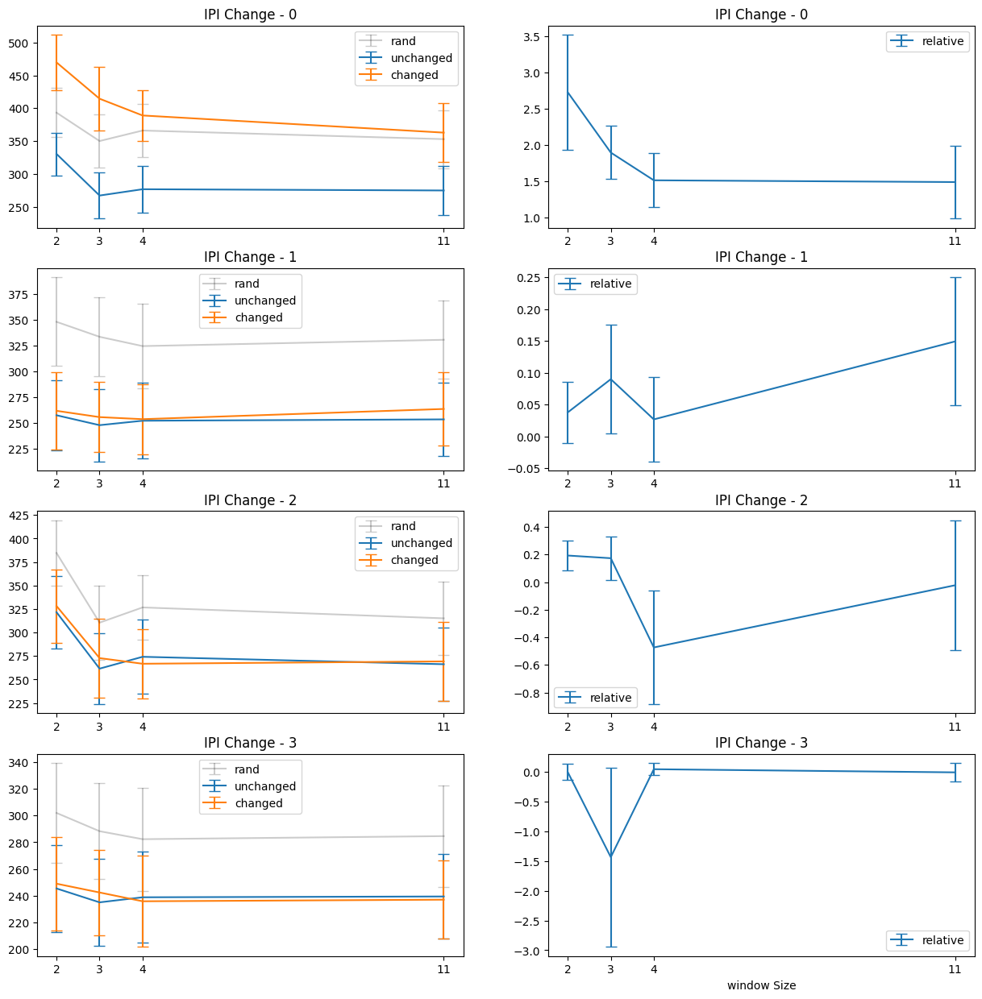

In [75]:
lookback_window = 4

fig, axs = plt.subplots(nrows=lookback_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_presses, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookback in range(lookback_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['N'].isin([pos + 1 - lookback for pos in digit_change])].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[(data['digitChangePos'] + 1) == (data['N'] + lookback)]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookback, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookback, 0].set_title(f'IPI Change - {lookback}')
        axs[lookback, 0].set_xticks(data_agged['windowSize'])
        axs[lookback, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI Change - {lookback} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookback, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookback, 1].set_title(f'IPI Change - {lookback}')
    axs[lookback, 1].set_xticks(data_agged['windowSize'])
    axs[lookback, 1].legend()



plt.xlabel('window Size')
plt.show()


************************** IPI4 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            26.7648 2.0000 18.0000 0.0000
windowSize            4.5628 3.0000 27.0000 0.0104
condition:windowSize  1.2687 6.0000 54.0000 0.2872

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            40.5450 1.0000  9.0000 0.0001
windowSize            3.9476 3.0000 27.0000 0.0186
condition:windowSize  1.7107 3.0000 27.0000 0.1884

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            33.0500 1.0000  9.0000 0.0003
windowSize            3.6401 3.0000 27.0000 0.0252
condition:windowSize  1.7124 3.0000 27.0000 0.1881

*************************

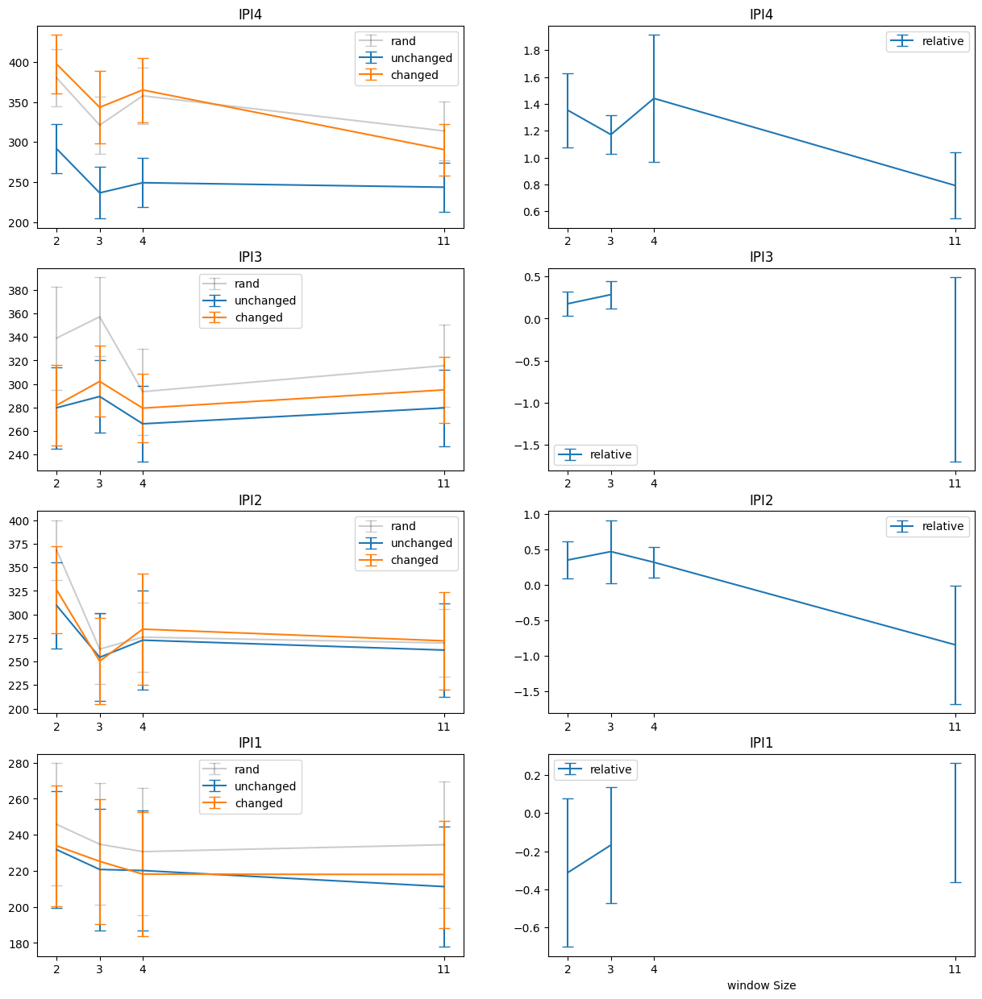

In [76]:
lookahead_window = 4
changed_digit_pos = 4
fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['IPI_Number'] == ('IPI' + str(changed_digit_pos - lookahead))].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == changed_digit_pos]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI{changed_digit_pos - lookahead}')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI{changed_digit_pos - lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI{changed_digit_pos - lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



plt.xlabel('window Size')
plt.show()


************************** IPI4 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            25.8785 2.0000 18.0000 0.0000
windowSize            5.4012 3.0000 27.0000 0.0048
condition:windowSize  1.9785 6.0000 54.0000 0.0848

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            41.0809 1.0000  9.0000 0.0001
windowSize            4.3092 3.0000 27.0000 0.0132
condition:windowSize  0.1467 3.0000 27.0000 0.9309

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            36.1006 1.0000  9.0000 0.0002
windowSize            5.3013 3.0000 27.0000 0.0053
condition:windowSize  1.9884 3.0000 27.0000 0.1395

*************************

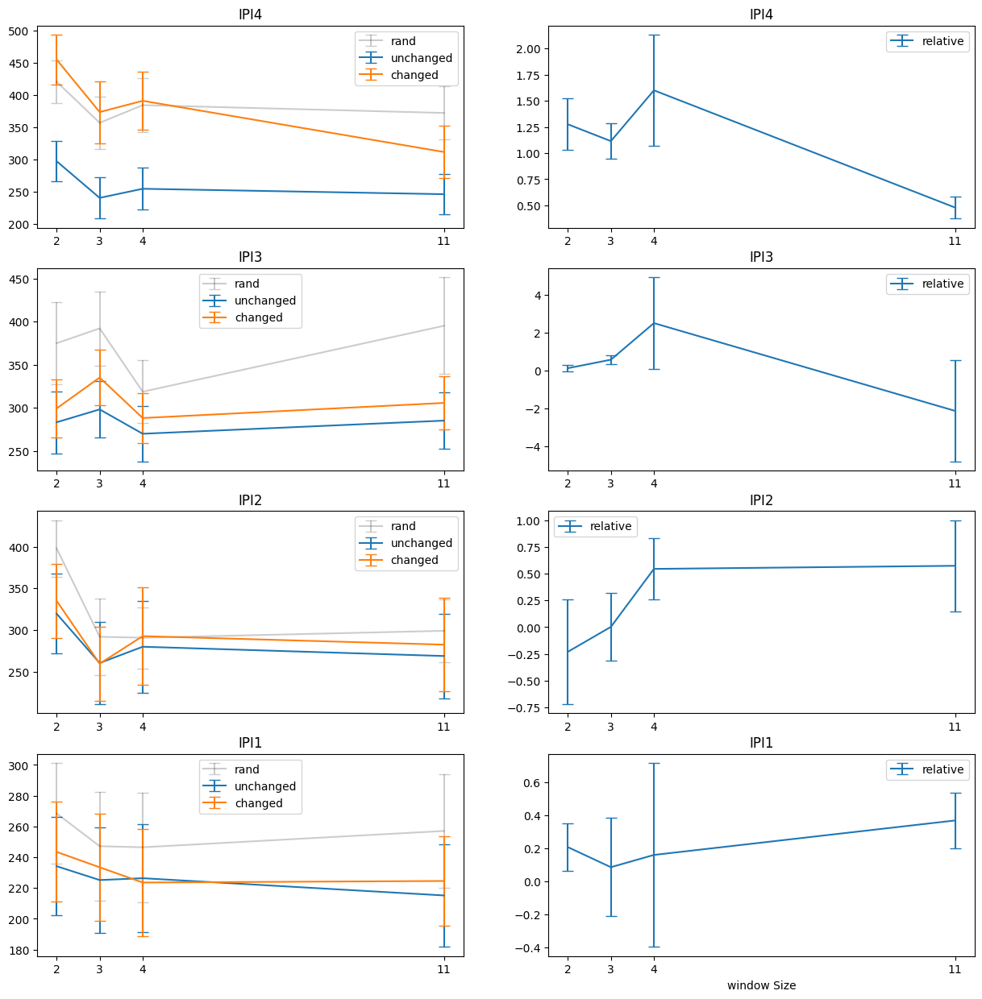

In [77]:
lookahead_window = 4
changed_digit_pos = 4
fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['IPI_Number'] == ('IPI' + str(changed_digit_pos - lookahead))].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == changed_digit_pos]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI{changed_digit_pos - lookahead}')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI{changed_digit_pos - lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI{changed_digit_pos - lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



plt.xlabel('window Size')
plt.show()


************************** IPI6 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             3.2405 2.0000 18.0000 0.0628
windowSize            6.8065 3.0000 27.0000 0.0015
condition:windowSize  1.0638 6.0000 54.0000 0.3956

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            13.7644 1.0000  9.0000 0.0048
windowSize            3.7696 3.0000 27.0000 0.0222
condition:windowSize  1.3313 3.0000 27.0000 0.2848

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             4.0476 1.0000  9.0000 0.0751
windowSize            6.2054 3.0000 27.0000 0.0024
condition:windowSize  0.9798 3.0000 27.0000 0.4169

*************************

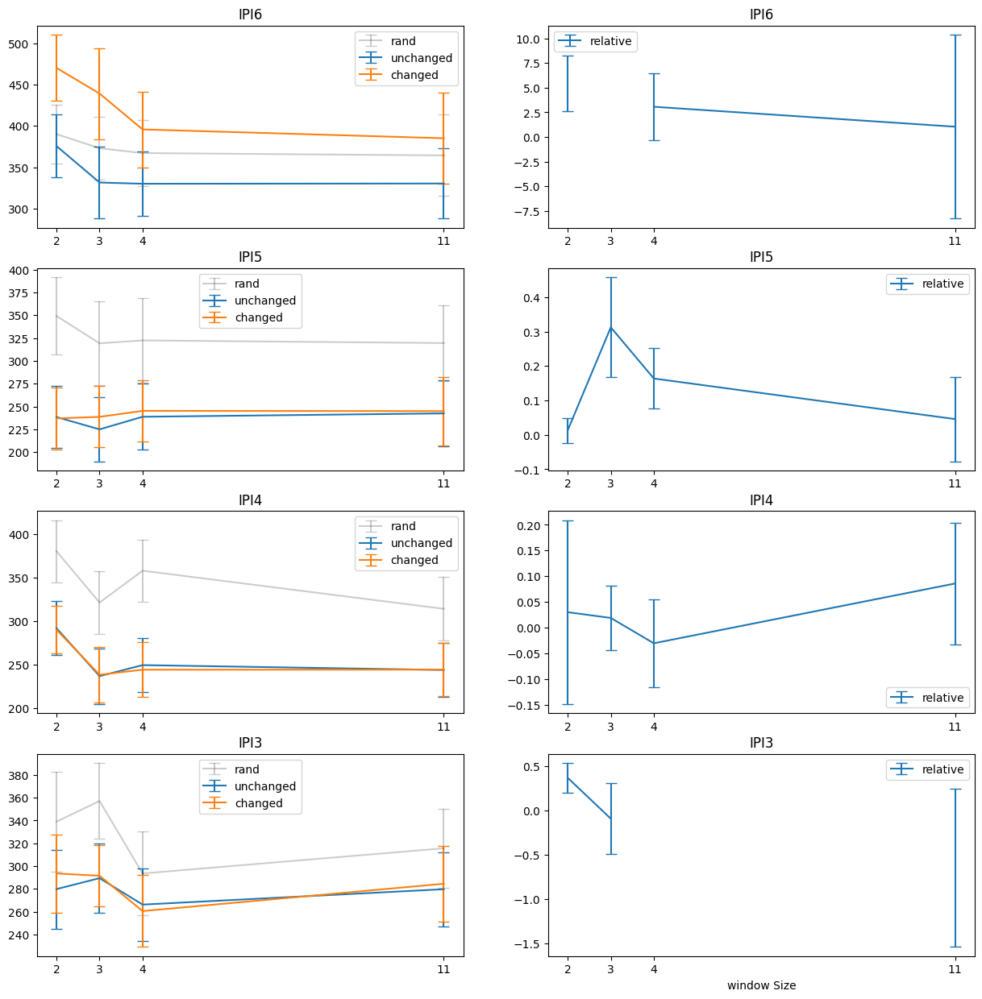

In [78]:
lookahead_window = 4
changed_digit_pos = 6
fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['IPI_Number'] == ('IPI' + str(changed_digit_pos - lookahead))].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == changed_digit_pos]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI{changed_digit_pos - lookahead}')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI{changed_digit_pos - lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI{changed_digit_pos - lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



plt.xlabel('window Size')
plt.show()


************************** IPI6 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             3.3469 2.0000 18.0000 0.0581
windowSize            6.8672 3.0000 27.0000 0.0014
condition:windowSize  1.0553 6.0000 54.0000 0.4007

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            40.9180 1.0000  9.0000 0.0001
windowSize            3.2304 3.0000 27.0000 0.0379
condition:windowSize  1.1614 3.0000 27.0000 0.3426

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition             4.4841 1.0000  9.0000 0.0633
windowSize            6.0243 3.0000 27.0000 0.0028
condition:windowSize  1.1104 3.0000 27.0000 0.3621

*************************

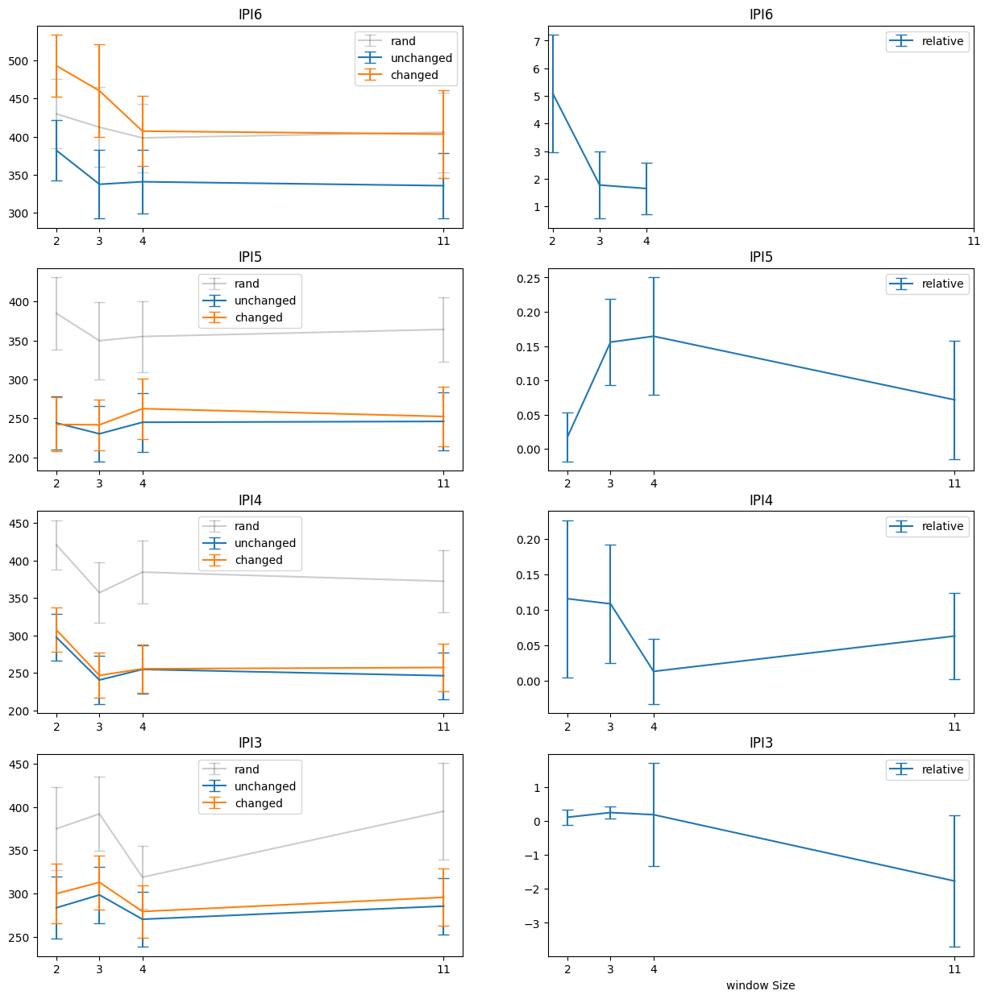

In [79]:
lookahead_window = 4
changed_digit_pos = 6
fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['IPI_Number'] == ('IPI' + str(changed_digit_pos - lookahead))].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == changed_digit_pos]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI{changed_digit_pos - lookahead}')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI{changed_digit_pos - lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI{changed_digit_pos - lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



plt.xlabel('window Size')
plt.show()


************************** IPI8 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            15.3090 2.0000 18.0000 0.0001
windowSize            3.6786 3.0000 27.0000 0.0242
condition:windowSize  0.8628 6.0000 54.0000 0.5282

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            29.3585 1.0000  9.0000 0.0004
windowSize            7.3229 3.0000 27.0000 0.0010
condition:windowSize  0.6713 3.0000 27.0000 0.5771

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            21.0807 1.0000  9.0000 0.0013
windowSize            2.6288 3.0000 27.0000 0.0706
condition:windowSize  0.9333 3.0000 27.0000 0.4381

*************************

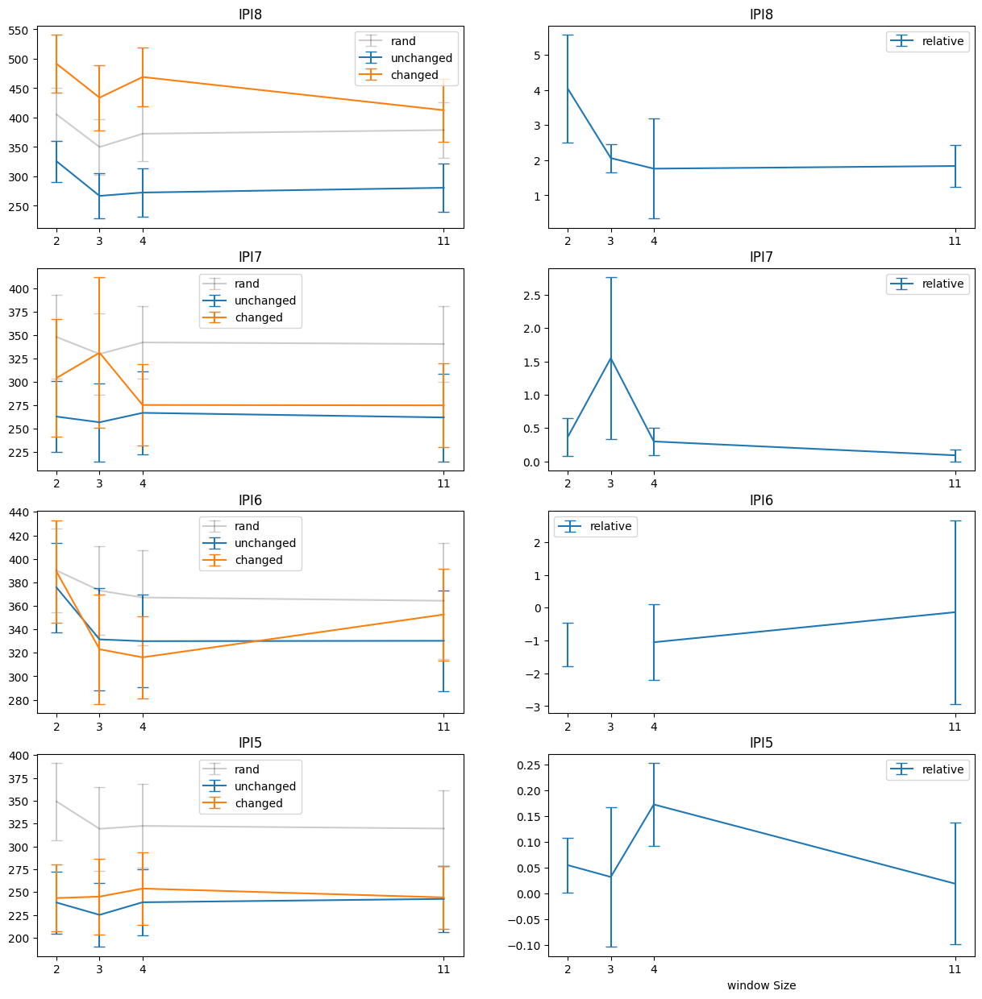

In [80]:
lookahead_window = 4
changed_digit_pos = 8
fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['IPI_Number'] == ('IPI' + str(changed_digit_pos - lookahead))].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == changed_digit_pos]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI{changed_digit_pos - lookahead}')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI{changed_digit_pos - lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI{changed_digit_pos - lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



plt.xlabel('window Size')
plt.show()


************************** IPI8 **************************************
All Three: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            11.7356 2.0000 18.0000 0.0005
windowSize            3.2771 3.0000 27.0000 0.0362
condition:windowSize  0.2201 6.0000 54.0000 0.9687

unchanged_rand: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            29.5511 1.0000  9.0000 0.0004
windowSize            4.9349 3.0000 27.0000 0.0073
condition:windowSize  0.7720 3.0000 27.0000 0.5198

changed_unchanged: 
                       Anova
                     F Value Num DF  Den DF Pr > F
--------------------------------------------------
condition            16.2723 1.0000  9.0000 0.0030
windowSize            2.0582 3.0000 27.0000 0.1294
condition:windowSize  0.2831 3.0000 27.0000 0.8371

*************************

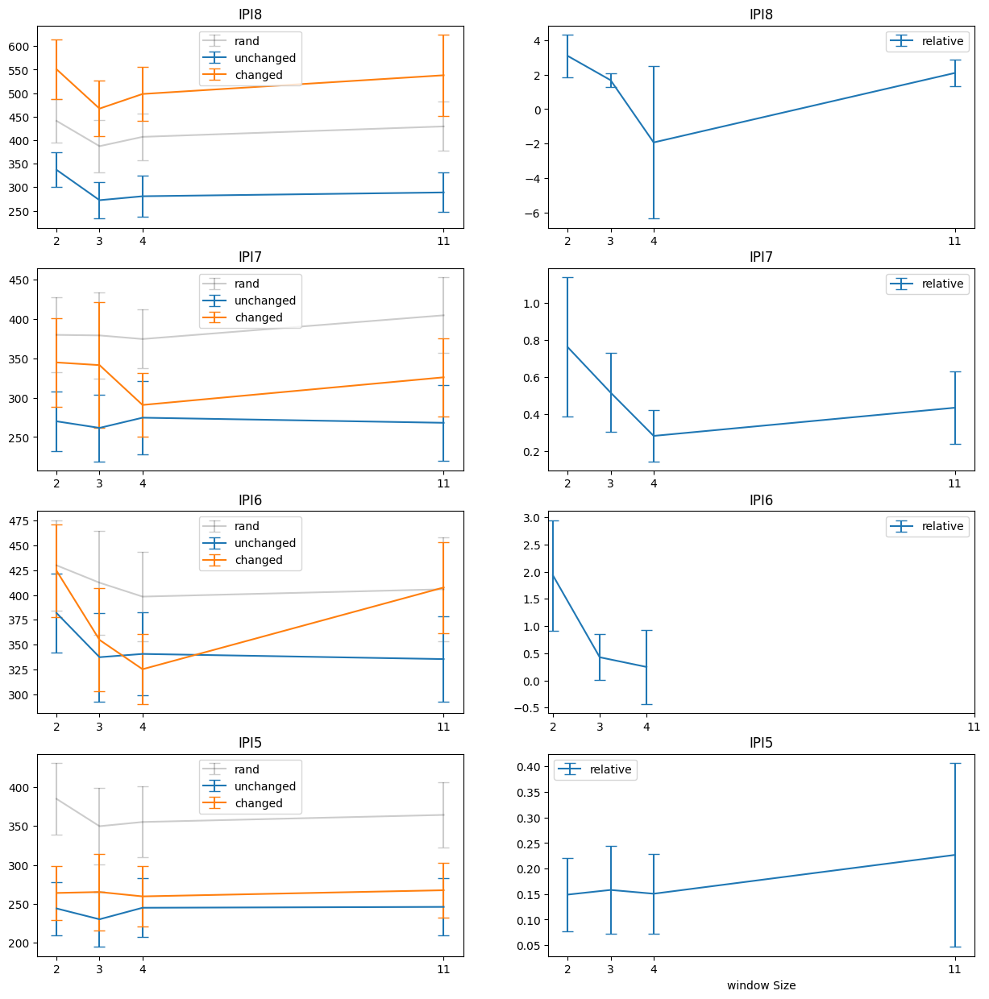

In [81]:
lookahead_window = 4
changed_digit_pos = 8
fig, axs = plt.subplots(nrows=lookahead_window, ncols=2 , figsize= (15,15))

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

test_blocks['IPI_Value'] = test_blocks.apply(utils.correct_error_trial_IPI, axis = 1)

# test_blocks = utils.remove_error_trials_presses(test_blocks)

kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}

for lookahead in range(lookahead_window):

    finger_aggs = {}

    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['IPI_Number'] == ('IPI' + str(changed_digit_pos - lookahead))].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == changed_digit_pos]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'windowSize']).agg({
        'IPI_Value': lambda x: np.percentile(x, 40)
        }).reset_index()

        finger_aggs[label] = data
  
        data_agged = data.groupby('windowSize').agg({
            'IPI_Value': ['mean', 'sem']
        }).reset_index()

        axs[lookahead, 0].errorbar(data_agged['windowSize'], data_agged['IPI_Value']['mean'], yerr = data_agged['IPI_Value']['sem'], label = label, capsize=5, **kwargs[label])

        means = data_agged['IPI_Value']['mean']

        # for i in range(len(windowSizes) - 1):
        #     t_stat, p_value = stats.ttest_rel(
        #         data[data['windowSize'] == windowSizes[i]]['IPI_Value'], 
        #         data[data['windowSize'] == windowSizes[i + 1]]['IPI_Value'], 

        #     )
        #     if p_value < 0.05:
        #         # plt.plot(windowSizes[i:i+2], means[i:i+2], color = 'black')
        #         axs[lookahead].text((windowSizes[i] + windowSizes[i + 1]) / 2, max(means[i], means[i + 1]) + 10, '*', color='black', ha='center')
        #         # plt.annotate(f'*', (windowSizes[i], data_agged['norm_MT']['mean'][i]), textcoords="offset points", xytext=(0, 10), ha='center')


        axs[lookahead, 0].set_title(f'IPI{changed_digit_pos - lookahead}')
        axs[lookahead, 0].set_xticks(data_agged['windowSize'])
        axs[lookahead, 0].legend()

        # Combine all data into a single DataFrame
    combined_data = pd.concat([finger_aggs['changed'].assign(condition='changed'),
                            finger_aggs['unchanged'].assign(condition='unchanged'),
                            finger_aggs['rand'].assign(condition='rand')])
    
    print(f"************************** IPI{changed_digit_pos - lookahead} **************************************")

    print("All Three: \n", AnovaRM(data=combined_data, depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("unchanged_rand: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'rand'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())
    print("changed_unchanged: \n", AnovaRM(data=combined_data[combined_data['condition'].isin(['unchanged', 'changed'])], depvar='IPI_Value', subject='SubNum', within=['condition', 'windowSize']).fit())



    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'windowSize'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'windowSize'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})
    merged_df['rel'] = (merged_df['IPI_Value_changed'] - merged_df['IPI_Value_unchanged'])/(merged_df['IPI_Value_rand'] - merged_df['IPI_Value_unchanged'])

    data_agged = merged_df.groupby('windowSize').agg({
            'rel': ['mean', 'sem']
        }).reset_index()
     
    axs[lookahead, 1].errorbar(data_agged['windowSize'], data_agged['rel']['mean'], yerr = data_agged['rel']['sem'], label = 'relative', capsize=5)
    axs[lookahead, 1].set_title(f'IPI{changed_digit_pos - lookahead}')
    axs[lookahead, 1].set_xticks(data_agged['windowSize'])
    axs[lookahead, 1].legend()



plt.xlabel('window Size')
plt.show()


IPI:  IPI0 TtestResult(statistic=-0.5624847840964702, pvalue=0.5875204090617154, df=9)
IPI:  IPI1 TtestResult(statistic=0.46336997056592516, pvalue=0.6541005856181727, df=9)
IPI:  IPI10 TtestResult(statistic=0.14936653548786952, pvalue=0.8845579362193976, df=9)
IPI:  IPI2 TtestResult(statistic=-0.2106222548354485, pvalue=0.8378734343907172, df=9)
IPI:  IPI3 TtestResult(statistic=1.4564571809033717, pvalue=0.179249482863545, df=9)
IPI:  IPI4 TtestResult(statistic=3.8761749275864466, pvalue=0.0037532367256208786, df=9)
IPI:  IPI5 TtestResult(statistic=0.4455476450243897, pvalue=0.6664484720026707, df=9)
IPI:  IPI6 TtestResult(statistic=2.797185910544907, pvalue=0.020808080839230178, df=9)
IPI:  IPI7 TtestResult(statistic=3.1408091318490463, pvalue=0.011912496381716159, df=9)
IPI:  IPI8 TtestResult(statistic=0.8383477332623654, pvalue=0.4235408591083213, df=9)
IPI:  IPI9 TtestResult(statistic=-1.2188822643663344, pvalue=0.2538717084319747, df=9)


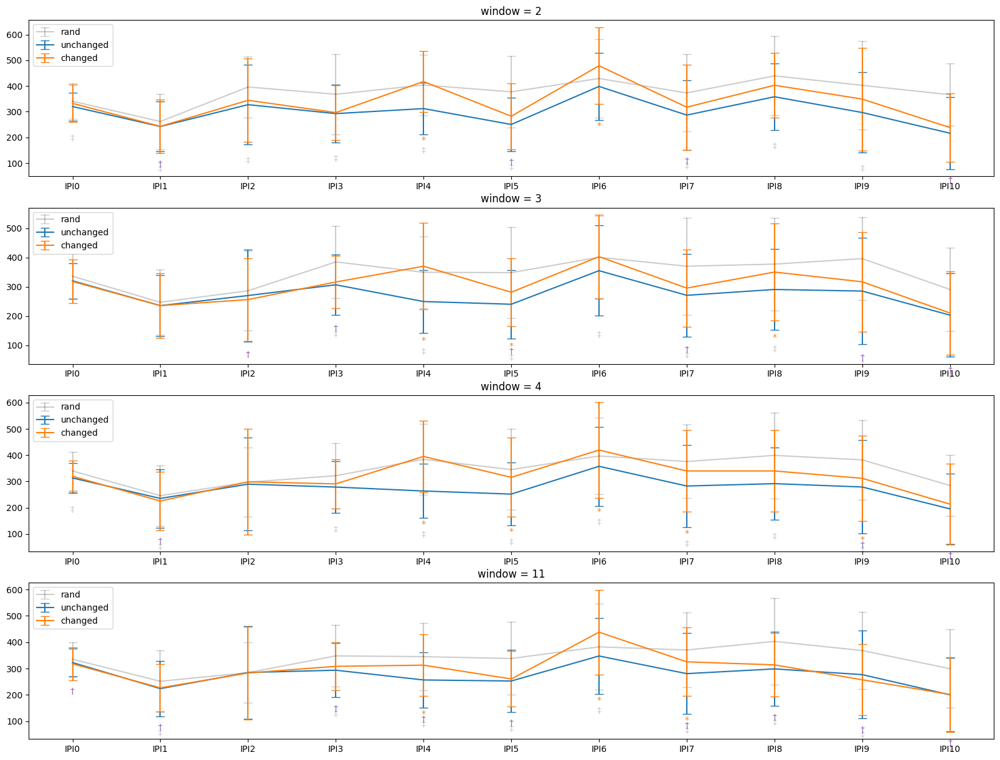

In [82]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

session3_blocks = utils.remove_error_trials_presses(session3_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 4]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=-0.29035421628785185, pvalue=0.7781244166696313, df=9)
IPI:  IPI1 TtestResult(statistic=1.1512516122808234, pvalue=0.27929456828960025, df=9)
IPI:  IPI10 TtestResult(statistic=-0.37465370094672246, pvalue=0.716593613267825, df=9)
IPI:  IPI2 TtestResult(statistic=2.3629515853626786, pvalue=0.04239583119560847, df=9)
IPI:  IPI3 TtestResult(statistic=0.5307223808480049, pvalue=0.6084560289812826, df=9)
IPI:  IPI4 TtestResult(statistic=5.4696839333767775, pvalue=0.0003954214102895017, df=9)
IPI:  IPI5 TtestResult(statistic=0.5819637315647873, pvalue=0.5748770606282916, df=9)
IPI:  IPI6 TtestResult(statistic=3.689095107187424, pvalue=0.005004398113013248, df=9)
IPI:  IPI7 TtestResult(statistic=2.7160378790283146, pvalue=0.023761438891771073, df=9)
IPI:  IPI8 TtestResult(statistic=1.0599407828354046, pvalue=0.31678733662325964, df=9)
IPI:  IPI9 TtestResult(statistic=0.11041015567772822, pvalue=0.9145069746331012, df=9)


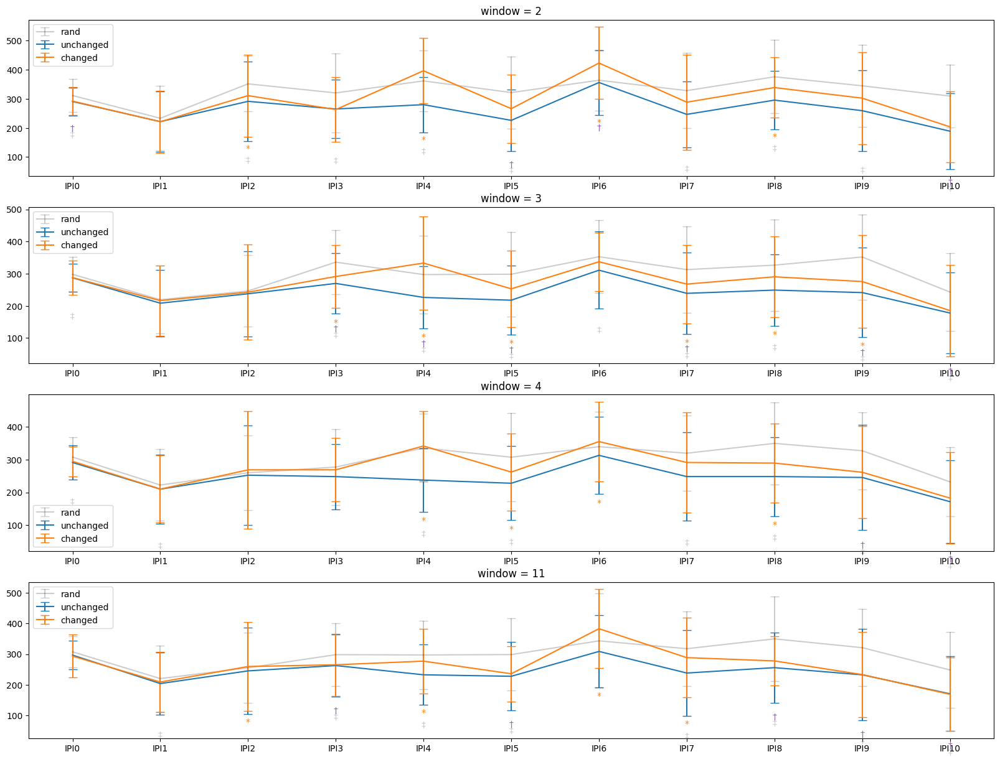

In [83]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# session3_blocks = session3_blocks[session3_blocks['SubNum'] != 2]

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_presses, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 4]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=-1.0259679718388748, pvalue=0.3316905022897236, df=9)
IPI:  IPI1 TtestResult(statistic=0.30151134457776363, pvalue=0.7698749998921366, df=9)
IPI:  IPI10 TtestResult(statistic=-0.021544853701693744, pvalue=0.9832811264487544, df=9)
IPI:  IPI2 TtestResult(statistic=0.9692974888645917, pvalue=0.3577225717998501, df=9)
IPI:  IPI3 TtestResult(statistic=-0.33125872447956445, pvalue=0.7480318088081764, df=9)
IPI:  IPI4 TtestResult(statistic=-0.9230769230769231, pvalue=0.3800487120450542, df=9)
IPI:  IPI5 TtestResult(statistic=0.15861031714362883, pvalue=0.8774779057728196, df=9)
IPI:  IPI6 TtestResult(statistic=1.2698834607981435, pvalue=0.23597486384468175, df=9)
IPI:  IPI7 TtestResult(statistic=2.9124431628356686, pvalue=0.017242550345407382, df=9)
IPI:  IPI8 TtestResult(statistic=1.8872949830223087, pvalue=0.09173171439838264, df=9)
IPI:  IPI9 TtestResult(statistic=3.691722740658232, pvalue=0.004984060492648153, df=9)


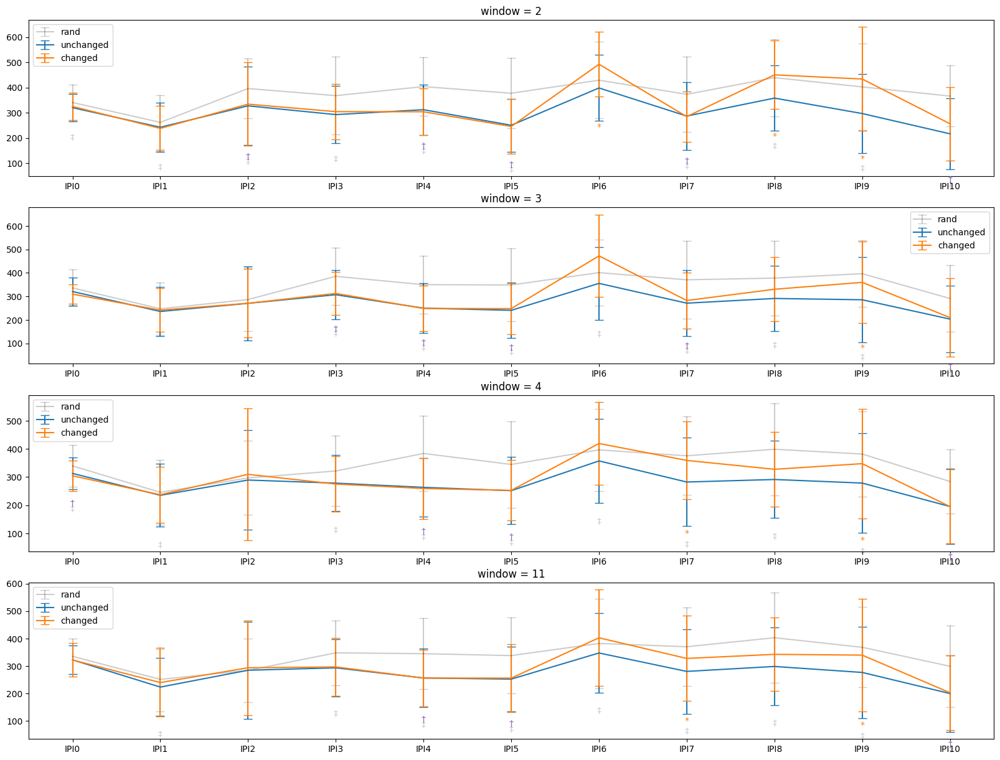

In [84]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

session3_blocks = utils.remove_error_trials_presses(session3_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 6]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=-0.8241043075060035, pvalue=0.43117743138148534, df=9)
IPI:  IPI1 TtestResult(statistic=1.2272539077244187, pvalue=0.2508598994915623, df=9)
IPI:  IPI10 TtestResult(statistic=1.9988543435746344, pvalue=0.07669434895691135, df=9)
IPI:  IPI2 TtestResult(statistic=0.8922641705170896, pvalue=0.3954810539824871, df=9)
IPI:  IPI3 TtestResult(statistic=0.7177911047378748, pvalue=0.49109658259026245, df=9)
IPI:  IPI4 TtestResult(statistic=-1.8194871573418359, pvalue=0.10218634879566331, df=9)
IPI:  IPI5 TtestResult(statistic=0.3954686192183725, pvalue=0.7017073470701882, df=9)
IPI:  IPI6 TtestResult(statistic=1.498866234895633, pvalue=0.16813919342430186, df=9)
IPI:  IPI7 TtestResult(statistic=1.9921056382436966, pvalue=0.07753310846198827, df=9)
IPI:  IPI8 TtestResult(statistic=2.750423483127421, pvalue=0.022461247735571812, df=9)
IPI:  IPI9 TtestResult(statistic=3.2041180089728796, pvalue=0.010759969847278318, df=9)


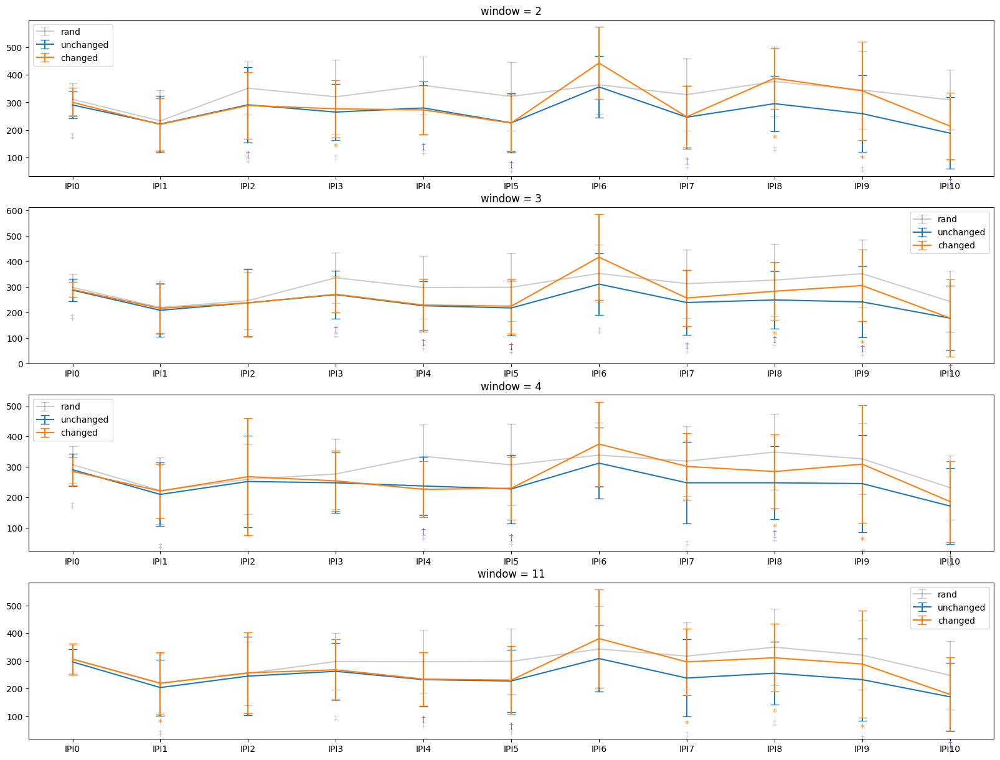

In [85]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# session3_blocks = session3_blocks[session3_blocks['SubNum'] != 2]

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_presses, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 6]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=0.6503496503496503, pvalue=0.5317151487562746, df=9)
IPI:  IPI1 TtestResult(statistic=-1.0140062843547175, pvalue=0.33706276230266874, df=9)
IPI:  IPI10 TtestResult(statistic=3.1039267442193563, pvalue=0.012642104381781217, df=9)
IPI:  IPI2 TtestResult(statistic=0.8049844718999243, pvalue=0.4415749080000475, df=9)
IPI:  IPI3 TtestResult(statistic=1.2892447378137466, pvalue=0.22946009650283689, df=9)
IPI:  IPI4 TtestResult(statistic=-0.05093532772312674, pvalue=0.9604896113696542, df=9)
IPI:  IPI5 TtestResult(statistic=1.318538204979894, pvalue=0.2198892268462199, df=9)
IPI:  IPI6 TtestResult(statistic=-1.333657373288459, pvalue=0.21508217082091202, df=9)
IPI:  IPI7 TtestResult(statistic=0.9098431565585487, pvalue=0.38662292370844664, df=9)
IPI:  IPI8 TtestResult(statistic=4.231142994741324, pvalue=0.002202893566930908, df=9)
IPI:  IPI9 TtestResult(statistic=2.7563572465402895, pvalue=0.022244292099257403, df=9)


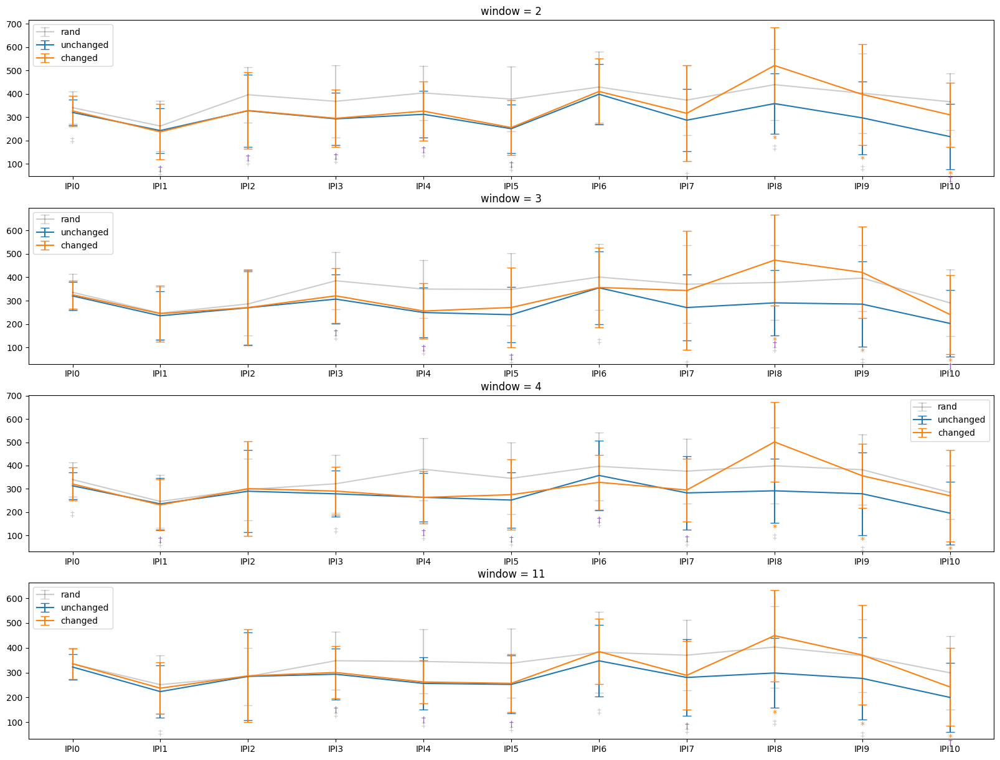

In [86]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

session3_blocks = utils.remove_error_trials_presses(session3_blocks)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 8]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': 'median'
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 4):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')


IPI:  IPI0 TtestResult(statistic=2.2248499875911136, pvalue=0.053141699705124786, df=9)
IPI:  IPI1 TtestResult(statistic=3.458919113703382, pvalue=0.007173029401364643, df=9)
IPI:  IPI10 TtestResult(statistic=3.3874658538882367, pvalue=0.008031308258113377, df=9)
IPI:  IPI2 TtestResult(statistic=0.7882944524798025, pvalue=0.4507877342809692, df=9)
IPI:  IPI3 TtestResult(statistic=1.7308492459899467, pvalue=0.11752828058620966, df=9)
IPI:  IPI4 TtestResult(statistic=2.702757600793799, pvalue=0.024283784224311968, df=9)
IPI:  IPI5 TtestResult(statistic=0.5074219720082713, pvalue=0.6240588615059499, df=9)
IPI:  IPI6 TtestResult(statistic=1.1408894834893135, pvalue=0.2833640364250911, df=9)
IPI:  IPI7 TtestResult(statistic=2.6754223313052137, pvalue=0.025395820900814183, df=9)
IPI:  IPI8 TtestResult(statistic=3.335675064582348, pvalue=0.00871996815740105, df=9)
IPI:  IPI9 TtestResult(statistic=2.759057728347023, pvalue=0.022146260290425386, df=9)


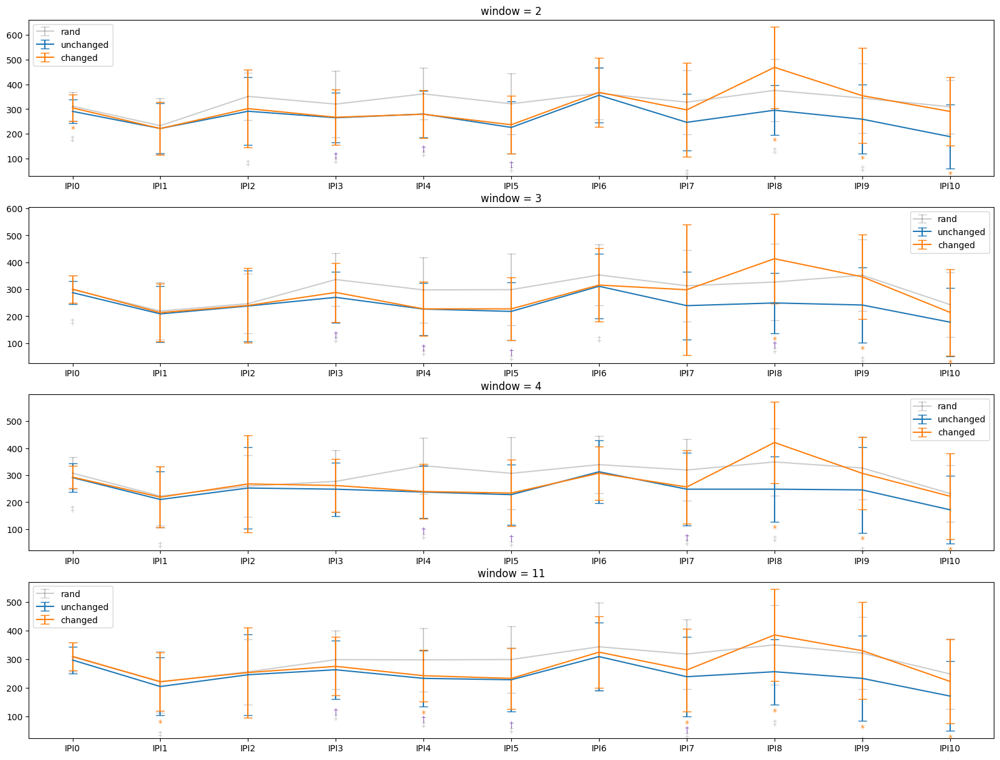

In [87]:
fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
kwargs = {'changed': {'color': 'C1', 'alpha': 1}, 'unchanged': {'color': 'C0', 'alpha': 1}, 'rand': {'color': 'black', 'alpha': 0.2}}


session3_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))].copy()

# session3_blocks = session3_blocks[session3_blocks['SubNum'] != 2]

session3_blocks['IPI_Value'] = session3_blocks.apply(utils.correct_error_presses, axis = 1)


finger_aggs = {}

for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(session3_blocks[session3_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & flag_change):
            data = data[data['digitChangePos'] == 8]
            label = 'changed'

        if(flag_trained & ~flag_change):
            label = 'unchanged'

        if (flag_rand):
            label = 'rand'

        data = data.groupby(['SubNum', 'IPI_Number']).agg({
            'IPI_Value': lambda x: np.percentile(x, 30)
            # 'IPI_Value': 'median'
        }).reset_index()

        finger_aggs[label] = data

        finger_agg = data.groupby(['IPI_Number']).agg({
            'IPI_Value': ['mean', 'std']
        }).reset_index()

        finger_agg = finger_agg.iloc[index_natsorted(finger_agg['IPI_Number'])].reset_index(drop=True)
        axs[idx].errorbar(finger_agg['IPI_Number'], finger_agg['IPI_Value']['mean'], yerr = finger_agg['IPI_Value']['std'], label = label, capsize = capsize, **kwargs[label])


    #Statistical Signficance Tests
    merged_df = finger_aggs['changed'].merge(finger_aggs['unchanged'], on = ['SubNum', 'IPI_Number'], suffixes=('_changed', '_unchanged'))
    merged_df = merged_df.merge(finger_aggs['rand'], on = ['SubNum', 'IPI_Number'])
    merged_df = merged_df.rename(columns={'IPI_Value': 'IPI_Value_rand'})

    for IPI in merged_df['IPI_Number'].unique():
        IPI_data = merged_df[merged_df['IPI_Number'] == IPI]
        ttest_changed_vs_unchanged = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_unchanged'])
        ttest_changed_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_changed'], IPI_data['IPI_Value_rand'])
        ttest_unchanged_vs_rand = stats.ttest_rel(IPI_data['IPI_Value_unchanged'], IPI_data['IPI_Value_rand'])
        
        # Add significance symbols just above the error bars
        changed_mean = IPI_data['IPI_Value_changed'].mean()
        changed_std = IPI_data['IPI_Value_changed'].std()
        unchanged_mean = IPI_data['IPI_Value_unchanged'].mean()
        unchanged_std = IPI_data['IPI_Value_unchanged'].std()
        rand_mean = IPI_data['IPI_Value_rand'].mean()
        rand_std = IPI_data['IPI_Value_rand'].std()

        y_pos_changed = changed_mean - changed_std  # Adjust to place the asterisks above the error bars
        y_pos_unchanged = unchanged_mean - unchanged_std 
        y_pos_rand = rand_mean - rand_std

        y_pos = min(y_pos_changed, y_pos_rand, y_pos_unchanged)

        if ttest_changed_vs_unchanged.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 40, '*', ha='center', va='bottom', color='C1')

        if ttest_changed_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 60, '†', ha='center', va='bottom', color='C4')

        if ttest_unchanged_vs_rand.pvalue < 0.05:
            axs[idx].text(IPI, y_pos - 80, '‡', ha='center', va='bottom', color='black', alpha = 0.2)


        if(window == 11):
            print('IPI: ', IPI, ttest_changed_vs_unchanged)
            # if(IPI == 'IPI10'):
            #     IPI_diff = IPI_data['IPI_Value_changed'] - IPI_data['IPI_Value_unchanged']
            #     print(np.mean(IPI_diff))
            #     print(np.std(IPI_diff))
    
    axs[idx].legend()

    axs[idx].set_title(f'window = {window}')
    


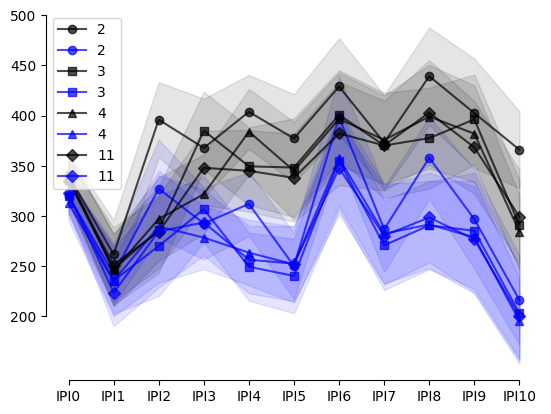

In [178]:
# fig, axs = plt.subplots(len(windowSizes), figsize= (20,15))
cmap = cm.Pastel1
capsize = 5
alphas = [0.1, 0.3, 0.5, 0.7, 0.9]
markers = ['o', 's', '^', 'D']

test_blocks = subjs_presses[subjs_presses['BN'].isin(list(range(8,16)) + list(range(18,26)))]

test_blocks = utils.remove_error_trials_presses(test_blocks)



for idx, window in enumerate(windowSizes):
    for _ ,((flag_trained, flag_rand, flag_change), data) in enumerate(test_blocks[test_blocks['windowSize'] == window].groupby(['is_trained_seq', 'is_rand_seq', 'is_digit_changed'])):

        if (flag_trained & ~flag_change):

            finger_agg_unchnaged = data.groupby(['SubNum', 'IPI_Number']).agg({
                'IPI_Value': 'median'
            }).reset_index()


            finger_agg_unchnaged = finger_agg_unchnaged.groupby(['IPI_Number']).agg({
                'IPI_Value': ['mean', 'sem']
            }).reset_index()

            finger_agg_unchnaged = finger_agg_unchnaged.iloc[index_natsorted(finger_agg_unchnaged['IPI_Number'])].reset_index(drop=True)
            # plt.errorbar(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'], yerr = finger_agg_unchnaged['IPI_Value']['sem'], 
            #              label = window, capsize = capsize,alpha = (len(windowSizes) - idx)/(len(windowSizes)+1), color = 'blue')

            plt.errorbar(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'], label = window, color = 'blue', 
                         fmt = '-' + markers[idx], alpha = 0.7)
            plt.fill_between(finger_agg_unchnaged['IPI_Number'], finger_agg_unchnaged['IPI_Value']['mean'] - finger_agg_unchnaged['IPI_Value']['sem'], 
                             finger_agg_unchnaged['IPI_Value']['mean'] + finger_agg_unchnaged['IPI_Value']['sem'], 
                             color = 'blue', alpha = 0.1)



        if (flag_rand):

            finger_agg_rand = data.groupby(['SubNum', 'IPI_Number']).agg({
                'IPI_Value': 'median'
            }).reset_index()

            finger_agg_rand = finger_agg_rand.groupby(['IPI_Number']).agg({
                'IPI_Value': ['mean', 'sem']
            }).reset_index()

            finger_agg_rand = finger_agg_rand.iloc[index_natsorted(finger_agg_rand['IPI_Number'])].reset_index(drop=True)
            # plt.errorbar(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'], yerr = finger_agg_rand['IPI_Value']['sem'], 
            #              color = 'black', label = window, capsize = capsize, alpha = (len(windowSizes) - idx)/(len(windowSizes)+1))
            plt.errorbar(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'], label = window, capsize = capsize, 
                         color = 'black', fmt = '-' + markers[idx], alpha = 0.7)
            plt.fill_between(finger_agg_rand['IPI_Number'], finger_agg_rand['IPI_Value']['mean'] - finger_agg_rand['IPI_Value']['sem'], 
                             finger_agg_rand['IPI_Value']['mean'] + finger_agg_rand['IPI_Value']['sem'], 
                             color = 'black', alpha = 0.1)


    plt.legend()
    sns.despine(trim=True)

    plt.savefig(path_figs + "IPI_Pattern.pdf", format = 'pdf')

    # axs[idx].set_title(f'window = {window}')


## Mov Files:

In [ ]:
def movload(fname):
    # loads .mov files given the path of the file. The .mov files have a specific custom hence the need for a custom function
    A = []
    fid = open(fname, 'rt')
    if fid == -1:
        raise Exception('Could not open ' + fname)


    num_columns = None 

    trial = 0
    for line in fid:
        if line[0] == 'T':
            print('Trial: ', line.split()[1])
            a = int(line.split()[1])
            trial += 1
            if a != trial:
                print('Trials out of sequence')
                trial = a
            A.append([])
            num_columns = None
            # A[trial-1] = np.empty((0,8))
        else:
            lineData = line.strip().split('\t')
            if num_columns is None:
                num_columns = len(lineData)
                A[trial - 1] = np.empty((0, num_columns))
            a = np.array([float(x) for x in lineData], ndmin=2)
            # print(a)
            A[trial-1] = np.vstack((A[trial-1],a))
            # A[trial-1].extend(a)

    fid.close()
    return A

In [ ]:
trials = movload('SDI1/SequenceDigitInterference_3_07.mov')

In [ ]:
dfs = []

for trial in trials:
    dfs.append(pd.DataFrame(trial, columns=['state', 'timeReal', 'time', 'force1', 'force2', 'force3', 'force4', 'force5']))

In [ ]:
for i in range(1,6):
    plt.plot(dfs[2]['time'], dfs[2][f'force{i}'], label = i)

plt.legend()